<font size = 3>
<h1 align="center">
IMPORTING MY FUNCTIONS

In [9]:
import Function_File_Version_6 as smFRET
import matplotlib.pyplot as plt

import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#stellt diese Benachrichtigung aus: "A value is trying to be set on a copy of a slice from a DataFrame"


<font size = 2>
<h1 align="center">
Part 1: Dataframe Creation, Global Adjustments and Creation of "Local Parameter CSV"

In [10]:
#filepath = "./dsDNA_FRETtraces_examples_MK.csv"
    # funktioniert
#filepath = "dsDNA_PEGylatedSlides_for noise thresholding only 2 IDs.csv"
    # findet ID nicht
#filepath = "./dsDNA_FRETtraces_examples_MK_bearbeitet2.csv"
    # Bei Gauß RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 10000.

#filepath = "./Sim_Level_1.csv"
#filepath = "./Sim_Level_1_short.csv"
#filepath = "./Sim_Level_2.csv"
#filepath = "./Sim_Level_2_short.csv"
#filepath = "./Sim_Level_3.csv"
filepath = "./Sim_Level_3_short.csv"

#First function:
header_section, data_section_raw = smFRET.create_dataframe_new(filepath)

local_parameters_path = "local_parameters.csv"
local_parameters_template = {"Group" : 2, "Bin" : 1, "Bleach range" : 60, "Bleach ratio": 20 , "Blink" : 8, "Additional cutoff" : 1}

#Second Function:
data_section_global = smFRET.adjust_dataframe_global(data_section_raw, header_section, local_parameters_template, local_parameters_path )

print("______________________________________________________________")
print("Parameter CSV wurde erstellt und kann nun bearbeitet werden!")
print("______________________________________________________________")

______________________________________________________
General Information about the CSV File:
______________________________________________________
   -> There is/are 29 different ID/s:
      {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29}
   -> There are 7238 rows

______________________________________________________
Header Section:
______________________________________________________
   -> The Header Section in the CSV file is empty
______________________________________________________________
Parameter CSV wurde erstellt und kann nun bearbeitet werden!
______________________________________________________________


<font size = 2>
<h1 align="center">
Part 2: Local Adjustments, Gaußian Fit, Print of Histograms and Traces

______________________________________________________
The following local adjustments were made:
______________________________________________________

BLEACHING:
   -> Bleaching happended at ID = 3, time start = 628.0 and time end = 986
   -> Bleaching happended at ID = 11, time start = 1070.0 and time end = 1680
   -> Bleaching happended at ID = 23, time start = 568.0 and time end = 950

BLINKING:

BINNING:
______________________________________________________________
HISTOGRAM OF RAW DATA:
______________________________________________________________
The value at 68.2% is 615.164
[260. 193. 171. 110.  63.  32.  15.  11.   7.  10.   6.   5.   7.   0.
   5.   3.   1.   1.   1.   1.]
<class 'numpy.ndarray'>
array('f', [4.0, 2.0, 6.0, 2.0, 7.0, 7.0, 5.0, 3.0, 2.0, 5.0, 6.0, 3.0])
<class 'array.array'>


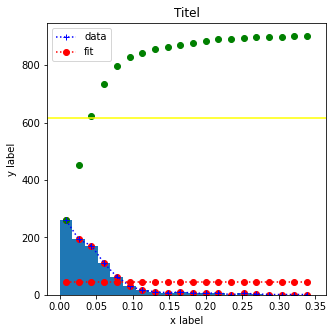

popt: letzter der drei Werte ist Sigma
[ 4.51419074e+01 -7.66211406e+05 -1.76175747e+07]
simga 2:
191.21464821462007
simga 3:
615.164
Problem letzter Wert - ich bräucht x wert dazu + es hängt vom fehleranfälligen maximalwert ab
______________________________________________________________
HISTOGRAM OF ADJUSTED DATA:
______________________________________________________________
The value at 68.2% is 557.8760000000001
[238. 173. 150.  93.  60.  31.  12.  12.   6.  10.   5.   5.  11.   6.
   1.   2.   1.   1.   0.   1.]
<class 'numpy.ndarray'>
array('f', [4.0, 2.0, 6.0, 2.0, 7.0, 7.0, 5.0, 3.0, 2.0, 5.0, 6.0, 3.0])
<class 'array.array'>


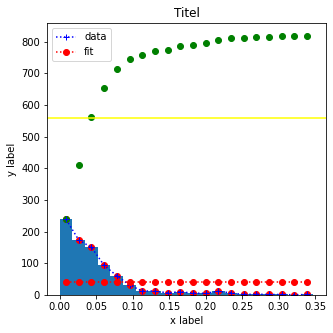

popt: letzter der drei Werte ist Sigma
[ 4.10870817e+01 -4.34099853e+05 -4.54155994e+06]
simga 2:
150.738112315365
simga 3:
557.8760000000001
Problem letzter Wert - ich bräucht x wert dazu + es hängt vom fehleranfälligen maximalwert ab


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


______________________________________________________________
PRINT OF INDIVIDUAL TRACES
______________________________________________________________
ID_set: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29}
There are 29 different IDs


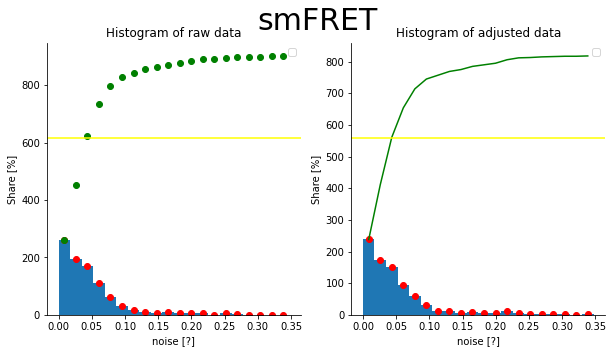

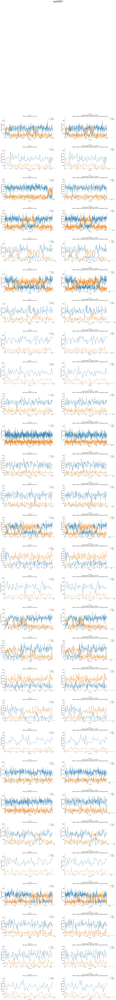

In [11]:

#Third Function:
data_section_global_and_local = smFRET.adjust_dataframe_local(data_section_global, local_parameters_path)


group_dict = { "" : "No Group assigned",
    0 : "Trash",
    1 : "Static",
    2 : "Dynamic",
    3 : "Donor only",
    4 : "Acceptor only",
    5 : "Aggregates",
    6 : "empty",
    7 : "empty",
    8 : "empty",
    9 : "others"}

    # Groups ja auch in ursprünglichem CSV! 
    # Davon übernehmen und über dict angeben was mit jeweiligen Gruppen geschieht!


#HISTOGRAMS:

    # no opimal fit values are found for gauß fit
    # Problem weil mehere IDs?

#----------------------------------------------------------------------------------------------------------
print("______________________________________________________________")
print("HISTOGRAM OF RAW DATA:")
print("______________________________________________________________")

noises1 = smFRET.haar_cyles(data_section_raw,2)
y_values1, y_values_cumu1, x_values1, value_crit1 = smFRET.histogram_fit(noises1, 20, 5)
test = smFRET.gaussian_curve_fit (x_values1, y_values1)
#test = gaussian_curve_fit (x_values, y_values_cumu)
print("simga 3:")
print(value_crit1)
print("Problem letzter Wert - ich bräucht x wert dazu + es hängt vom fehleranfälligen maximalwert ab")

#----------------------------------------------------------------------------------------------------------
print("______________________________________________________________")
print("HISTOGRAM OF ADJUSTED DATA:")
print("______________________________________________________________")

noises2 = smFRET.haar_cyles(data_section_global_and_local,2)
y_values2, y_values_cumu2, x_values2, value_crit2 = smFRET.histogram_fit(noises2, 20, 5)
test = smFRET.gaussian_curve_fit (x_values2, y_values2)
#test = gaussian_curve_fit (x_values, y_values_cumu)
print("simga 3:")
print(value_crit2)
print("Problem letzter Wert - ich bräucht x wert dazu + es hängt vom fehleranfälligen maximalwert ab")



# plt.scatter(x_values, y_values, c = "red")
# plt.rcParams['figure.figsize'] = [figsize, figsize]
# plt.show

# y_values_cumu = []
# current_value = 0

# for element in y_values:
#     current_value += element
#     y_values_cumu.append(current_value)

# #print(y_values_cumu)

# plt.scatter(x_values, y_values_cumu, c = "green")
# plt.show

# hundred_percent = y_values_cumu[-1]
# value_crit = hundred_percent * cutoff/100

# print(f"The value at {cutoff}% is {value_crit}")

# plt.axhline(y=value_crit, color="yellow", linestyle='-')
# plt.show

# y_values_cumu = array.array("f", y_values_cumu)
#     #?????????????????????????????????????????

# return y_values, y_values_cumu, x_values, value_crit

#Hide this in the histogram function?

fig, axes = plt.subplots(1, 2, figsize=(10,5))
fig.suptitle("smFRET", fontsize=30)
fig.subplots_adjust(hspace = 0.5, wspace = 0.2)

axes[0].hist(noises1, 20)
axes[0].scatter(x_values1, y_values1, c = "red")
axes[0].scatter(x_values1, y_values_cumu1, c = "green")
axes[0].axhline(y=value_crit1, color="yellow", linestyle='-')
axes[0].set_title("Histogram of raw data")
#axes[0, 0].set_xlim(0,x_limit_g_l)
#axes[0, 0].set_ylim(0,y_limit_g_l)
axes[0].legend()
axes[0].set_axisbelow(True)

axes[1].hist(noises2, 20)
axes[1].scatter(x_values2, y_values2, c = "red")
axes[1].plot(x_values2, y_values_cumu2, c = "green")
axes[1].axhline(y=value_crit2, color="yellow", linestyle='-')
axes[1].set_title("Histogram of adjusted data")
#axes[0, 1].set_xlim(0,x_limit_g_l)
#axes[0, 1].set_ylim(0,y_limit_g_l)
axes[1].legend()
axes[1].set_axisbelow(True)

for axes in axes.flat:
    axes.set(xlabel='noise [?]', ylabel='Share [%]')
    axes.spines["right"].set_visible(False)
    axes.spines["top"].set_visible(False)
    
#----------------------------------------------------------------------------------------------------------
print("______________________________________________________________")
print("PRINT OF INDIVIDUAL TRACES")
print("______________________________________________________________")

smFRET.plot_dataframe(data_section_global_and_local,  data_section_global,  local_parameters_path, group_dict)


<font size = 2>
<h1 align="center">
Part 3: Levels into Traces and Data Export

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29}
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 1                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 34, 'value': 0.9988629950494256}, {'index': 13, 'value': 0.425702612359809}, {'index': 34, 'value': 1.0525830438343795}, {'index': 13, 'value': 0.425702612359809}]


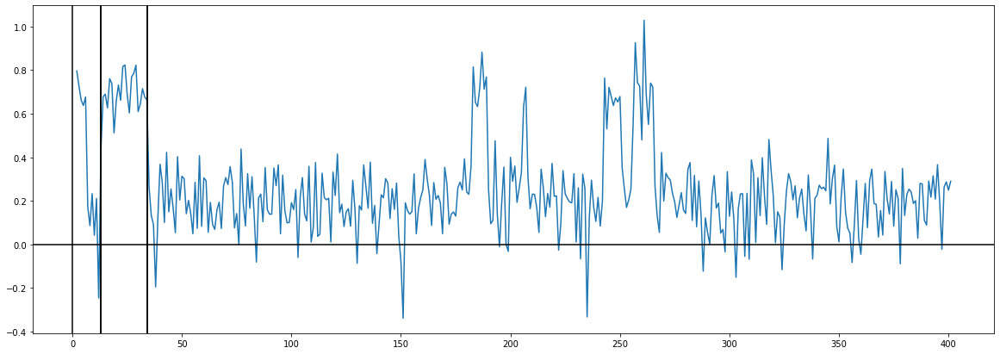

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 34, 13, 34, 13]
Transitionpoints indices without doubles: [ 0 13 34]
Transitionpoints ordered: [0, 13, 34]
START:
0
______________
END
13
______________
START:
13
______________
END
34
______________
START:
34
______________
END
-1
______________
MEANS:
[{'mean': 0.40038461538461545, 'start': 0, 'end': 13}, {'mean': 0.699095238095238, 'start': 13, 'end': 34}, {'mean': 0.22677595628415317, 'start': 34, 'end': -1}]


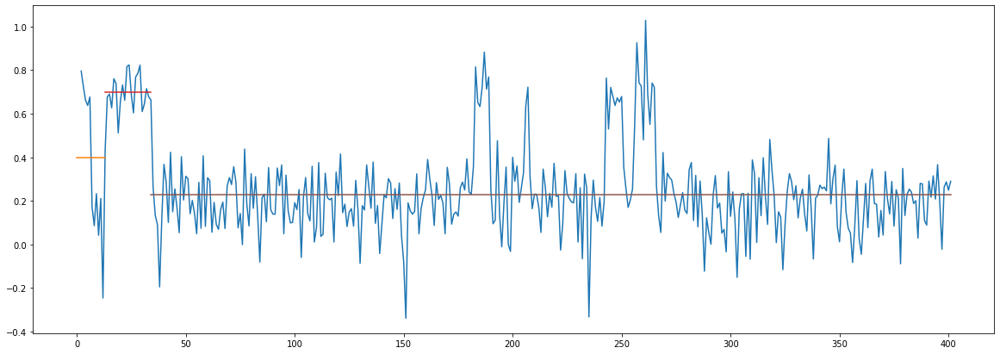

The value at 68.2% is 2.0460000000000003


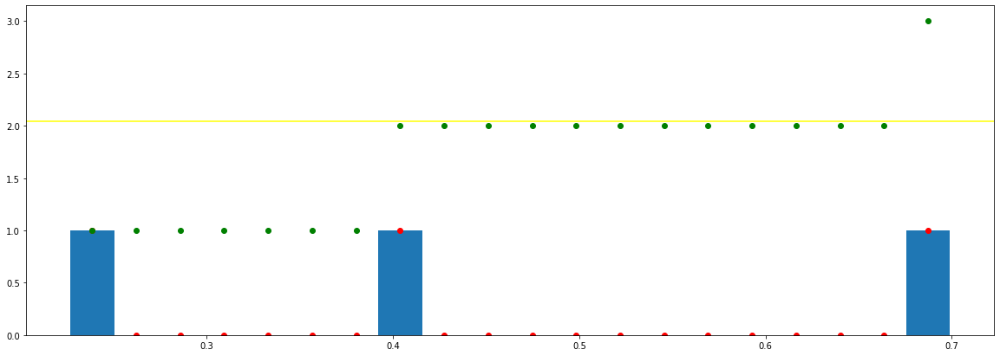

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.47231928181108485
New curren min is 0.29871062271062254
New curren min is 0.17360865910046228
MEAN BEFORE:
[{'mean': 0.40038461538461545, 'start': 0, 'end': 13}, {'mean': 0.699095238095238, 'start': 13, 'end': 34}, {'mean': 0.22677595628415317, 'start': 34, 'end': -1}]
MEANS AFTER
[{'mean': 0.3135802858343843, 'start': 0, 'end': 13}, {'mean': 0.699095238095238, 'start': 13, 'end': 34}, {'mean': 0.3135802858343843, 'start': 34, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.3135802858343843}, {'x': 34, 'y_1': 0.699095238095238, 'y_2': 0.3135802858343843}, {'x': 13, 'y_1': 0.3135802858343843, 'y_2': 0.699095238095238}, {'x': 34, 'y_1': 0.699095238095238, 'y_2': 0.3135802858343843}, {'x': 13, 'y_1': 0.3135802858343843, 'y_2': 0.699095238095238}]


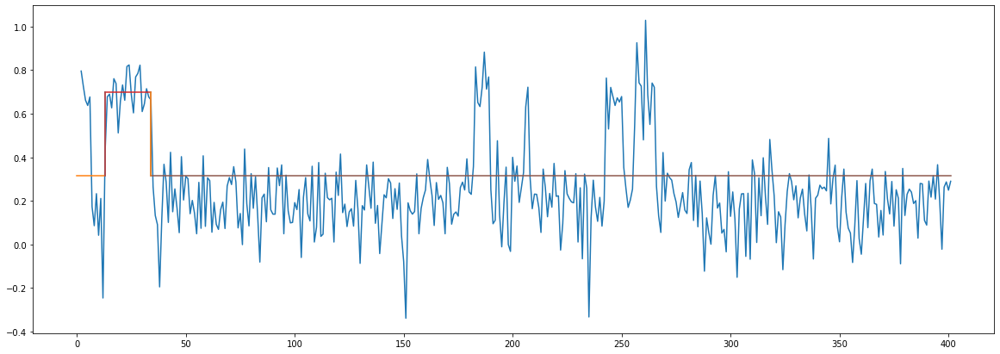

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.3855149522608537
New curren min is 0.3855149522608537
MEAN BEFORE:
[{'mean': 0.3135802858343843, 'start': 0, 'end': 13}, {'mean': 0.699095238095238, 'start': 13, 'end': 34}, {'mean': 0.3135802858343843, 'start': 34, 'end': -1}]
MEANS AFTER
[{'mean': 0.5063377619648112, 'start': 0, 'end': 13}, {'mean': 0.5063377619648112, 'start': 13, 'end': 34}, {'mean': 0.5063377619648112, 'start': 34, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.5063377619648112}, {'x': 34, 'y_1': 0.5063377619648112, 'y_2': 0.5063377619648112}, {'x': 13, 'y_1': 0.5063377619648112, 'y_2': 0.5063377619648112}, {'x': 34, 'y_1': 0.5063377619648112, 'y_2': 0.5063377619648112}, {'x': 13, 'y_1': 0.5063377619648112, 'y_2': 0.5063377619648112}]


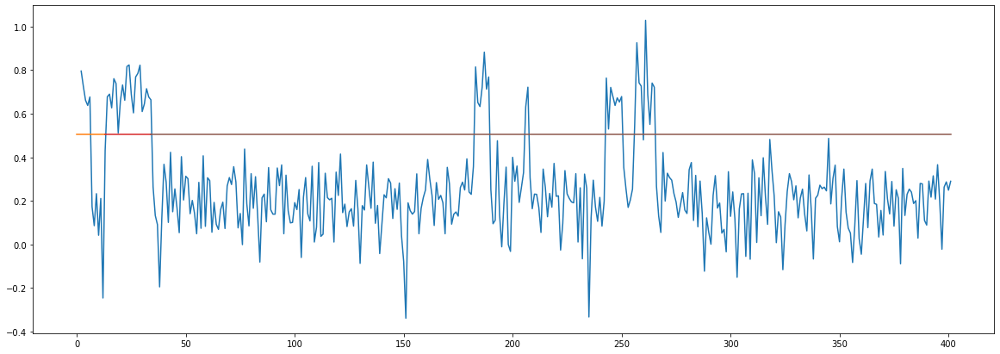

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 2                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 9, 'value': 0.7247380034481168}, {'index': 8, 'value': 0.33345977289455603}, {'index': 8, 'value': 0.33345977289455603}, {'index': 8, 'value': 0.33345977289455603}]


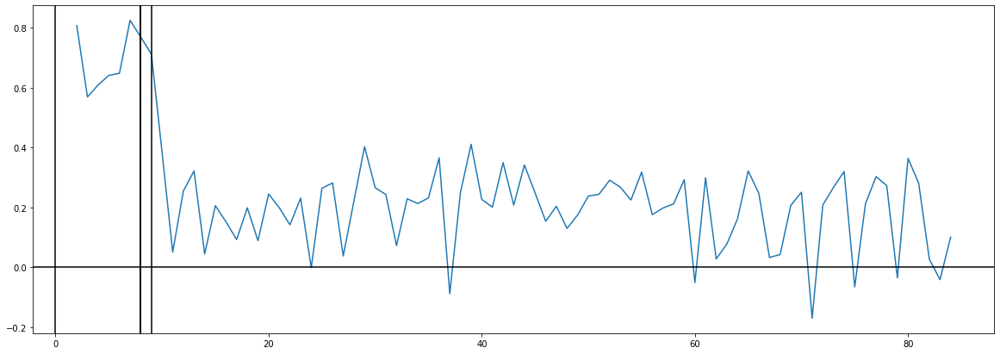

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 9, 8, 8, 8]
Transitionpoints indices without doubles: [0 8 9]
Transitionpoints ordered: [0, 8, 9]
START:
0
______________
END
8
______________
START:
8
______________
END
9
______________
START:
9
______________
END
-1
______________
MEANS:
[{'mean': 0.707375, 'start': 0, 'end': 8}, {'mean': 0.7120000000000001, 'start': 8, 'end': 9}, {'mean': 0.19298648648648645, 'start': 9, 'end': -1}]


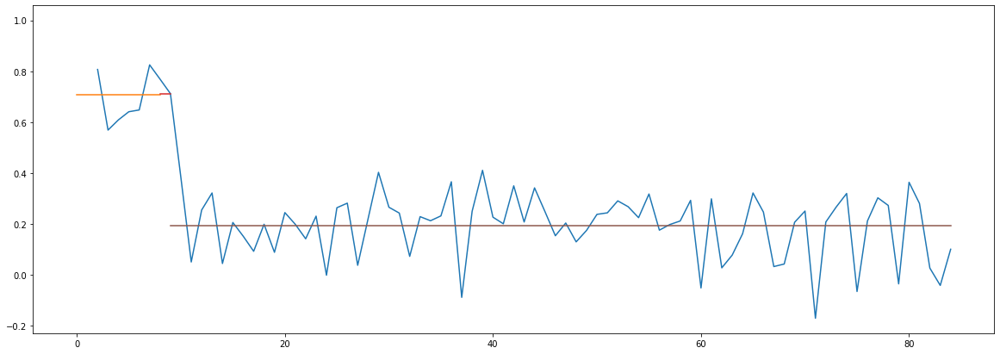

The value at 68.2% is 2.0460000000000003


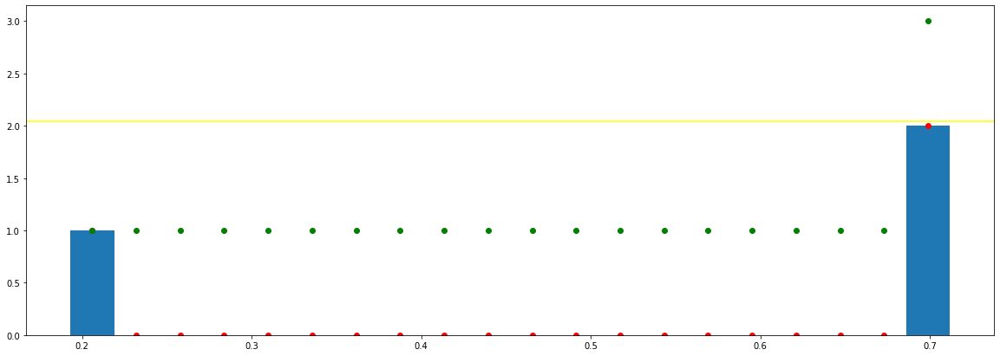

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.5190135135135137
New curren min is 0.004625000000000101
New curren min is 0.5143885135135136
MEAN BEFORE:
[{'mean': 0.707375, 'start': 0, 'end': 8}, {'mean': 0.7120000000000001, 'start': 8, 'end': 9}, {'mean': 0.19298648648648645, 'start': 9, 'end': -1}]
MEANS AFTER
[{'mean': 0.7096875, 'start': 0, 'end': 8}, {'mean': 0.7096875, 'start': 8, 'end': 9}, {'mean': 0.19298648648648645, 'start': 9, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.7096875}, {'x': 9, 'y_1': 0.7096875, 'y_2': 0.19298648648648645}, {'x': 8, 'y_1': 0.7096875, 'y_2': 0.7096875}, {'x': 8, 'y_1': 0.7096875, 'y_2': 0.7096875}, {'x': 8, 'y_1': 0.7096875, 'y_2': 0.7096875}]


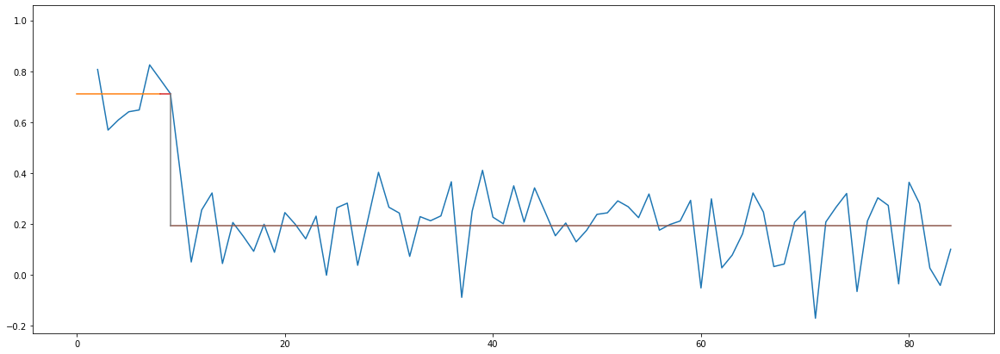

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.5167010135135136
New curren min is 0.5167010135135136
MEAN BEFORE:
[{'mean': 0.7096875, 'start': 0, 'end': 8}, {'mean': 0.7096875, 'start': 8, 'end': 9}, {'mean': 0.19298648648648645, 'start': 9, 'end': -1}]
MEANS AFTER
[{'mean': 0.4513369932432432, 'start': 0, 'end': 8}, {'mean': 0.4513369932432432, 'start': 8, 'end': 9}, {'mean': 0.4513369932432432, 'start': 9, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.4513369932432432}, {'x': 9, 'y_1': 0.4513369932432432, 'y_2': 0.4513369932432432}, {'x': 8, 'y_1': 0.4513369932432432, 'y_2': 0.4513369932432432}, {'x': 8, 'y_1': 0.4513369932432432, 'y_2': 0.4513369932432432}, {'x': 8, 'y_1': 0.4513369932432432, 'y_2': 0.4513369932432432}]


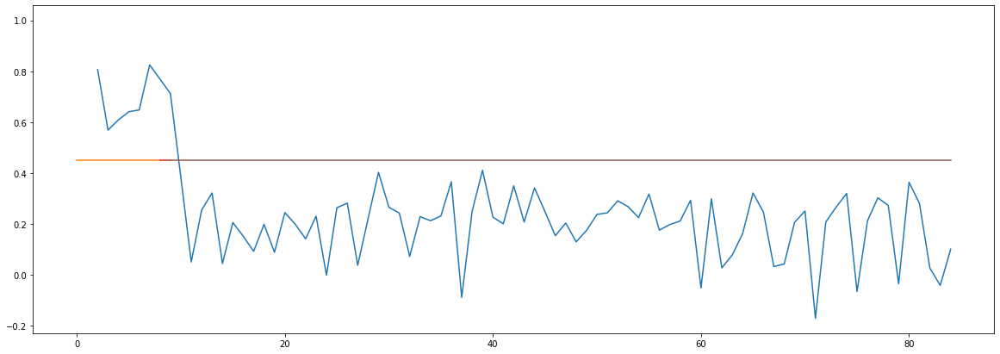

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 3                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
[{'index': 0, 'value': 0}, {'index': 312, 'value': 0.8324283560361427}]


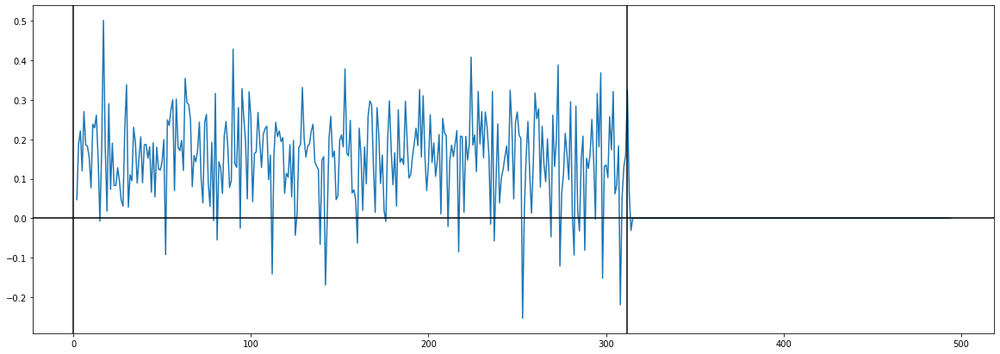

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 312]
Transitionpoints indices without doubles: [  0 312]
Transitionpoints ordered: [0, 312]
START:
0
______________
END
312
______________
START:
312
______________
END
-1
______________
MEANS:
[{'mean': 0.1557660256410256, 'start': 0, 'end': 312}, {'mean': 0.00020994475138121551, 'start': 312, 'end': -1}]


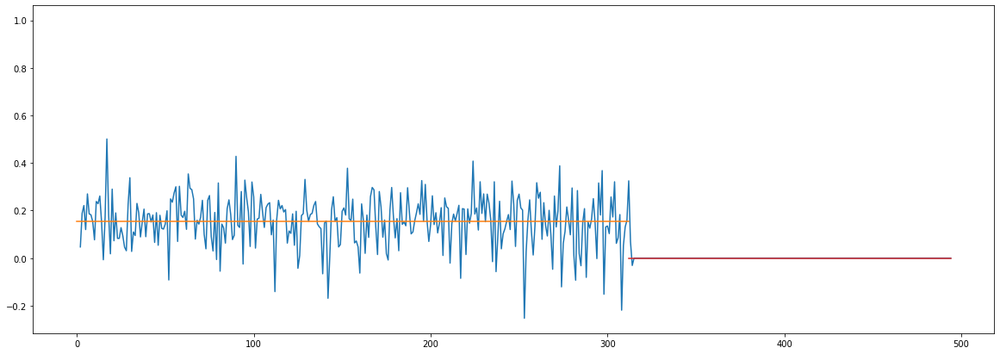

The value at 68.2% is 1.364


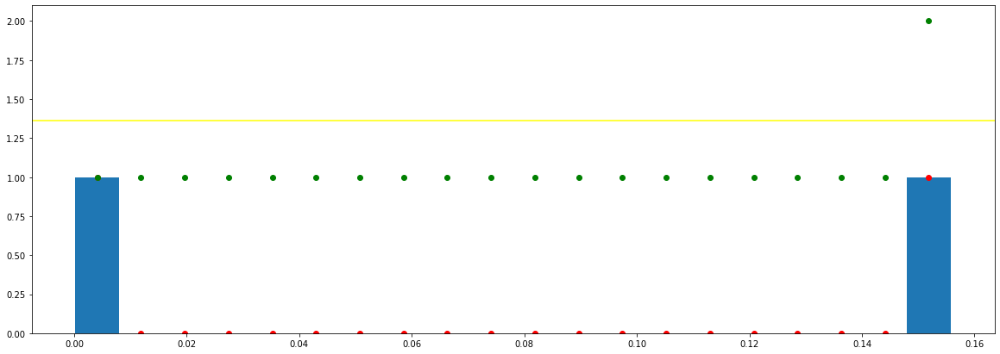

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.15555608088964437
MEAN BEFORE:
[{'mean': 0.1557660256410256, 'start': 0, 'end': 312}, {'mean': 0.00020994475138121551, 'start': 312, 'end': -1}]
MEANS AFTER
[{'mean': 0.07798798519620341, 'start': 0, 'end': 312}, {'mean': 0.07798798519620341, 'start': 312, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.07798798519620341}, {'x': 312, 'y_1': 0.07798798519620341, 'y_2': 0.07798798519620341}]


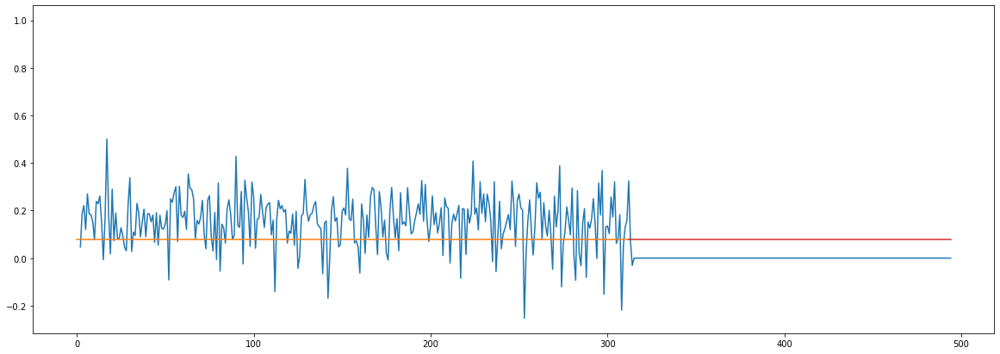

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 4                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 357, 'value': 1.084513151134379}, {'index': 181, 'value': 1.6931795989685918}, {'index': 337, 'value': 1.8521659779167123}, {'index': 181, 'value': 1.6931795989685918}]


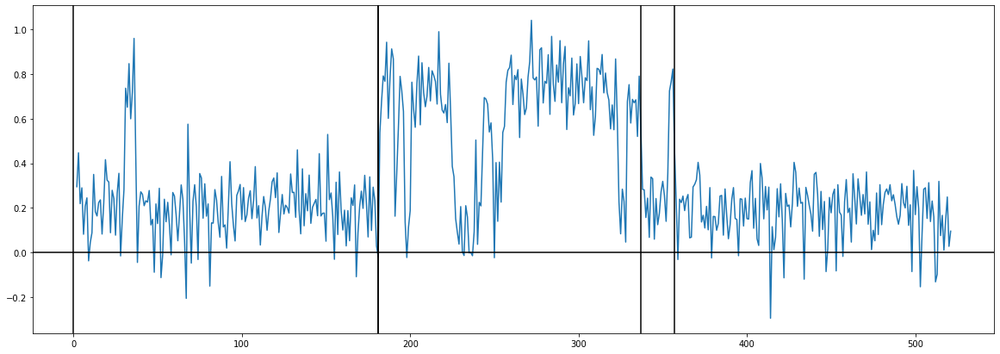

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 357, 181, 337, 181]
Transitionpoints indices without doubles: [  0 181 337 357]
Transitionpoints ordered: [0, 181, 337, 357]
START:
0
______________
END
181
______________
START:
181
______________
END
337
______________
START:
337
______________
END
357
______________
START:
357
______________
END
-1
______________
MEANS:
[{'mean': 0.21349171270718223, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.32075, 'start': 337, 'end': 357}, {'mean': 0.18390797546012266, 'start': 357, 'end': -1}]


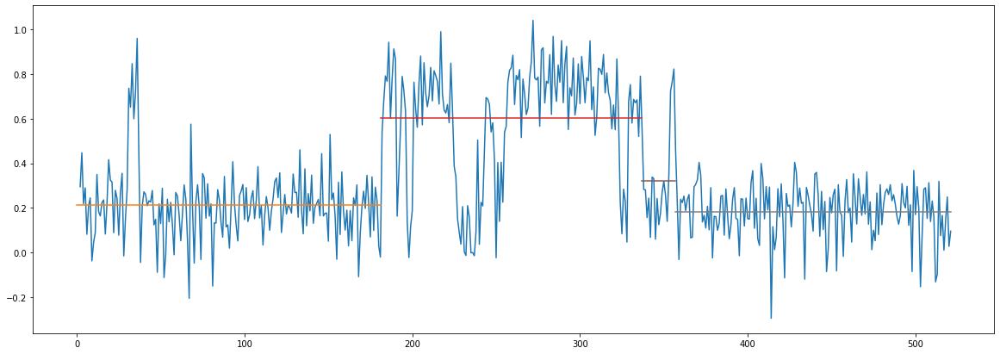

The value at 68.2% is 2.728


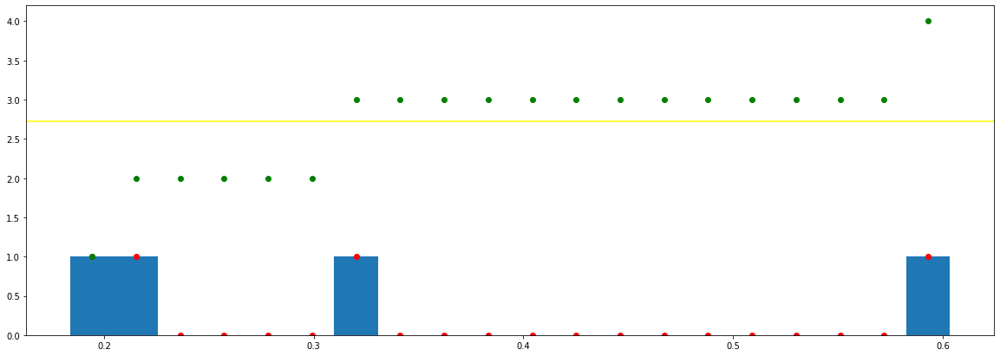

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.13684202453987732
New curren min is 0.3899762360107668
New curren min is 0.10725828729281775
New curren min is 0.029583737247059566
New curren min is 0.2827179487179491
New curren min is 0.4195599732578264
MEAN BEFORE:
[{'mean': 0.21349171270718223, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.32075, 'start': 337, 'end': 357}, {'mean': 0.18390797546012266, 'start': 357, 'end': -1}]
MEANS AFTER
[{'mean': 0.19869984408365243, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.32075, 'start': 337, 'end': 357}, {'mean': 0.19869984408365243, 'start': 357, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.19869984408365243}, {'x': 357, 'y_1': 0.32075, 'y_2': 0.19869984408365243}, {'x': 181, 'y

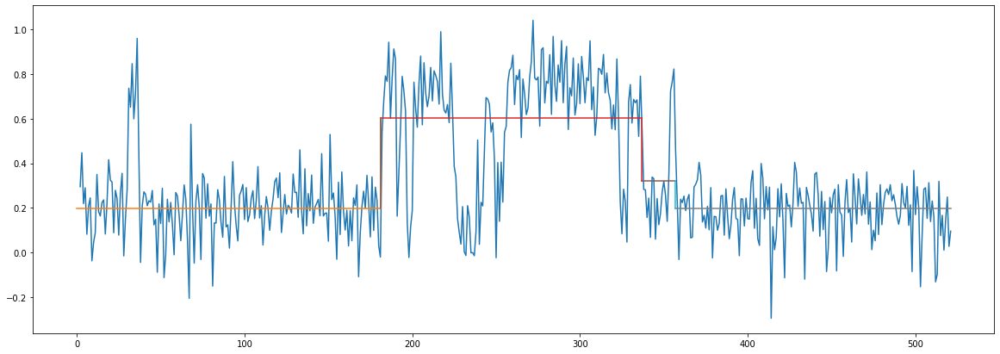

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.12205015591634755
New curren min is 0.40476810463429663
New curren min is 0.12205015591634755
New curren min is 0.2827179487179491
New curren min is 0.40476810463429663
MEAN BEFORE:
[{'mean': 0.19869984408365243, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.32075, 'start': 337, 'end': 357}, {'mean': 0.19869984408365243, 'start': 357, 'end': -1}]
MEANS AFTER
[{'mean': 0.2597249220418262, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.2597249220418262, 'start': 337, 'end': 357}, {'mean': 0.2597249220418262, 'start': 357, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.2597249220418262}, {'x': 357, 'y_1': 0.2597249220418262, 'y_2': 0.2597249220418262}, {'x': 181, 'y_1': 0.259724922041

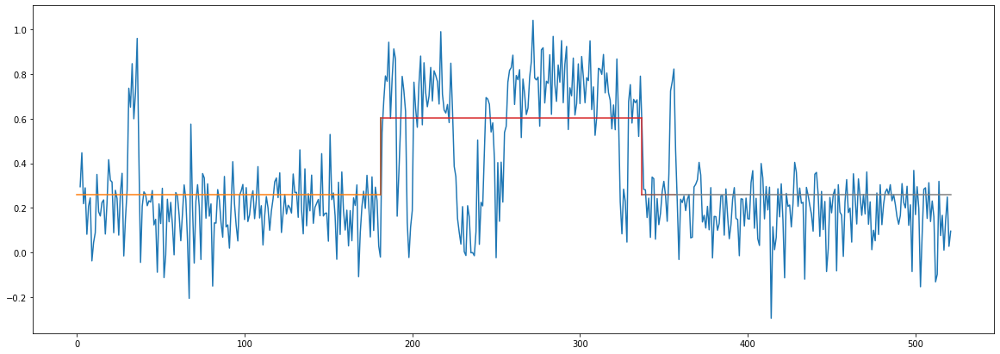

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.3437430266761229
New curren min is 0.3437430266761229
New curren min is 0.3437430266761229
MEAN BEFORE:
[{'mean': 0.2597249220418262, 'start': 0, 'end': 181}, {'mean': 0.6034679487179491, 'start': 181, 'end': 337}, {'mean': 0.2597249220418262, 'start': 337, 'end': 357}, {'mean': 0.2597249220418262, 'start': 357, 'end': -1}]
MEANS AFTER
[{'mean': 0.4315964353798876, 'start': 0, 'end': 181}, {'mean': 0.4315964353798876, 'start': 181, 'end': 337}, {'mean': 0.4315964353798876, 'start': 337, 'end': 357}, {'mean': 0.4315964353798876, 'start': 357, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.4315964353798876}, {'x': 357, 'y_1': 0.4315964353798876, 'y_2': 0.4315964353798876}, {'x': 181, 'y_1': 0.4315964353798876, 'y_2': 0.4315964353798876}, {'x': 337, 'y_1': 0.431596435379887

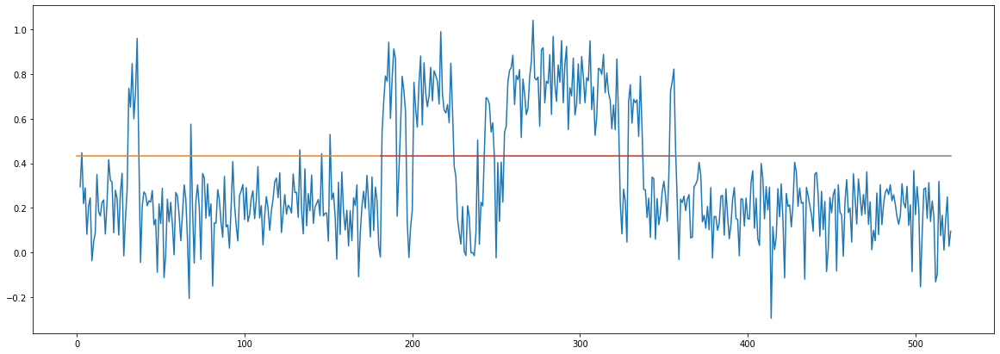

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 5                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 105, 'value': 0.7115746441989131}, {'index': 70, 'value': 1.1979578702274998}, {'index': 103, 'value': 1.291851633263011}, {'index': 70, 'value': 1.1979578702274998}]


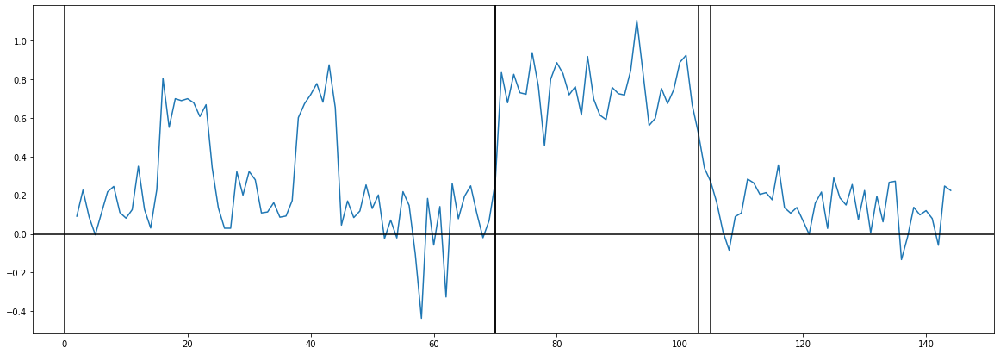

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 105, 70, 103, 70]
Transitionpoints indices without doubles: [  0  70 103 105]
Transitionpoints ordered: [0, 70, 103, 105]
START:
0
______________
END
70
______________
START:
70
______________
END
103
______________
START:
103
______________
END
105
______________
START:
105
______________
END
-1
______________
MEANS:
[{'mean': 0.23905714285714277, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.3045, 'start': 103, 'end': 105}, {'mean': 0.1336052631578947, 'start': 105, 'end': -1}]


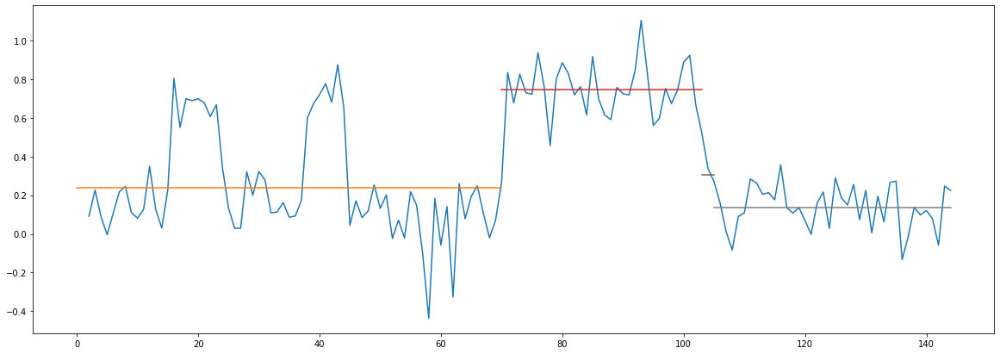

The value at 68.2% is 2.728


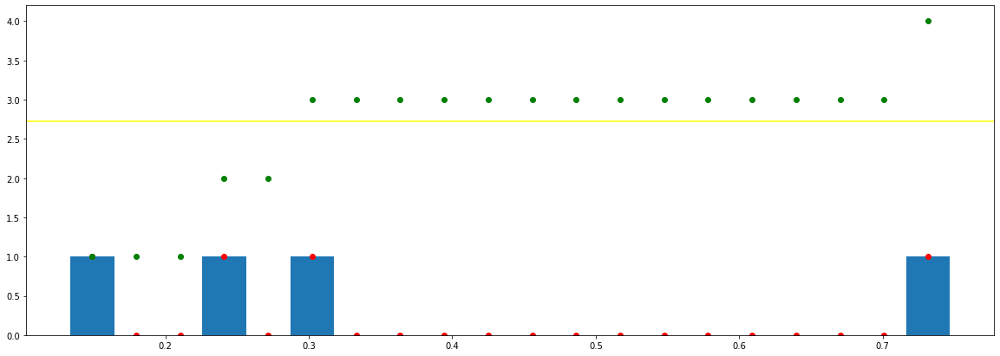

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.1708947368421053
New curren min is 0.5080034632034633
New curren min is 0.06544285714285722
New curren min is 0.10545187969924807
New curren min is 0.4425606060606061
New curren min is 0.6134553429027114
MEAN BEFORE:
[{'mean': 0.23905714285714277, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.3045, 'start': 103, 'end': 105}, {'mean': 0.1336052631578947, 'start': 105, 'end': -1}]
MEANS AFTER
[{'mean': 0.27177857142857137, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.27177857142857137, 'start': 103, 'end': 105}, {'mean': 0.1336052631578947, 'start': 105, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.27177857142857137}, {'x': 105, 'y_1': 0.27177857142857137, 'y_2': 0.1336052631578947},

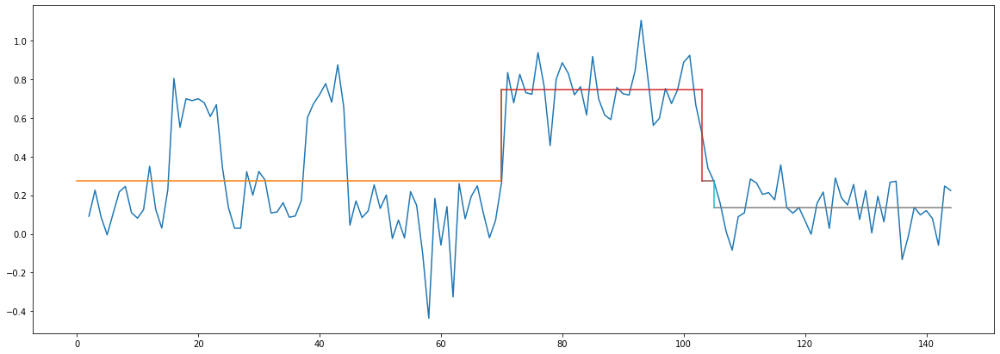

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.13817330827067667
New curren min is 0.4752820346320347
New curren min is 0.13817330827067667
New curren min is 0.4752820346320347
New curren min is 0.6134553429027114
MEAN BEFORE:
[{'mean': 0.27177857142857137, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.27177857142857137, 'start': 103, 'end': 105}, {'mean': 0.1336052631578947, 'start': 105, 'end': -1}]
MEANS AFTER
[{'mean': 0.20269191729323305, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.20269191729323305, 'start': 103, 'end': 105}, {'mean': 0.20269191729323305, 'start': 105, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.20269191729323305}, {'x': 105, 'y_1': 0.20269191729323305, 'y_2': 0.20269191729323305}, {'x': 70, 'y_1': 0.20

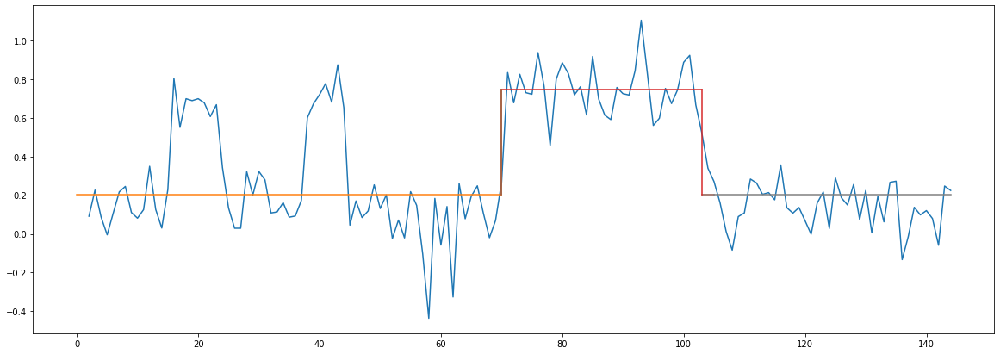

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.5443686887673731
New curren min is 0.5443686887673731
New curren min is 0.5443686887673731
MEAN BEFORE:
[{'mean': 0.20269191729323305, 'start': 0, 'end': 70}, {'mean': 0.7470606060606061, 'start': 70, 'end': 103}, {'mean': 0.20269191729323305, 'start': 103, 'end': 105}, {'mean': 0.20269191729323305, 'start': 105, 'end': -1}]
MEANS AFTER
[{'mean': 0.47487626167691954, 'start': 0, 'end': 70}, {'mean': 0.47487626167691954, 'start': 70, 'end': 103}, {'mean': 0.47487626167691954, 'start': 103, 'end': 105}, {'mean': 0.47487626167691954, 'start': 105, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.47487626167691954}, {'x': 105, 'y_1': 0.47487626167691954, 'y_2': 0.47487626167691954}, {'x': 70, 'y_1': 0.47487626167691954, 'y_2': 0.47487626167691954}, {'x': 103, 'y_1': 0.47487626

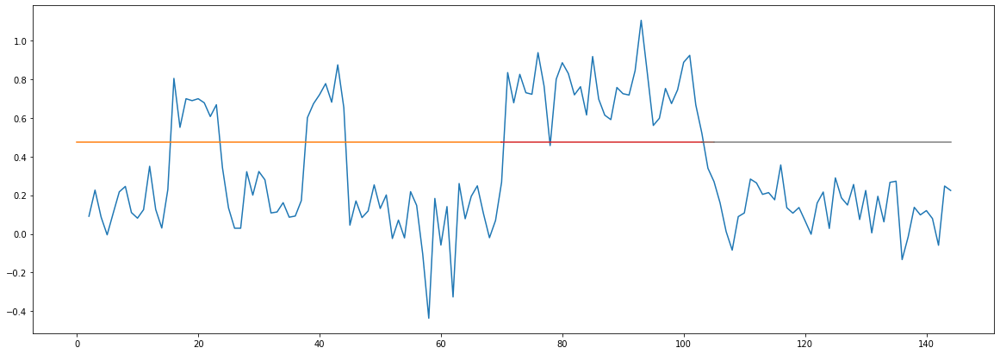

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 6                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 476, 'value': 1.6916328105340128}, {'index': 147, 'value': 2.138777428340251}, {'index': 476, 'value': 2.1850250785494967}, {'index': 147, 'value': 2.138777428340251}]


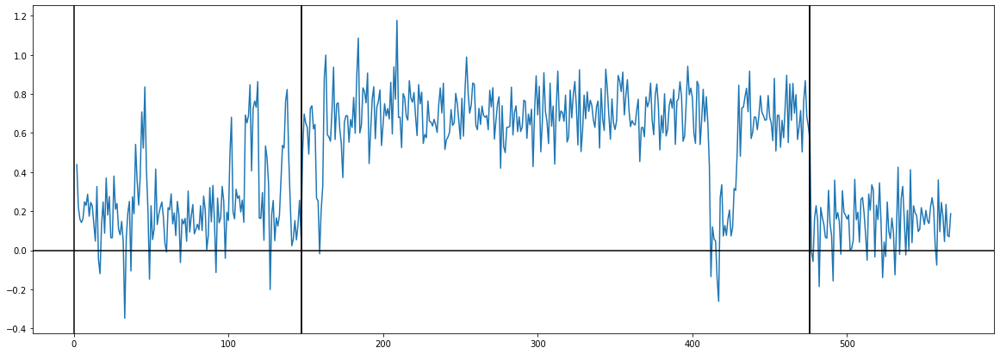

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 476, 147, 476, 147]
Transitionpoints indices without doubles: [  0 147 476]
Transitionpoints ordered: [0, 147, 476]
START:
0
______________
END
147
______________
START:
147
______________
END
476
______________
START:
476
______________
END
-1
______________
MEANS:
[{'mean': 0.23859863945578239, 'start': 0, 'end': 147}, {'mean': 0.6626656534954409, 'start': 147, 'end': 476}, {'mean': 0.14199999999999996, 'start': 476, 'end': -1}]


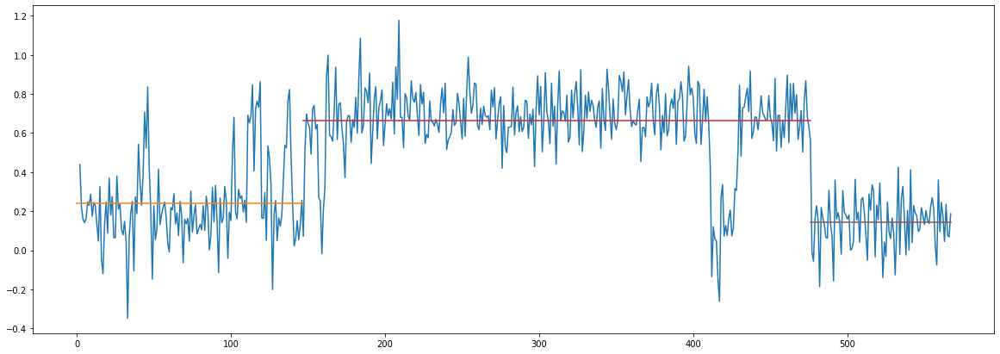

The value at 68.2% is 2.0460000000000003


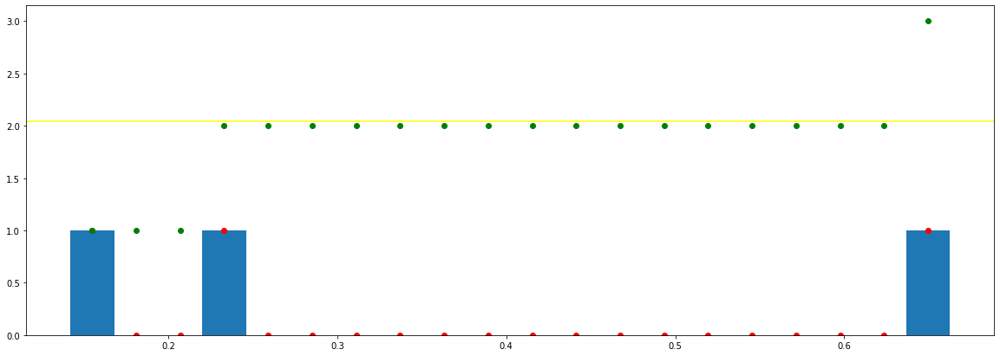

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.520665653495441
New curren min is 0.4240670140396585
New curren min is 0.09659863945578243
MEAN BEFORE:
[{'mean': 0.23859863945578239, 'start': 0, 'end': 147}, {'mean': 0.6626656534954409, 'start': 147, 'end': 476}, {'mean': 0.14199999999999996, 'start': 476, 'end': -1}]
MEANS AFTER
[{'mean': 0.19029931972789116, 'start': 0, 'end': 147}, {'mean': 0.6626656534954409, 'start': 147, 'end': 476}, {'mean': 0.19029931972789116, 'start': 476, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.19029931972789116}, {'x': 476, 'y_1': 0.6626656534954409, 'y_2': 0.19029931972789116}, {'x': 147, 'y_1': 0.19029931972789116, 'y_2': 0.6626656534954409}, {'x': 476, 'y_1': 0.6626656534954409, 'y_2': 0.19029931972789116}, {'x': 147, 'y_1': 0.19029931972789116, 'y_2': 0.6626656534954409}]


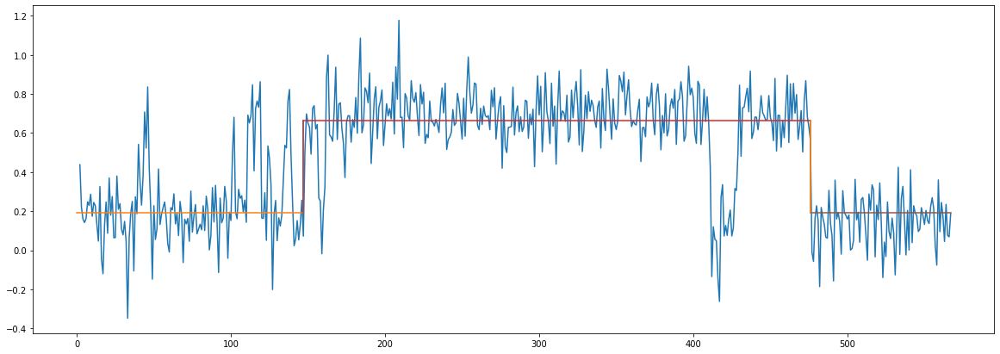

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.4723663337675498
New curren min is 0.4723663337675498
MEAN BEFORE:
[{'mean': 0.19029931972789116, 'start': 0, 'end': 147}, {'mean': 0.6626656534954409, 'start': 147, 'end': 476}, {'mean': 0.19029931972789116, 'start': 476, 'end': -1}]
MEANS AFTER
[{'mean': 0.42648248661166605, 'start': 0, 'end': 147}, {'mean': 0.42648248661166605, 'start': 147, 'end': 476}, {'mean': 0.42648248661166605, 'start': 476, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.42648248661166605}, {'x': 476, 'y_1': 0.42648248661166605, 'y_2': 0.42648248661166605}, {'x': 147, 'y_1': 0.42648248661166605, 'y_2': 0.42648248661166605}, {'x': 476, 'y_1': 0.42648248661166605, 'y_2': 0.42648248661166605}, {'x': 147, 'y_1': 0.42648248661166605, 'y_2': 0.42648248661166605}]


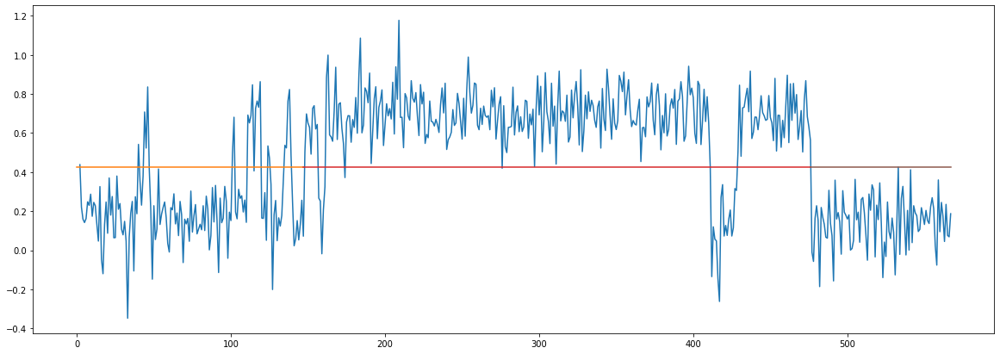

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 7                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 70, 'value': 0.17076972390086823}, {'index': 109, 'value': 0.13985402194198832}, {'index': 96, 'value': 0.13526936301247428}, {'index': 100, 'value': 0.29601930924242786}]


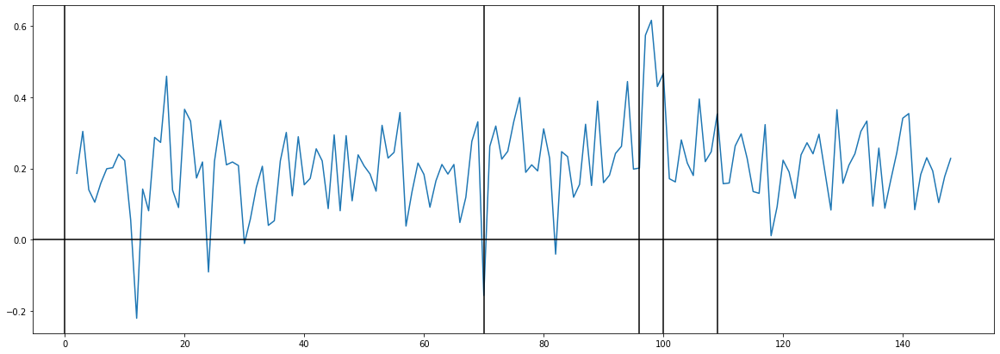

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 70, 109, 96, 100]
Transitionpoints indices without doubles: [  0  70  96 100 109]
Transitionpoints ordered: [0, 70, 96, 100, 109]
START:
0
______________
END
70
______________
START:
70
______________
END
96
______________
START:
96
______________
END
100
______________
START:
100
______________
END
109
______________
START:
109
______________
END
-1
______________
MEANS:
[{'mean': 0.18155714285714275, 'start': 0, 'end': 70}, {'mean': 0.2377692307692308, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.24688888888888882, 'start': 100, 'end': 109}, {'mean': 0.2045, 'start': 109, 'end': -1}]


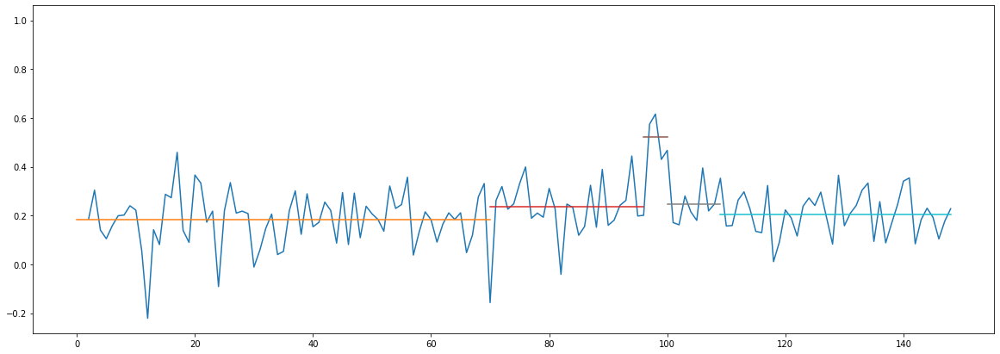

The value at 68.2% is 3.41


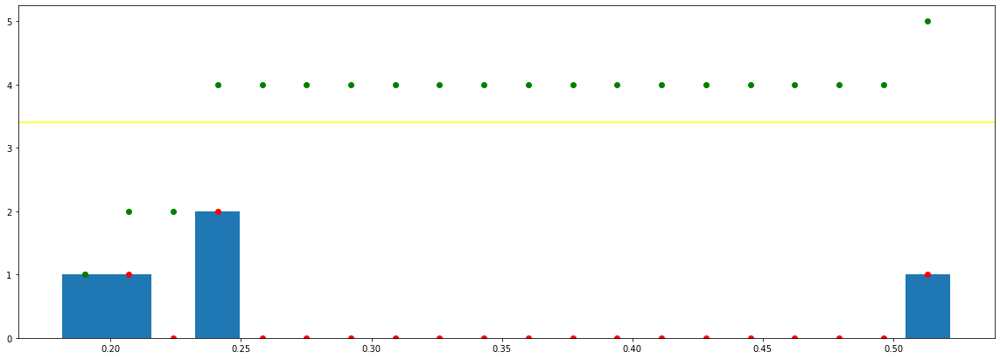

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.04238888888888884
New curren min is 0.05621208791208804
New curren min is 0.3401928571428572
New curren min is 0.06533174603174607
New curren min is 0.022942857142857237
New curren min is 0.28398076923076915
New curren min is 0.009119658119658036
New curren min is 0.0332692307692308
New curren min is 0.2748611111111111
New curren min is 0.3172499999999999
MEAN BEFORE:
[{'mean': 0.18155714285714275, 'start': 0, 'end': 70}, {'mean': 0.2377692307692308, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.24688888888888882, 'start': 100, 'end': 109}, {'mean': 0.2045, 'start': 109, 'end': -1}]
MEANS AFTER
[{'mean': 0.18155714285714275, 'start': 0, 'end': 70}, {'mean': 0.2423290598290598, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start

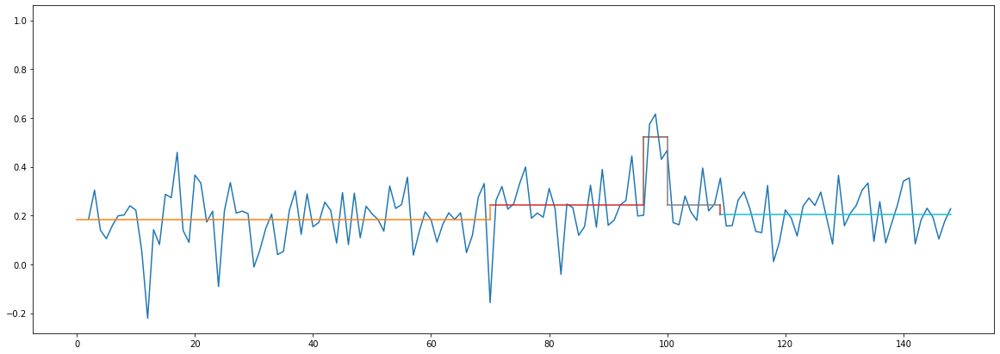

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.03782905982905982
New curren min is 0.060771916971917056
New curren min is 0.3401928571428572
New curren min is 0.060771916971917056
New curren min is 0.022942857142857237
New curren min is 0.2794209401709401
New curren min is 0.03782905982905982
New curren min is 0.2794209401709401
New curren min is 0.3172499999999999
MEAN BEFORE:
[{'mean': 0.18155714285714275, 'start': 0, 'end': 70}, {'mean': 0.2423290598290598, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.2423290598290598, 'start': 100, 'end': 109}, {'mean': 0.2045, 'start': 109, 'end': -1}]
MEANS AFTER
[{'mean': 0.19302857142857138, 'start': 0, 'end': 70}, {'mean': 0.2423290598290598, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.2423290

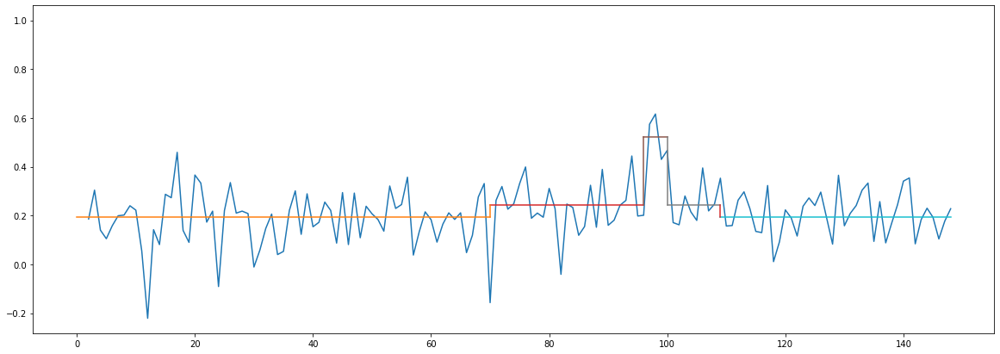

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.049300488400488424
New curren min is 0.049300488400488424
New curren min is 0.32872142857142855
New curren min is 0.049300488400488424
New curren min is 0.2794209401709401
New curren min is 0.049300488400488424
New curren min is 0.2794209401709401
New curren min is 0.32872142857142855
MEAN BEFORE:
[{'mean': 0.19302857142857138, 'start': 0, 'end': 70}, {'mean': 0.2423290598290598, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.2423290598290598, 'start': 100, 'end': 109}, {'mean': 0.19302857142857138, 'start': 109, 'end': -1}]
MEANS AFTER
[{'mean': 0.21767881562881558, 'start': 0, 'end': 70}, {'mean': 0.21767881562881558, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.21767881562881558, 'start': 

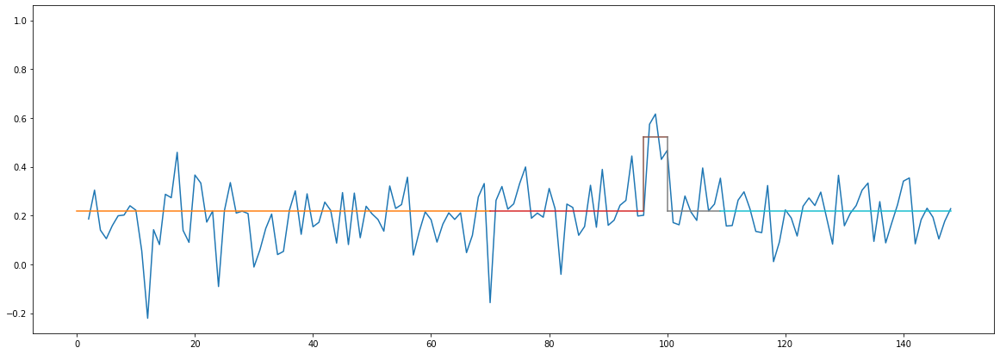

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
New curren min is 0.30407118437118436
New curren min is 0.30407118437118436
New curren min is 0.30407118437118436
New curren min is 0.30407118437118436
MEAN BEFORE:
[{'mean': 0.21767881562881558, 'start': 0, 'end': 70}, {'mean': 0.21767881562881558, 'start': 70, 'end': 96}, {'mean': 0.5217499999999999, 'start': 96, 'end': 100}, {'mean': 0.21767881562881558, 'start': 100, 'end': 109}, {'mean': 0.21767881562881558, 'start': 109, 'end': -1}]
MEANS AFTER
[{'mean': 0.3697144078144078, 'start': 0, 'end': 70}, {'mean': 0.3697144078144078, 'start': 70, 'end': 96}, {'mean': 0.3697144078144078, 'start': 96, 'end': 100}, {'mean': 0.3697144078144078, 'start': 100, 'end': 109}, {'mean': 0.3697144078144078, 'start': 109, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.3697144078144078}, {'x': 70, 'y_1': 0

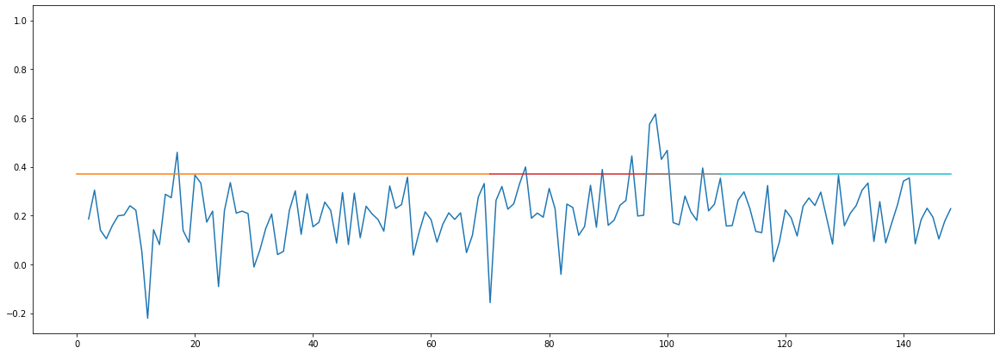

___________________________________________________________________________________
Blending Cycle Nr. 5
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 8                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 56, 'value': 0.13325456507066855}, {'index': 70, 'value': 0.09091613744335517}, {'index': 69, 'value': 0.09391628842096152}, {'index': 69, 'value': 0.09391628842096152}]


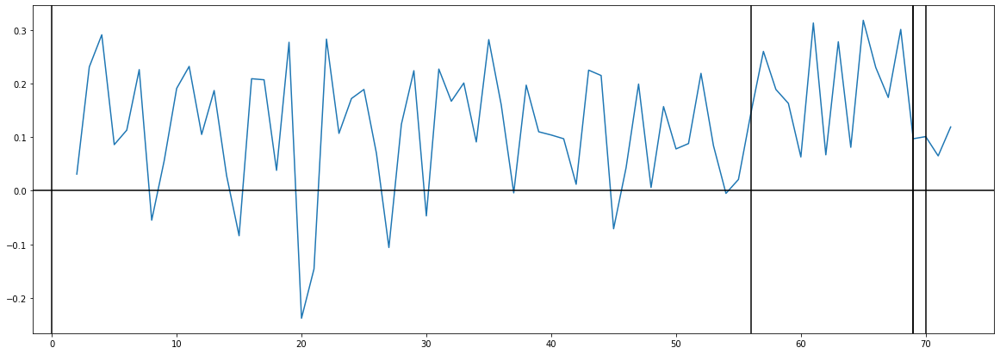

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 56, 70, 69, 69]
Transitionpoints indices without doubles: [ 0 56 69 70]
Transitionpoints ordered: [0, 56, 69, 70]
START:
0
______________
END
56
______________
START:
56
______________
END
69
______________
START:
69
______________
END
70
______________
START:
70
______________
END
-1
______________
MEANS:
[{'mean': 0.11073214285714285, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.1009999999999999, 'start': 69, 'end': 70}, {'mean': 0.065, 'start': 70, 'end': -1}]


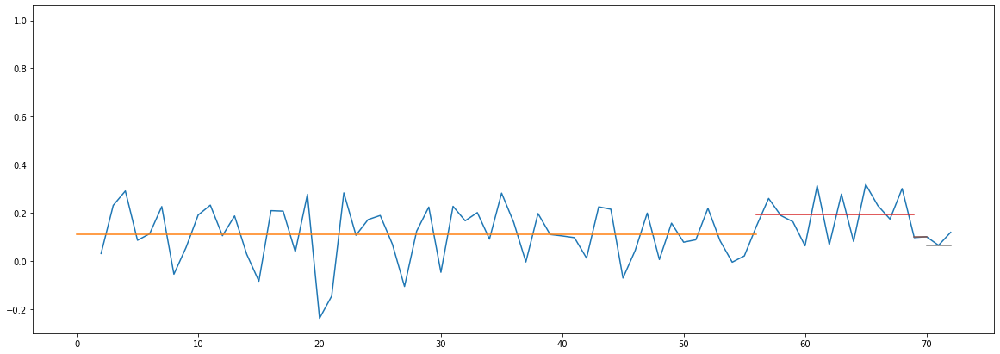

The value at 68.2% is 2.728


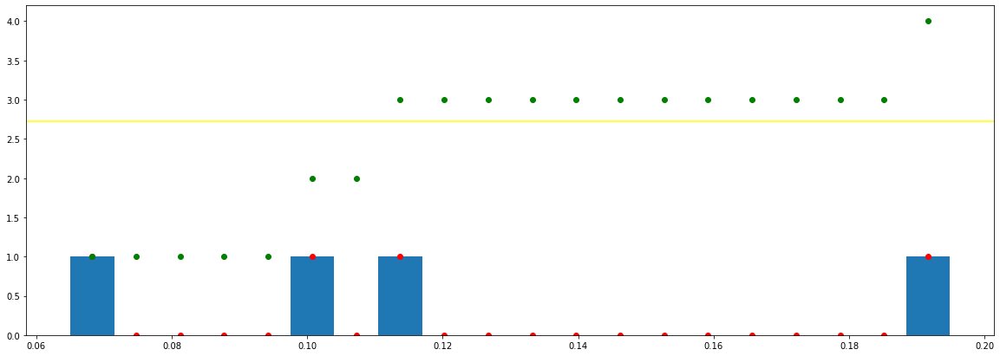

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.03599999999999989
New curren min is 0.08419093406593407
New curren min is 0.009732142857142953
New curren min is 0.045732142857142846
New curren min is 0.09392307692307703
New curren min is 0.12992307692307692
MEAN BEFORE:
[{'mean': 0.11073214285714285, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.1009999999999999, 'start': 69, 'end': 70}, {'mean': 0.065, 'start': 70, 'end': -1}]
MEANS AFTER
[{'mean': 0.10586607142857138, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.10586607142857138, 'start': 69, 'end': 70}, {'mean': 0.065, 'start': 70, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.10586607142857138}, {'x': 56, 'y_1': 0.10586607142857138, 'y_2': 0.19492307692307692}, {'x': 70, 'y_

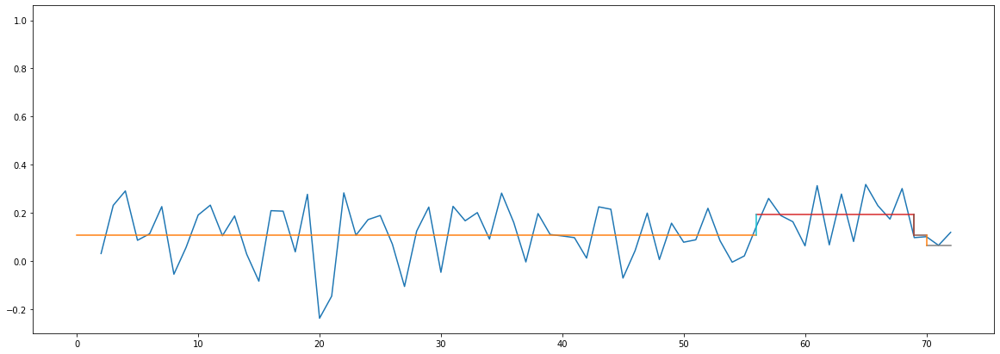

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.04086607142857138
New curren min is 0.08905700549450554
New curren min is 0.04086607142857138
New curren min is 0.08905700549450554
New curren min is 0.12992307692307692
MEAN BEFORE:
[{'mean': 0.10586607142857138, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.10586607142857138, 'start': 69, 'end': 70}, {'mean': 0.065, 'start': 70, 'end': -1}]
MEANS AFTER
[{'mean': 0.08543303571428569, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.08543303571428569, 'start': 69, 'end': 70}, {'mean': 0.08543303571428569, 'start': 70, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.08543303571428569}, {'x': 56, 'y_1': 0.08543303571428569, 'y_2': 0.19492307692307692}, {'x': 70, 'y_1': 0.08543303571428569, 

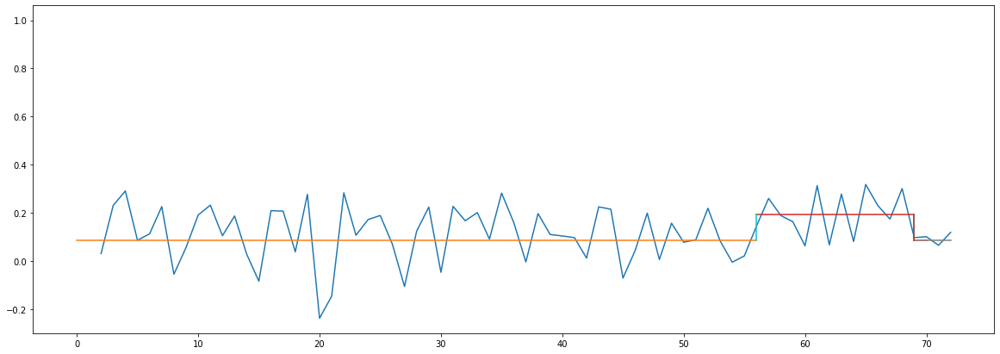

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.10949004120879123
New curren min is 0.10949004120879123
New curren min is 0.10949004120879123
MEAN BEFORE:
[{'mean': 0.08543303571428569, 'start': 0, 'end': 56}, {'mean': 0.19492307692307692, 'start': 56, 'end': 69}, {'mean': 0.08543303571428569, 'start': 69, 'end': 70}, {'mean': 0.08543303571428569, 'start': 70, 'end': -1}]
MEANS AFTER
[{'mean': 0.1401780563186813, 'start': 0, 'end': 56}, {'mean': 0.1401780563186813, 'start': 56, 'end': 69}, {'mean': 0.1401780563186813, 'start': 69, 'end': 70}, {'mean': 0.1401780563186813, 'start': 70, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.1401780563186813}, {'x': 56, 'y_1': 0.1401780563186813, 'y_2': 0.1401780563186813}, {'x': 70, 'y_1': 0.1401780563186813, 'y_2': 0.1401780563186813}, {'x': 69, 'y_1': 0.1401780563186813, 'y_2'

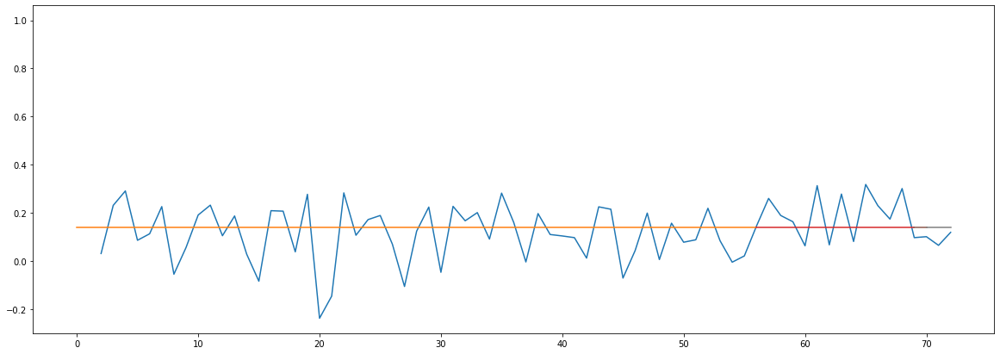

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 9                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 36, 'value': 0.12039965866281523}, {'index': 48, 'value': 0.12461973569880905}, {'index': 47, 'value': 0.12120156795915461}, {'index': 47, 'value': 0.12120156795915461}]


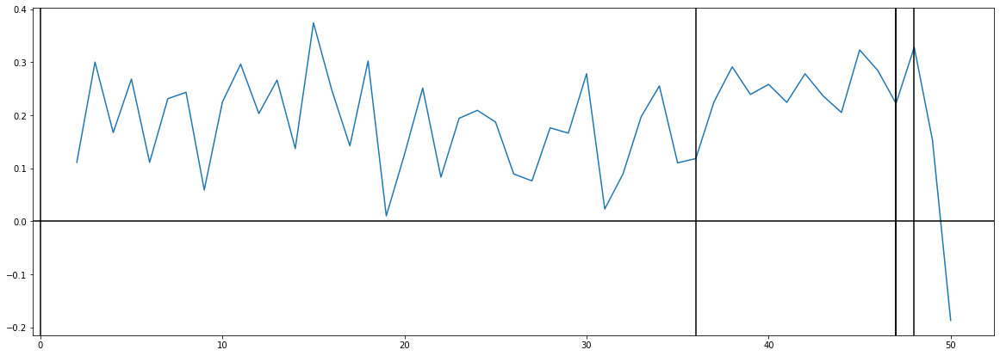

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 36, 48, 47, 47]
Transitionpoints indices without doubles: [ 0 36 47 48]
Transitionpoints ordered: [0, 36, 47, 48]
START:
0
______________
END
36
______________
START:
36
______________
END
47
______________
START:
47
______________
END
48
______________
START:
48
______________
END
-1
______________
MEANS:
[{'mean': 0.18150000000000005, 'start': 0, 'end': 36}, {'mean': 0.2531818181818182, 'start': 36, 'end': 47}, {'mean': 0.3279999999999999, 'start': 47, 'end': 48}, {'mean': 0.153, 'start': 48, 'end': -1}]


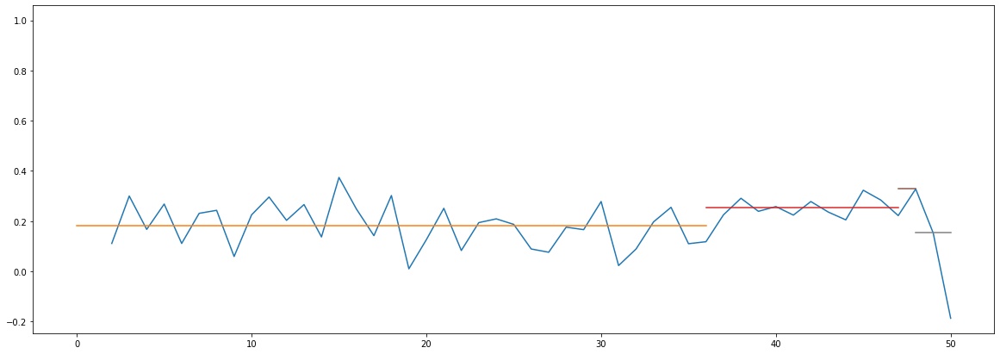

The value at 68.2% is 2.728


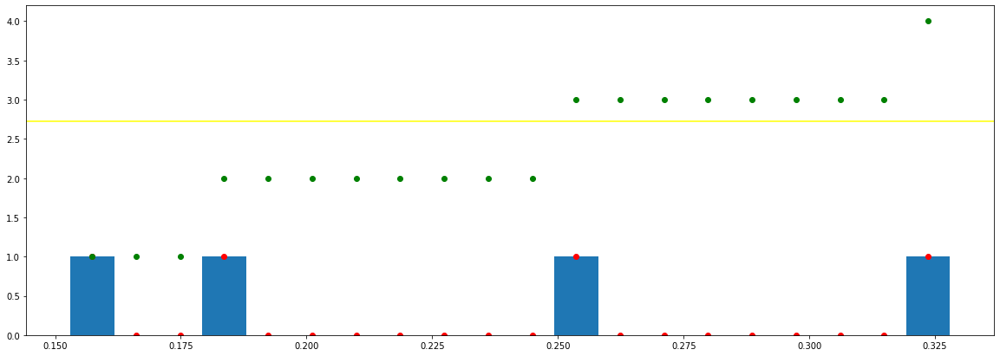

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.1749999999999999
New curren min is 0.07168181818181812
New curren min is 0.14649999999999985
New curren min is 0.028500000000000053
New curren min is 0.07481818181818173
New curren min is 0.10018181818181818
MEAN BEFORE:
[{'mean': 0.18150000000000005, 'start': 0, 'end': 36}, {'mean': 0.2531818181818182, 'start': 36, 'end': 47}, {'mean': 0.3279999999999999, 'start': 47, 'end': 48}, {'mean': 0.153, 'start': 48, 'end': -1}]
MEANS AFTER
[{'mean': 0.16725, 'start': 0, 'end': 36}, {'mean': 0.2531818181818182, 'start': 36, 'end': 47}, {'mean': 0.3279999999999999, 'start': 47, 'end': 48}, {'mean': 0.16725, 'start': 48, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.16725}, {'x': 36, 'y_1': 0.16725, 'y_2': 0.2531818181818182}, {'x': 48, 'y_1': 0.3279999999999999, 'y_2': 0.16725},

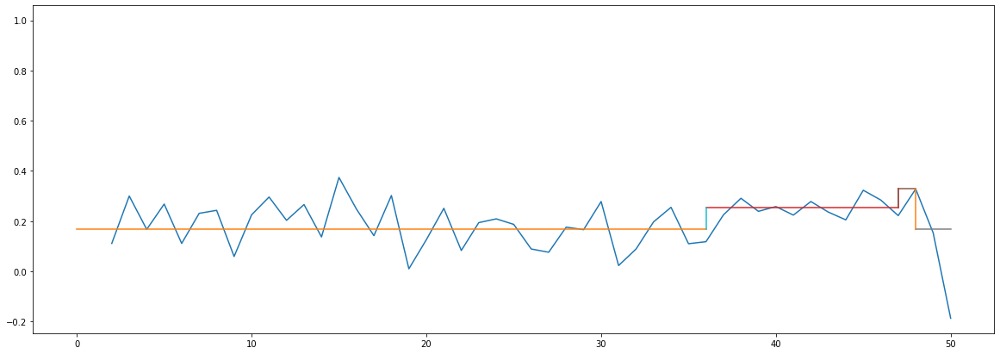

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.1607499999999999
New curren min is 0.08593181818181816
New curren min is 0.1607499999999999
New curren min is 0.07481818181818173
New curren min is 0.08593181818181816
MEAN BEFORE:
[{'mean': 0.16725, 'start': 0, 'end': 36}, {'mean': 0.2531818181818182, 'start': 36, 'end': 47}, {'mean': 0.3279999999999999, 'start': 47, 'end': 48}, {'mean': 0.16725, 'start': 48, 'end': -1}]
MEANS AFTER
[{'mean': 0.16725, 'start': 0, 'end': 36}, {'mean': 0.290590909090909, 'start': 36, 'end': 47}, {'mean': 0.290590909090909, 'start': 47, 'end': 48}, {'mean': 0.16725, 'start': 48, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.16725}, {'x': 36, 'y_1': 0.16725, 'y_2': 0.290590909090909}, {'x': 48, 'y_1': 0.290590909090909, 'y_2': 0.16725}, {'x': 47, 'y_1': 0.290590909090909, 'y_2': 0.29059090

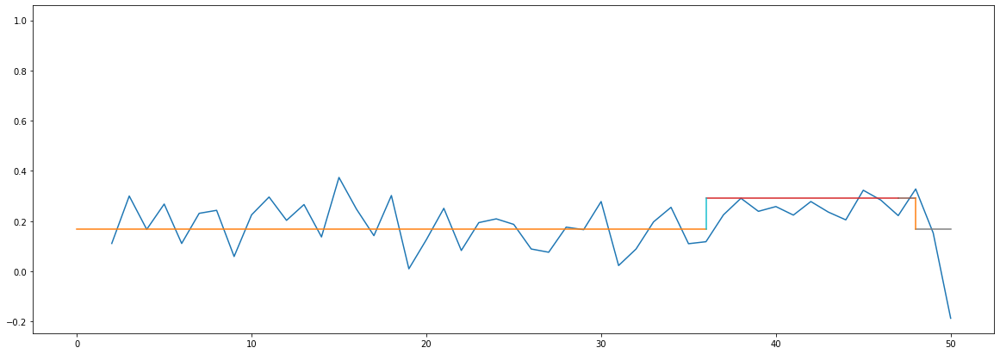

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.123340909090909
New curren min is 0.123340909090909
New curren min is 0.123340909090909
New curren min is 0.123340909090909
MEAN BEFORE:
[{'mean': 0.16725, 'start': 0, 'end': 36}, {'mean': 0.290590909090909, 'start': 36, 'end': 47}, {'mean': 0.290590909090909, 'start': 47, 'end': 48}, {'mean': 0.16725, 'start': 48, 'end': -1}]
MEANS AFTER
[{'mean': 0.2289204545454545, 'start': 0, 'end': 36}, {'mean': 0.2289204545454545, 'start': 36, 'end': 47}, {'mean': 0.2289204545454545, 'start': 47, 'end': 48}, {'mean': 0.2289204545454545, 'start': 48, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.2289204545454545}, {'x': 36, 'y_1': 0.2289204545454545, 'y_2': 0.2289204545454545}, {'x': 48, 'y_1': 0.2289204545454545, 'y_2': 0.2289204545454545}, {'x': 47, 'y_1': 0.2289204545454545, 'y_

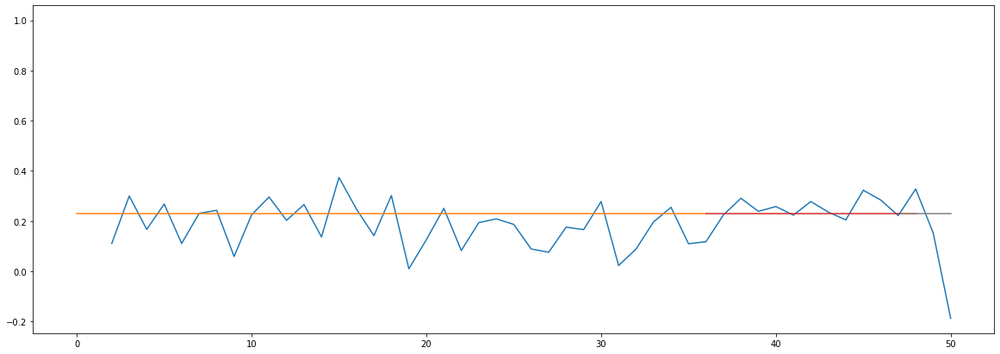

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 10                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 150, 'value': 0.10309691447775944}, {'index': 149, 'value': 0.10333502609207426}, {'index': 149, 'value': 0.10333502609207426}, {'index': 149, 'value': 0.10333502609207426}]


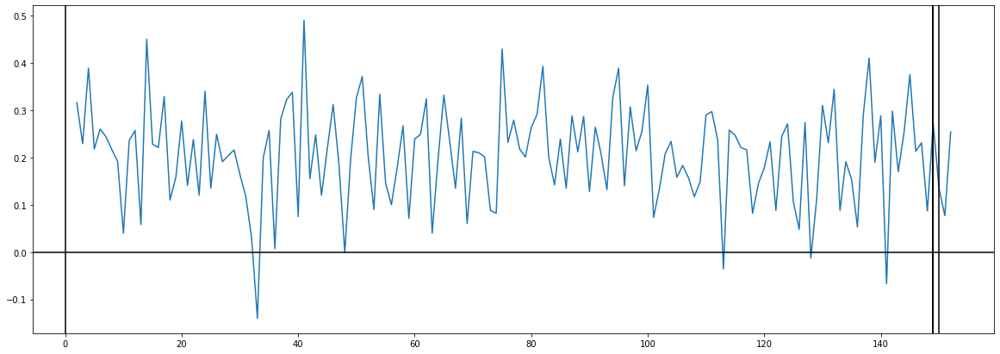

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 150, 149, 149, 149]
Transitionpoints indices without doubles: [  0 149 150]
Transitionpoints ordered: [0, 149, 150]
START:
0
______________
END
149
______________
START:
149
______________
END
150
______________
START:
150
______________
END
-1
______________
MEANS:
[{'mean': 0.20736241610738257, 'start': 0, 'end': 149}, {'mean': 0.135, 'start': 149, 'end': 150}, {'mean': 0.077, 'start': 150, 'end': -1}]


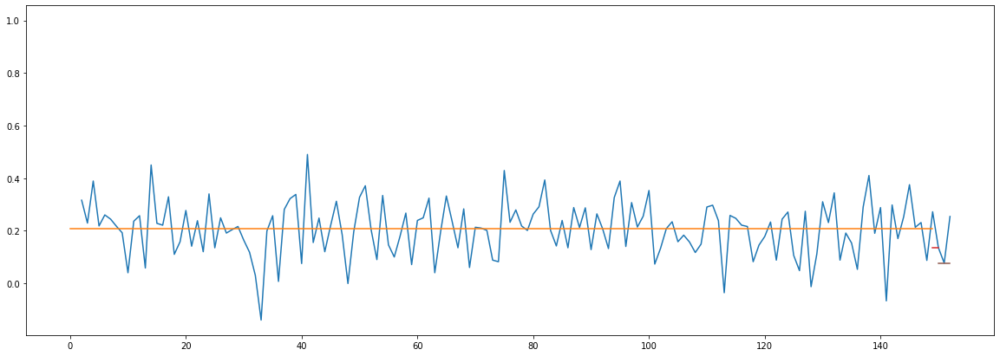

The value at 68.2% is 2.0460000000000003


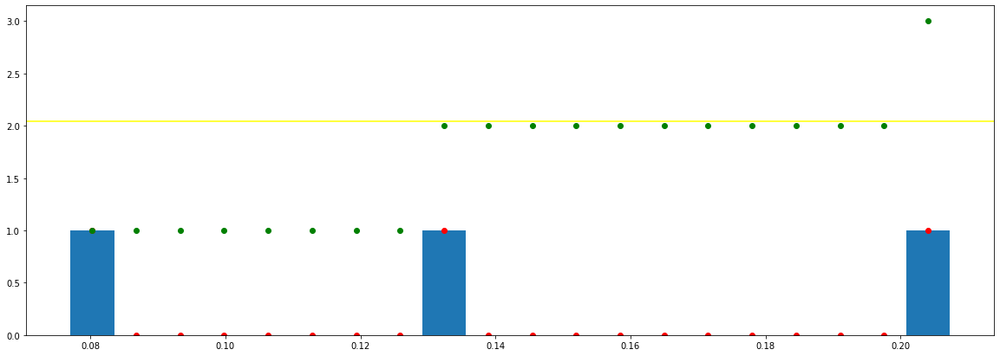

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.05800000000000001
New curren min is 0.07236241610738256
New curren min is 0.13036241610738258
MEAN BEFORE:
[{'mean': 0.20736241610738257, 'start': 0, 'end': 149}, {'mean': 0.135, 'start': 149, 'end': 150}, {'mean': 0.077, 'start': 150, 'end': -1}]
MEANS AFTER
[{'mean': 0.20736241610738257, 'start': 0, 'end': 149}, {'mean': 0.10600000000000001, 'start': 149, 'end': 150}, {'mean': 0.10600000000000001, 'start': 150, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.20736241610738257}, {'x': 150, 'y_1': 0.10600000000000001, 'y_2': 0.10600000000000001}, {'x': 149, 'y_1': 0.20736241610738257, 'y_2': 0.10600000000000001}, {'x': 149, 'y_1': 0.20736241610738257, 'y_2': 0.10600000000000001}, {'x': 149, 'y_1': 0.20736241610738257, 'y_2': 0.10600000000000001}]


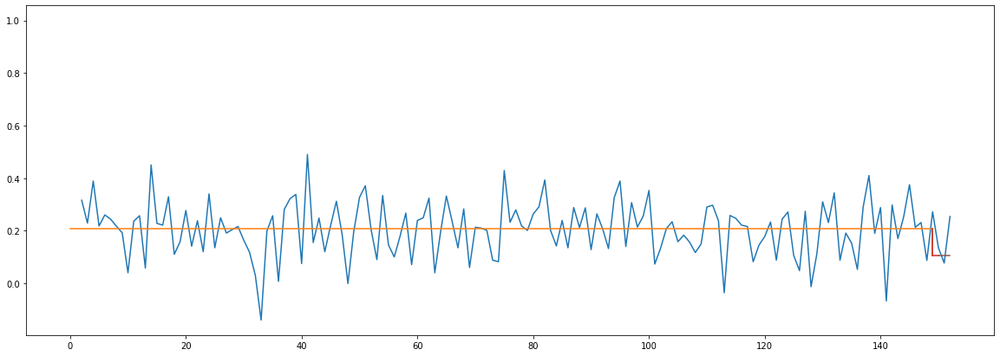

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.10136241610738256
New curren min is 0.10136241610738256
MEAN BEFORE:
[{'mean': 0.20736241610738257, 'start': 0, 'end': 149}, {'mean': 0.10600000000000001, 'start': 149, 'end': 150}, {'mean': 0.10600000000000001, 'start': 150, 'end': -1}]
MEANS AFTER
[{'mean': 0.1566812080536913, 'start': 0, 'end': 149}, {'mean': 0.1566812080536913, 'start': 149, 'end': 150}, {'mean': 0.1566812080536913, 'start': 150, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.1566812080536913}, {'x': 150, 'y_1': 0.1566812080536913, 'y_2': 0.1566812080536913}, {'x': 149, 'y_1': 0.1566812080536913, 'y_2': 0.1566812080536913}, {'x': 149, 'y_1': 0.1566812080536913, 'y_2': 0.1566812080536913}, {'x': 149, 'y_1': 0.1566812080536913, 'y_2': 0.1566812080536913}]


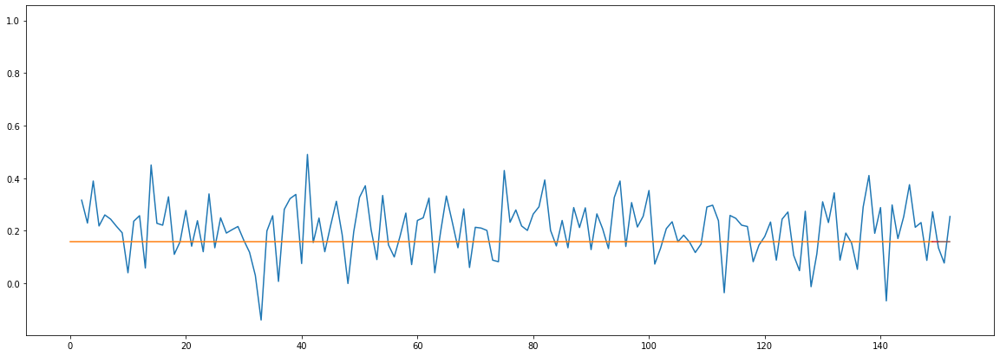

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 11                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
[{'index': 0, 'value': 0}, {'index': 535, 'value': 1.4746734207189085}]


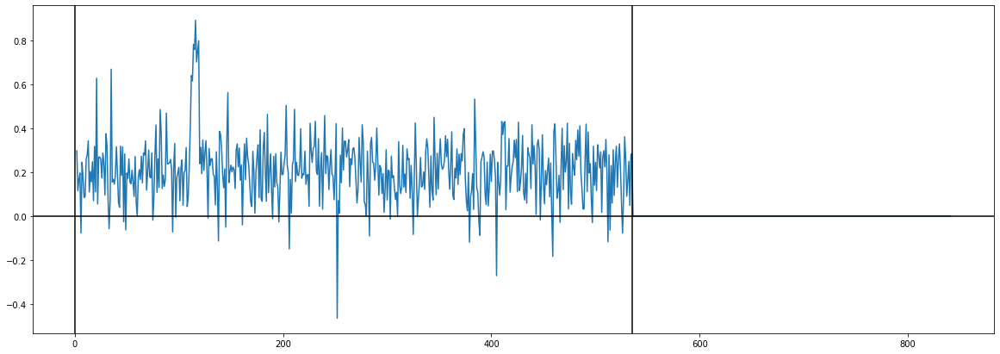

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 535]
Transitionpoints indices without doubles: [  0 535]
Transitionpoints ordered: [0, 535]
START:
0
______________
END
535
______________
START:
535
______________
END
-1
______________
MEANS:
[{'mean': 0.21161121495327084, 'start': 0, 'end': 535}, {'mean': 0.0, 'start': 535, 'end': -1}]


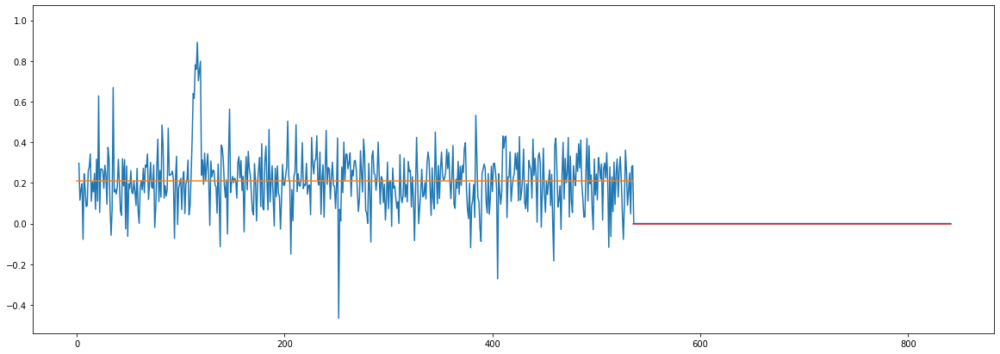

The value at 68.2% is 1.364


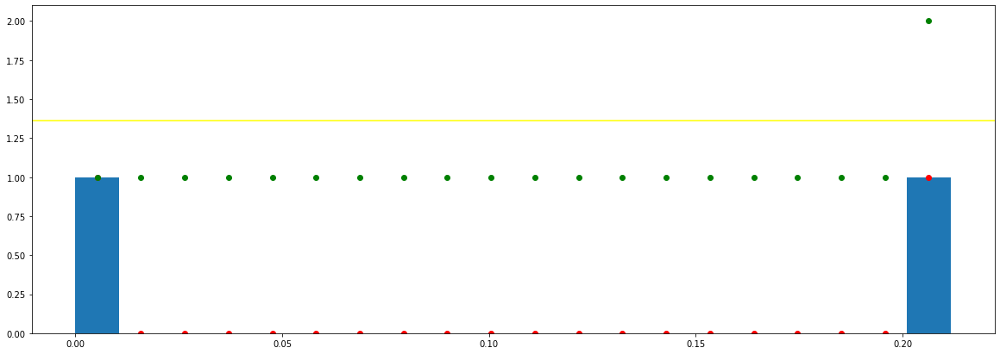

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.21161121495327084
MEAN BEFORE:
[{'mean': 0.21161121495327084, 'start': 0, 'end': 535}, {'mean': 0.0, 'start': 535, 'end': -1}]
MEANS AFTER
[{'mean': 0.10580560747663542, 'start': 0, 'end': 535}, {'mean': 0.10580560747663542, 'start': 535, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.10580560747663542}, {'x': 535, 'y_1': 0.10580560747663542, 'y_2': 0.10580560747663542}]


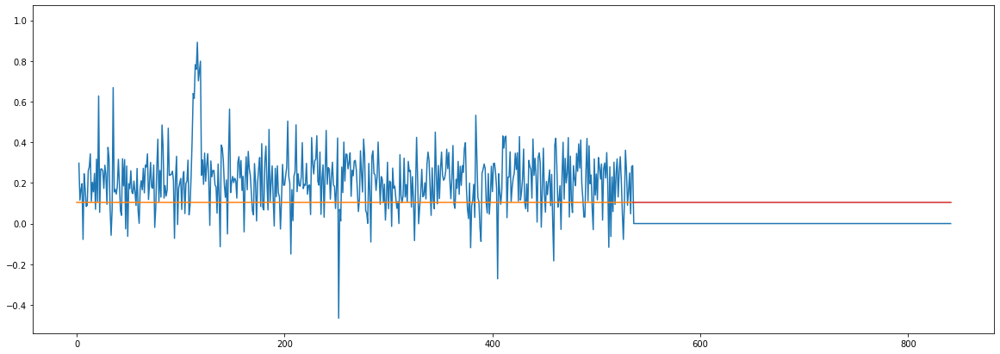

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 12                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 3, 'value': 0.09990100921389412}, {'index': 151, 'value': 0.09809146510981372}, {'index': 150, 'value': 0.0982344627103988}, {'index': 150, 'value': 0.0982344627103988}]


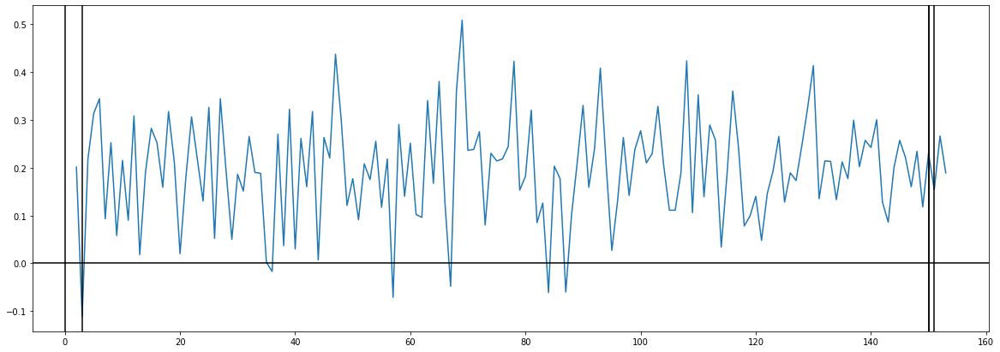

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 3, 151, 150, 150]
Transitionpoints indices without doubles: [  0   3 150 151]
Transitionpoints ordered: [0, 3, 150, 151]
START:
0
______________
END
3
______________
START:
3
______________
END
150
______________
START:
150
______________
END
151
______________
START:
151
______________
END
-1
______________
MEANS:
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.19713605442176868, 'start': 3, 'end': 150}, {'mean': 0.154, 'start': 150, 'end': 151}, {'mean': 0.266, 'start': 151, 'end': -1}]


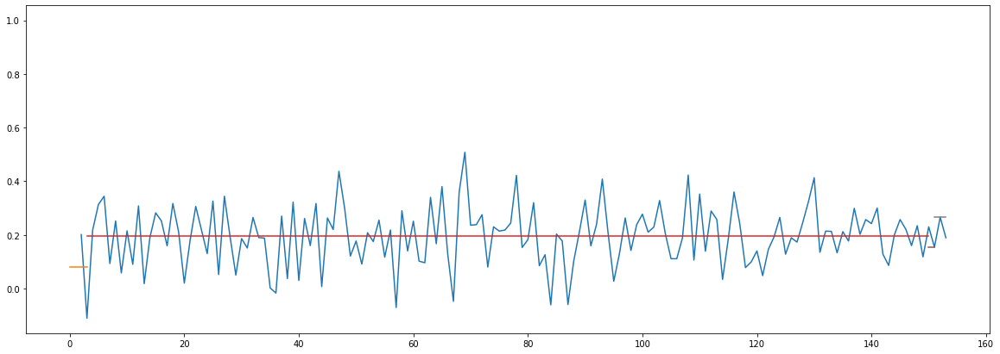

The value at 68.2% is 2.728


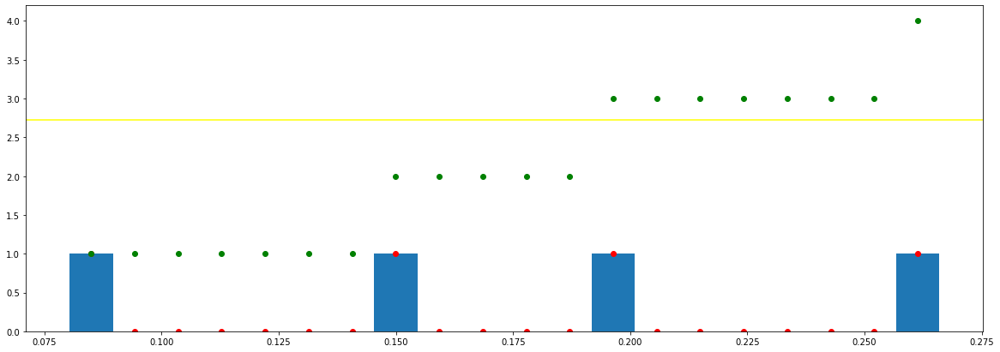

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.11200000000000002
New curren min is 0.11680272108843535
New curren min is 0.07366666666666667
New curren min is 0.1856666666666667
New curren min is 0.04313605442176868
New curren min is 0.06886394557823133
MEAN BEFORE:
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.19713605442176868, 'start': 3, 'end': 150}, {'mean': 0.154, 'start': 150, 'end': 151}, {'mean': 0.266, 'start': 151, 'end': -1}]
MEANS AFTER
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.17556802721088433, 'start': 3, 'end': 150}, {'mean': 0.17556802721088433, 'start': 150, 'end': 151}, {'mean': 0.266, 'start': 151, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.08033333333333333}, {'x': 3, 'y_1': 0.08033333333333333, 'y_2': 0.17556802721088433}, {'x': 151, 'y_1': 0.175568

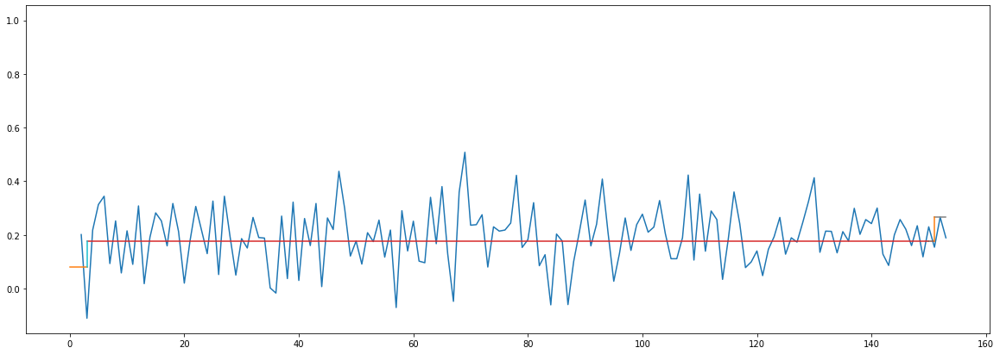

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.09043197278911569
New curren min is 0.095234693877551
New curren min is 0.095234693877551
New curren min is 0.1856666666666667
New curren min is 0.09043197278911569
MEAN BEFORE:
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.17556802721088433, 'start': 3, 'end': 150}, {'mean': 0.17556802721088433, 'start': 150, 'end': 151}, {'mean': 0.266, 'start': 151, 'end': -1}]
MEANS AFTER
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.22078401360544217, 'start': 3, 'end': 150}, {'mean': 0.22078401360544217, 'start': 150, 'end': 151}, {'mean': 0.22078401360544217, 'start': 151, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.08033333333333333}, {'x': 3, 'y_1': 0.08033333333333333, 'y_2': 0.22078401360544217}, {'x': 151, 'y_1': 0.22078401360544217, '

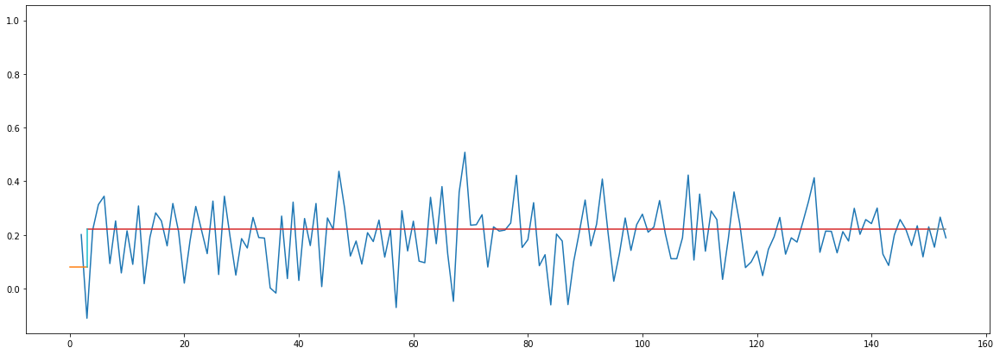

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.14045068027210883
New curren min is 0.14045068027210883
New curren min is 0.14045068027210883
MEAN BEFORE:
[{'mean': 0.08033333333333333, 'start': 0, 'end': 3}, {'mean': 0.22078401360544217, 'start': 3, 'end': 150}, {'mean': 0.22078401360544217, 'start': 150, 'end': 151}, {'mean': 0.22078401360544217, 'start': 151, 'end': -1}]
MEANS AFTER
[{'mean': 0.15055867346938775, 'start': 0, 'end': 3}, {'mean': 0.15055867346938775, 'start': 3, 'end': 150}, {'mean': 0.15055867346938775, 'start': 150, 'end': 151}, {'mean': 0.15055867346938775, 'start': 151, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.15055867346938775}, {'x': 3, 'y_1': 0.15055867346938775, 'y_2': 0.15055867346938775}, {'x': 151, 'y_1': 0.15055867346938775, 'y_2': 0.15055867346938775}, {'x': 150, 'y_1': 0.150558673

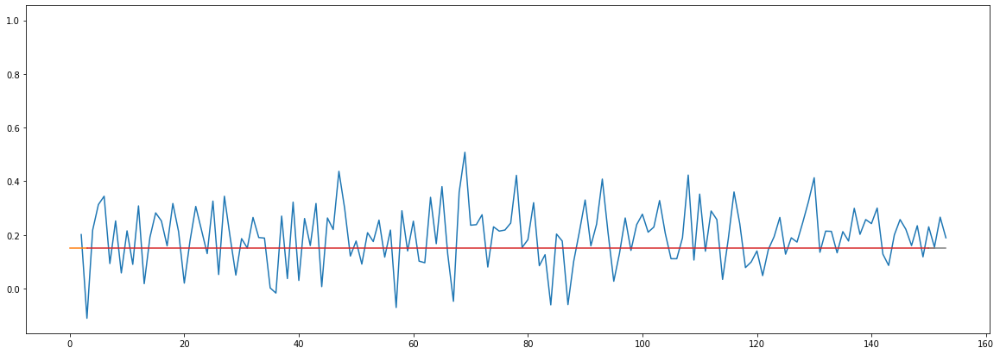

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 13                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 167, 'value': 0.12498034896739185}, {'index': 77, 'value': 0.10677360992295147}, {'index': 77, 'value': 0.10677360992295147}, {'index': 77, 'value': 0.10677360992295147}]


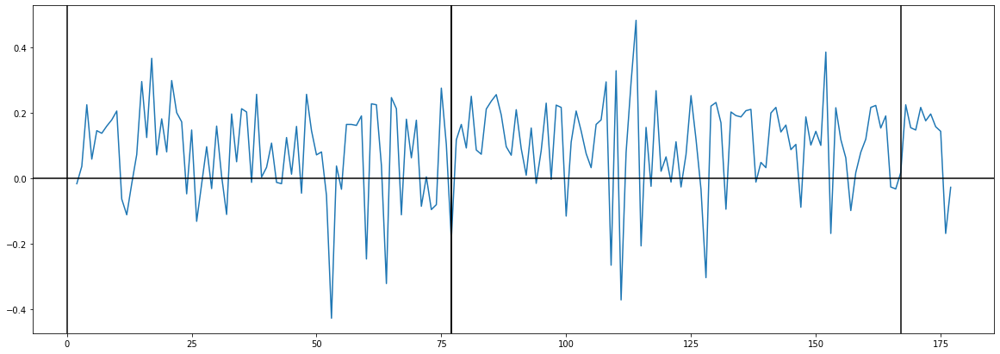

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 167, 77, 77, 77]
Transitionpoints indices without doubles: [  0  77 167]
Transitionpoints ordered: [0, 77, 167]
START:
0
______________
END
77
______________
START:
77
______________
END
167
______________
START:
167
______________
END
-1
______________
MEANS:
[{'mean': 0.0736363636363636, 'start': 0, 'end': 77}, {'mean': 0.10578888888888886, 'start': 77, 'end': 167}, {'mean': 0.13811111111111113, 'start': 167, 'end': -1}]


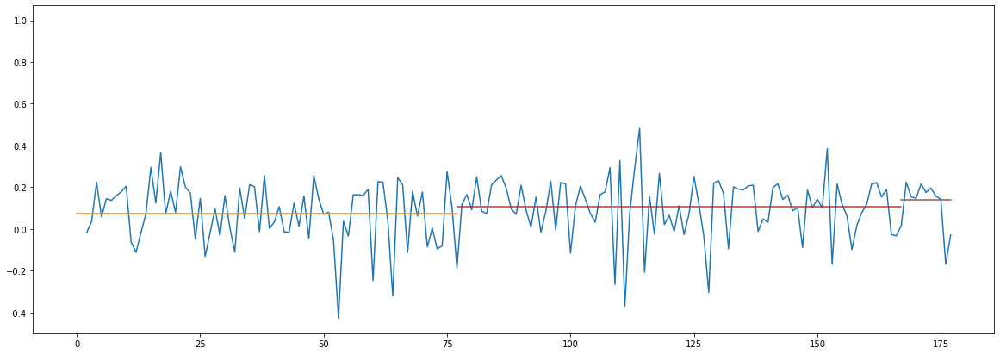

The value at 68.2% is 2.0460000000000003


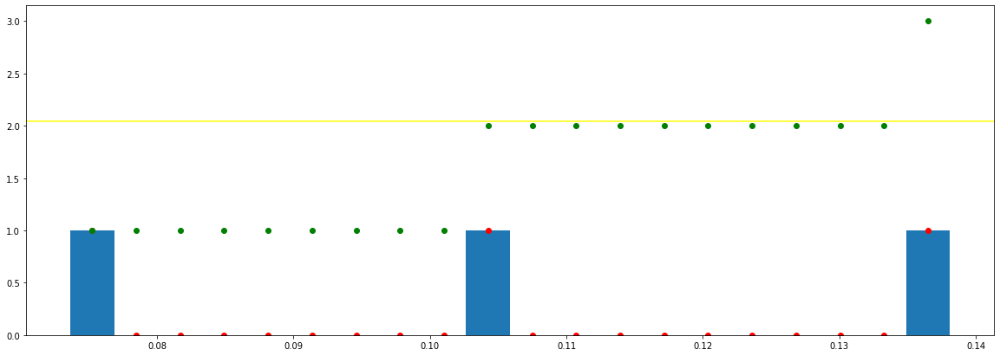

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.032322222222222266
New curren min is 0.032152525252525266
New curren min is 0.06447474747474753
MEAN BEFORE:
[{'mean': 0.0736363636363636, 'start': 0, 'end': 77}, {'mean': 0.10578888888888886, 'start': 77, 'end': 167}, {'mean': 0.13811111111111113, 'start': 167, 'end': -1}]
MEANS AFTER
[{'mean': 0.08971262626262623, 'start': 0, 'end': 77}, {'mean': 0.08971262626262623, 'start': 77, 'end': 167}, {'mean': 0.13811111111111113, 'start': 167, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.08971262626262623}, {'x': 167, 'y_1': 0.08971262626262623, 'y_2': 0.13811111111111113}, {'x': 77, 'y_1': 0.08971262626262623, 'y_2': 0.08971262626262623}, {'x': 77, 'y_1': 0.08971262626262623, 'y_2': 0.08971262626262623}, {'x': 77, 'y_1': 0.08971262626262623, 'y_2': 0.08971262626262623}]


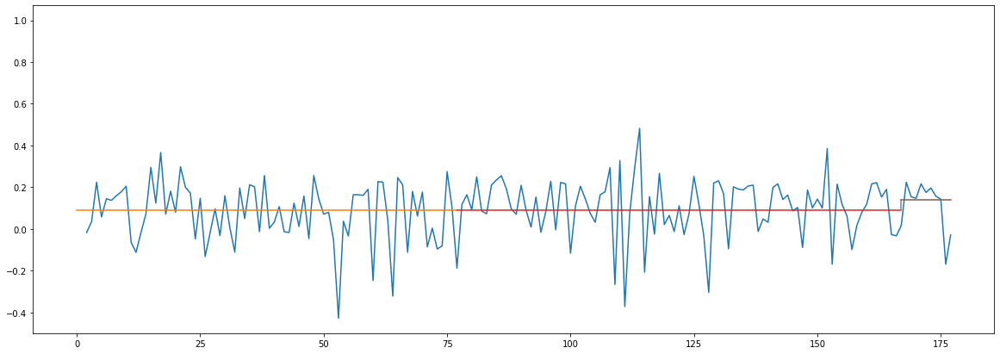

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.0483984848484849
New curren min is 0.0483984848484849
MEAN BEFORE:
[{'mean': 0.08971262626262623, 'start': 0, 'end': 77}, {'mean': 0.08971262626262623, 'start': 77, 'end': 167}, {'mean': 0.13811111111111113, 'start': 167, 'end': -1}]
MEANS AFTER
[{'mean': 0.11391186868686867, 'start': 0, 'end': 77}, {'mean': 0.11391186868686867, 'start': 77, 'end': 167}, {'mean': 0.11391186868686867, 'start': 167, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.11391186868686867}, {'x': 167, 'y_1': 0.11391186868686867, 'y_2': 0.11391186868686867}, {'x': 77, 'y_1': 0.11391186868686867, 'y_2': 0.11391186868686867}, {'x': 77, 'y_1': 0.11391186868686867, 'y_2': 0.11391186868686867}, {'x': 77, 'y_1': 0.11391186868686867, 'y_2': 0.11391186868686867}]


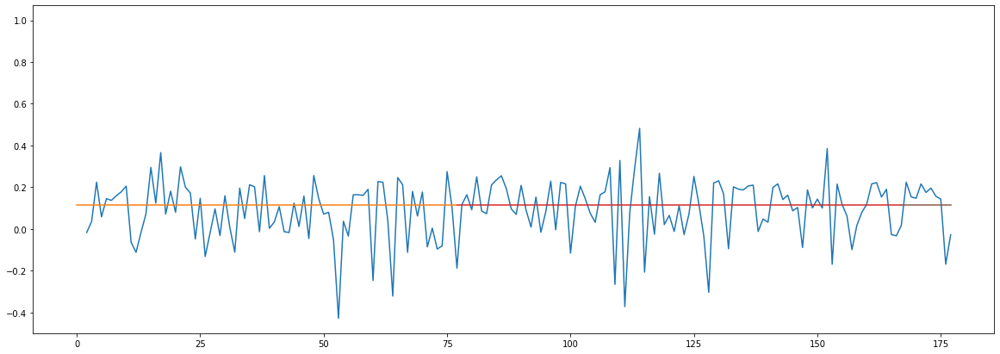

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 14                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 284, 'value': 1.259515180796276}, {'index': 132, 'value': 1.3116984728273107}, {'index': 284, 'value': 1.687278060316455}, {'index': 132, 'value': 1.3116984728273107}]


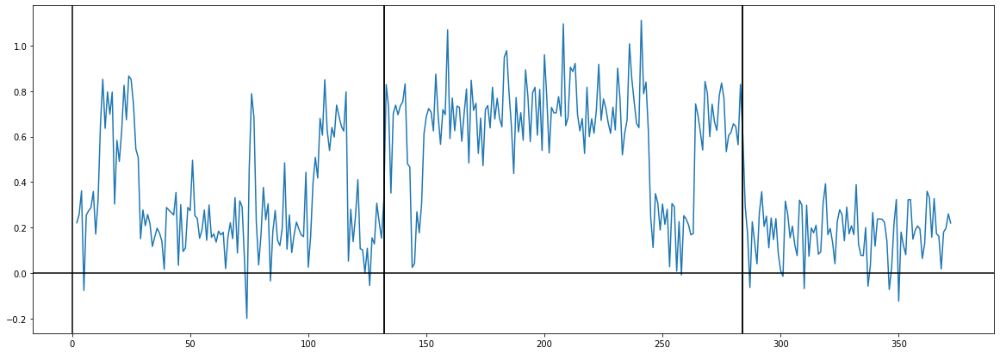

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 284, 132, 284, 132]
Transitionpoints indices without doubles: [  0 132 284]
Transitionpoints ordered: [0, 132, 284]
START:
0
______________
END
132
______________
START:
132
______________
END
284
______________
START:
284
______________
END
-1
______________
MEANS:
[{'mean': 0.3176136363636364, 'start': 0, 'end': 132}, {'mean': 0.629559210526316, 'start': 132, 'end': 284}, {'mean': 0.1768735632183908, 'start': 284, 'end': -1}]


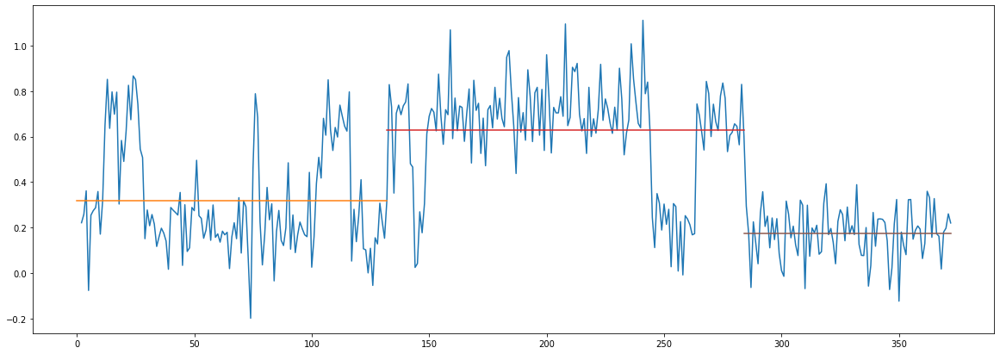

The value at 68.2% is 2.0460000000000003


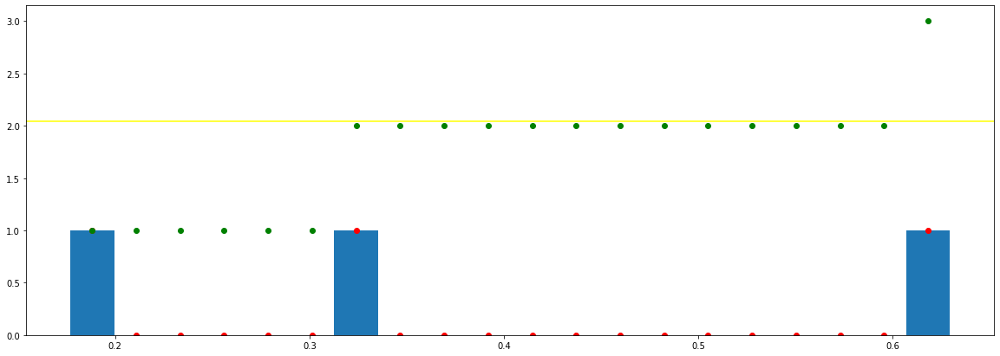

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.45268564730792527
New curren min is 0.31194557416267965
New curren min is 0.1407400731452456
MEAN BEFORE:
[{'mean': 0.3176136363636364, 'start': 0, 'end': 132}, {'mean': 0.629559210526316, 'start': 132, 'end': 284}, {'mean': 0.1768735632183908, 'start': 284, 'end': -1}]
MEANS AFTER
[{'mean': 0.24724359979101357, 'start': 0, 'end': 132}, {'mean': 0.629559210526316, 'start': 132, 'end': 284}, {'mean': 0.24724359979101357, 'start': 284, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.24724359979101357}, {'x': 284, 'y_1': 0.629559210526316, 'y_2': 0.24724359979101357}, {'x': 132, 'y_1': 0.24724359979101357, 'y_2': 0.629559210526316}, {'x': 284, 'y_1': 0.629559210526316, 'y_2': 0.24724359979101357}, {'x': 132, 'y_1': 0.24724359979101357, 'y_2': 0.629559210526316}]


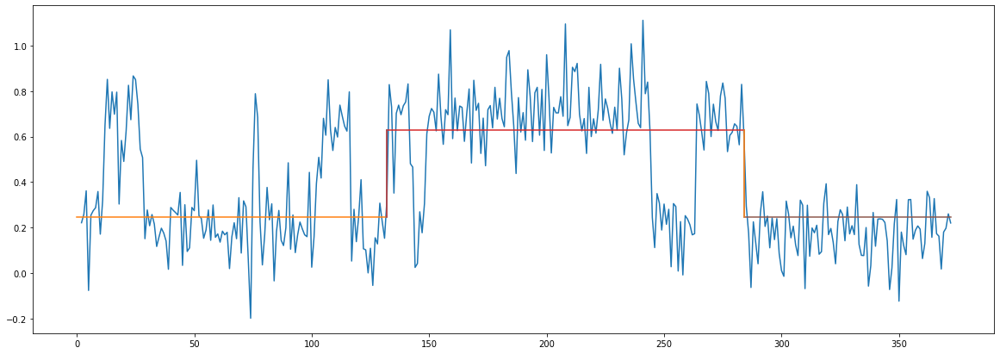

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.38231561073530246
New curren min is 0.38231561073530246
MEAN BEFORE:
[{'mean': 0.24724359979101357, 'start': 0, 'end': 132}, {'mean': 0.629559210526316, 'start': 132, 'end': 284}, {'mean': 0.24724359979101357, 'start': 284, 'end': -1}]
MEANS AFTER
[{'mean': 0.43840140515866477, 'start': 0, 'end': 132}, {'mean': 0.43840140515866477, 'start': 132, 'end': 284}, {'mean': 0.43840140515866477, 'start': 284, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.43840140515866477}, {'x': 284, 'y_1': 0.43840140515866477, 'y_2': 0.43840140515866477}, {'x': 132, 'y_1': 0.43840140515866477, 'y_2': 0.43840140515866477}, {'x': 284, 'y_1': 0.43840140515866477, 'y_2': 0.43840140515866477}, {'x': 132, 'y_1': 0.43840140515866477, 'y_2': 0.43840140515866477}]


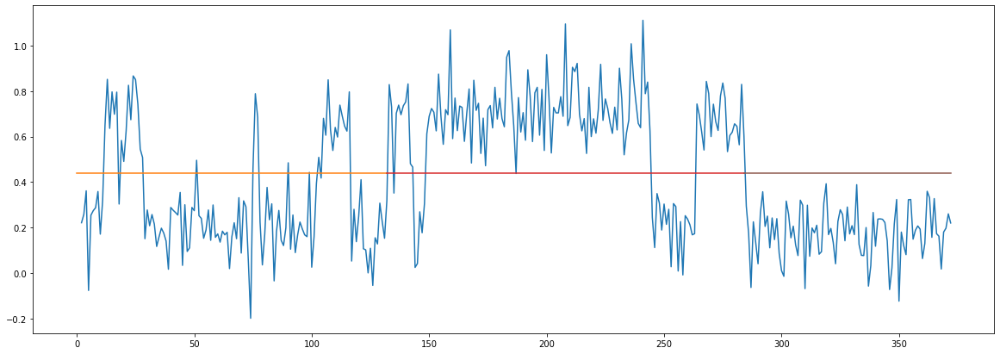

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 15                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 21, 'value': 1.2885261996182695}, {'index': 179, 'value': 0.3750586485067102}, {'index': 178, 'value': 0.374878079511333}, {'index': 178, 'value': 0.374878079511333}]


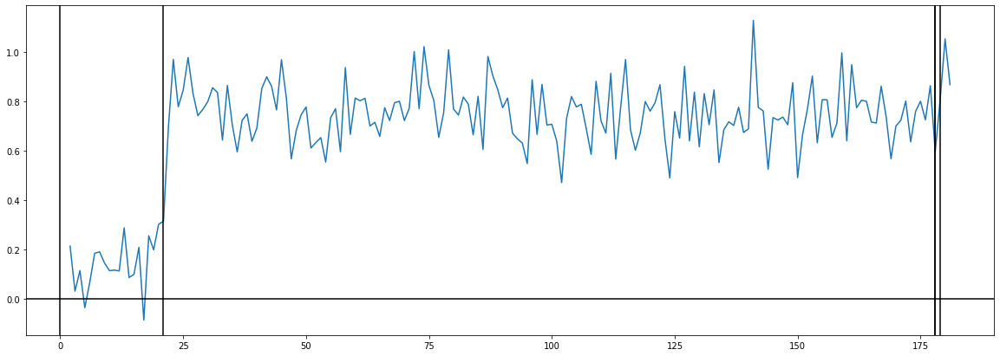

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 21, 179, 178, 178]
Transitionpoints indices without doubles: [  0  21 178 179]
Transitionpoints ordered: [0, 21, 178, 179]
START:
0
______________
END
21
______________
START:
21
______________
END
178
______________
START:
178
______________
END
179
______________
START:
179
______________
END
-1
______________
MEANS:
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.7521401273885352, 'start': 21, 'end': 178}, {'mean': 0.807, 'start': 178, 'end': 179}, {'mean': 1.052, 'start': 179, 'end': -1}]


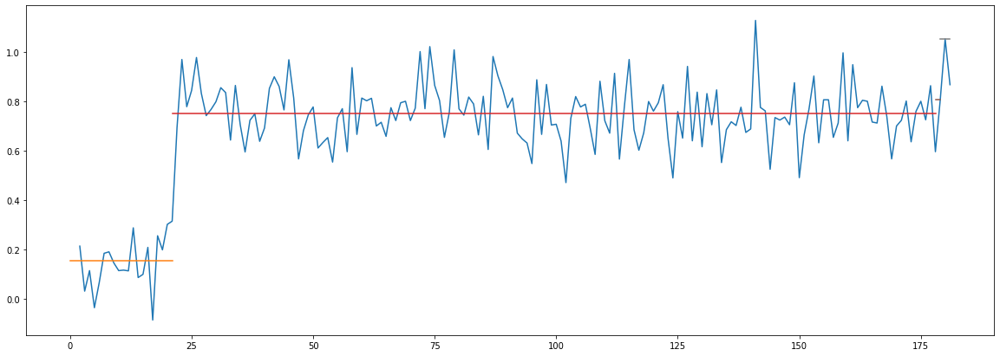

The value at 68.2% is 2.728


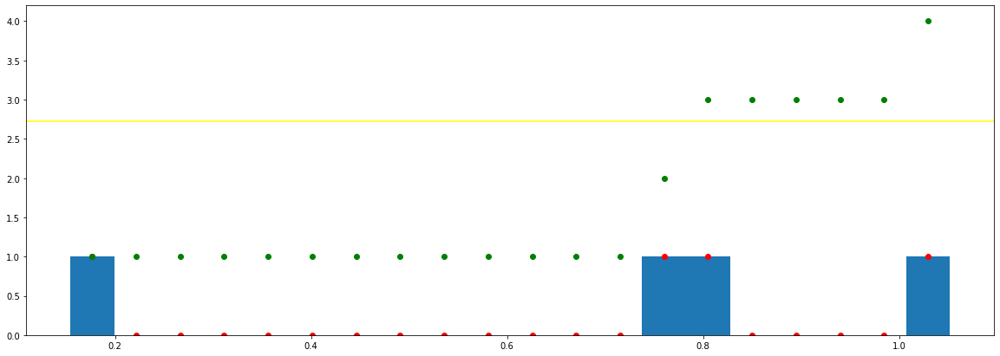

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.245
New curren min is 0.5979972702456781
New curren min is 0.6528571428571429
New curren min is 0.8978571428571429
New curren min is 0.054859872611464855
New curren min is 0.29985987261146485
MEAN BEFORE:
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.7521401273885352, 'start': 21, 'end': 178}, {'mean': 0.807, 'start': 178, 'end': 179}, {'mean': 1.052, 'start': 179, 'end': -1}]
MEANS AFTER
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.7795700636942676, 'start': 21, 'end': 178}, {'mean': 0.7795700636942676, 'start': 178, 'end': 179}, {'mean': 1.052, 'start': 179, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.15414285714285714}, {'x': 21, 'y_1': 0.15414285714285714, 'y_2': 0.7795700636942676}, {'x': 179, 'y_1': 0.7795700636942676, 'y

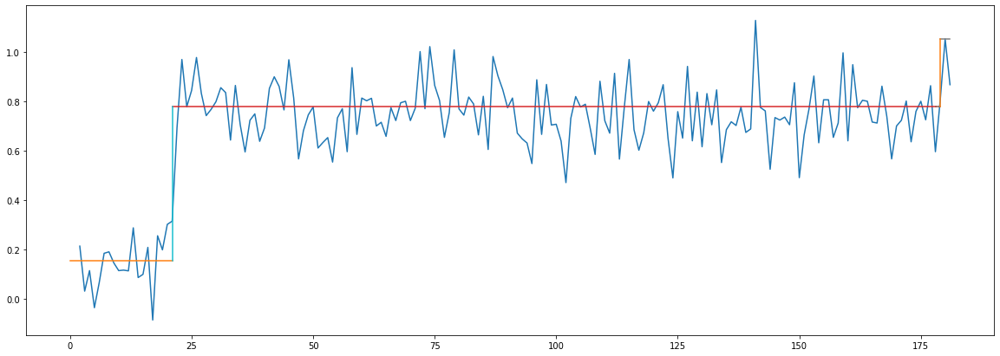

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.2724299363057324
New curren min is 0.6254272065514105
New curren min is 0.6254272065514105
New curren min is 0.8978571428571429
New curren min is 0.2724299363057324
MEAN BEFORE:
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.7795700636942676, 'start': 21, 'end': 178}, {'mean': 0.7795700636942676, 'start': 178, 'end': 179}, {'mean': 1.052, 'start': 179, 'end': -1}]
MEANS AFTER
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.9157850318471339, 'start': 21, 'end': 178}, {'mean': 0.9157850318471339, 'start': 178, 'end': 179}, {'mean': 0.9157850318471339, 'start': 179, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.15414285714285714}, {'x': 21, 'y_1': 0.15414285714285714, 'y_2': 0.9157850318471339}, {'x': 179, 'y_1': 0.9157850318471339, 'y_

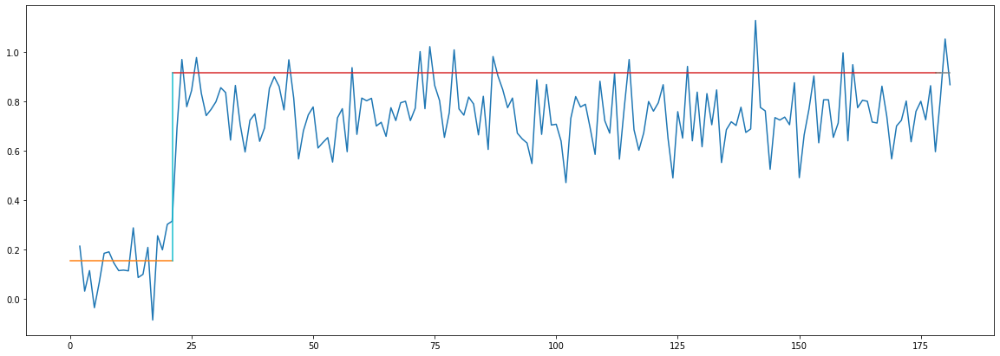

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.7616421747042768
New curren min is 0.7616421747042768
New curren min is 0.7616421747042768
MEAN BEFORE:
[{'mean': 0.15414285714285714, 'start': 0, 'end': 21}, {'mean': 0.9157850318471339, 'start': 21, 'end': 178}, {'mean': 0.9157850318471339, 'start': 178, 'end': 179}, {'mean': 0.9157850318471339, 'start': 179, 'end': -1}]
MEANS AFTER
[{'mean': 0.5349639444949955, 'start': 0, 'end': 21}, {'mean': 0.5349639444949955, 'start': 21, 'end': 178}, {'mean': 0.5349639444949955, 'start': 178, 'end': 179}, {'mean': 0.5349639444949955, 'start': 179, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.5349639444949955}, {'x': 21, 'y_1': 0.5349639444949955, 'y_2': 0.5349639444949955}, {'x': 179, 'y_1': 0.5349639444949955, 'y_2': 0.5349639444949955}, {'x': 178, 'y_1': 0.5349639444949955, '

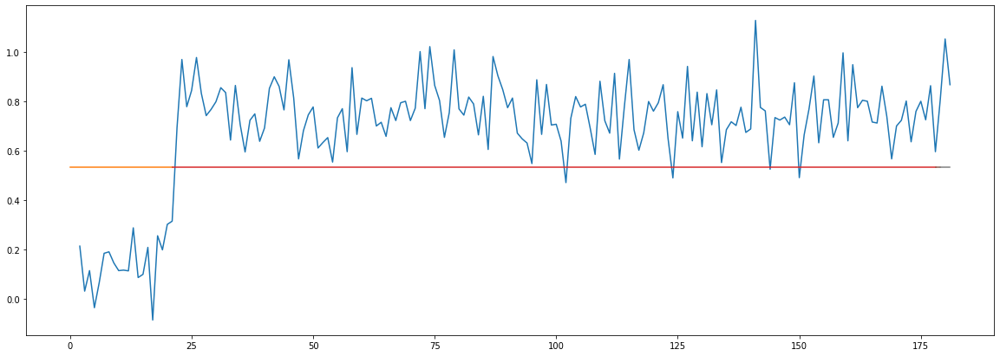

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 16                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 42, 'value': 0.13185080084192657}, {'index': 45, 'value': 0.1919623946765358}, {'index': 44, 'value': 0.1767715097708527}, {'index': 44, 'value': 0.1767715097708527}]


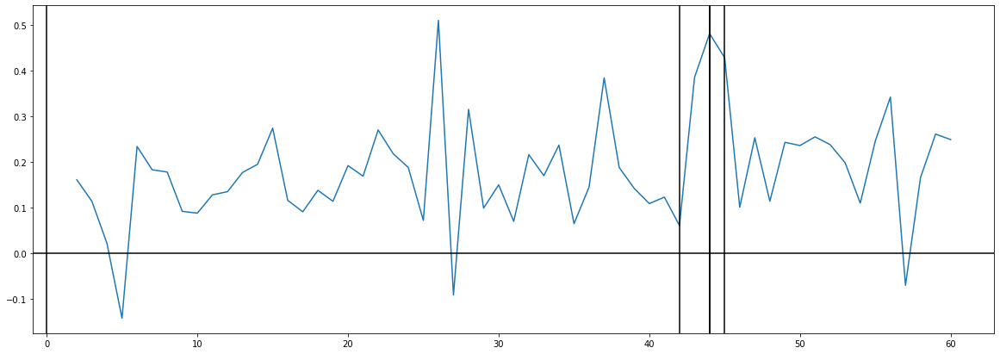

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 42, 45, 44, 44]
Transitionpoints indices without doubles: [ 0 42 44 45]
Transitionpoints ordered: [0, 42, 44, 45]
START:
0
______________
END
42
______________
START:
42
______________
END
44
______________
START:
44
______________
END
45
______________
START:
45
______________
END
-1
______________
MEANS:
[{'mean': 0.1570714285714286, 'start': 0, 'end': 42}, {'mean': 0.433, 'start': 42, 'end': 44}, {'mean': 0.428, 'start': 44, 'end': 45}, {'mean': 0.19235714285714287, 'start': 45, 'end': -1}]


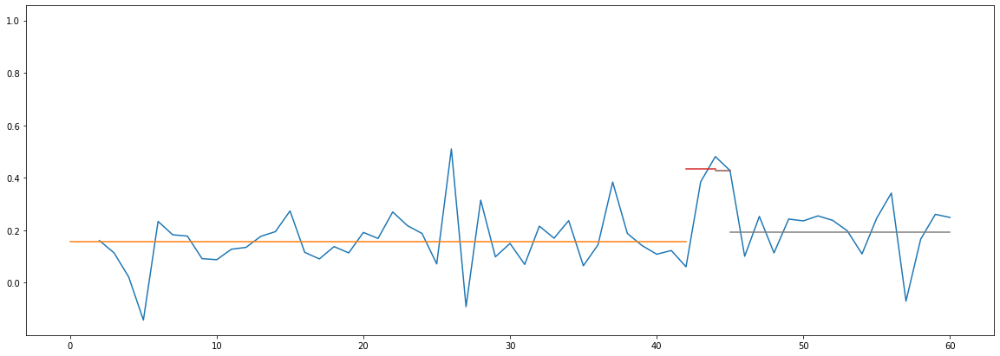

The value at 68.2% is 2.728


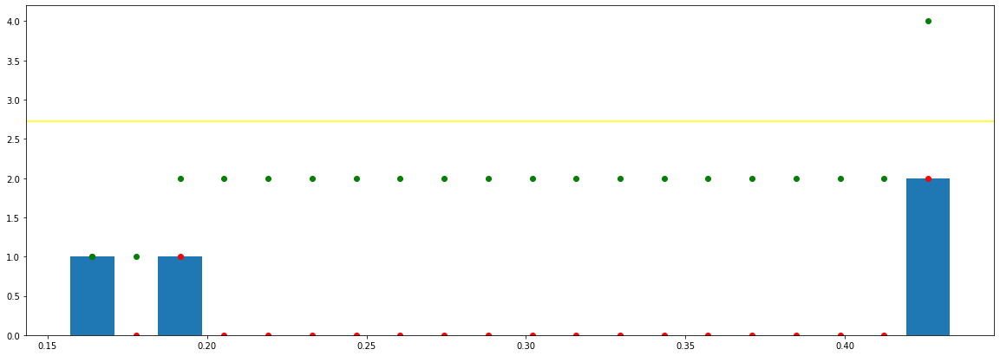

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.23564285714285713
New curren min is 0.2759285714285714
New curren min is 0.2709285714285714
New curren min is 0.035285714285714254
New curren min is 0.0050000000000000044
New curren min is 0.24064285714285713
MEAN BEFORE:
[{'mean': 0.1570714285714286, 'start': 0, 'end': 42}, {'mean': 0.433, 'start': 42, 'end': 44}, {'mean': 0.428, 'start': 44, 'end': 45}, {'mean': 0.19235714285714287, 'start': 45, 'end': -1}]
MEANS AFTER
[{'mean': 0.1570714285714286, 'start': 0, 'end': 42}, {'mean': 0.4305, 'start': 42, 'end': 44}, {'mean': 0.4305, 'start': 44, 'end': 45}, {'mean': 0.19235714285714287, 'start': 45, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.1570714285714286}, {'x': 42, 'y_1': 0.1570714285714286, 'y_2': 0.4305}, {'x': 45, 'y_1': 0.4305, 'y_2': 0.19235714285714287}, {'

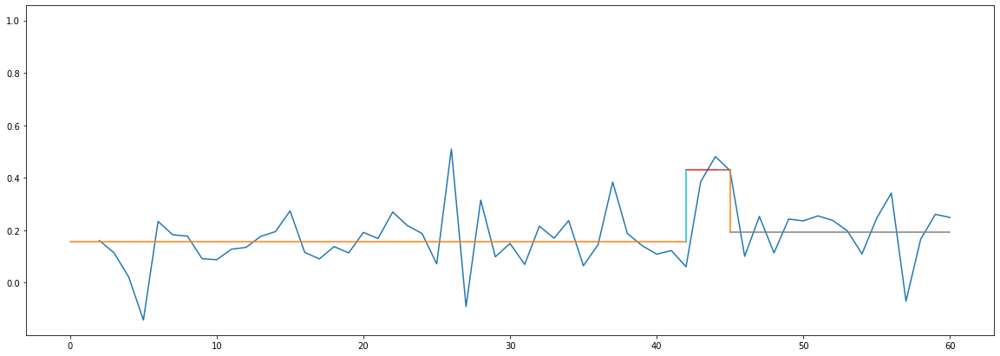

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.23814285714285713
New curren min is 0.27342857142857135
New curren min is 0.27342857142857135
New curren min is 0.035285714285714254
New curren min is 0.23814285714285713
MEAN BEFORE:
[{'mean': 0.1570714285714286, 'start': 0, 'end': 42}, {'mean': 0.4305, 'start': 42, 'end': 44}, {'mean': 0.4305, 'start': 44, 'end': 45}, {'mean': 0.19235714285714287, 'start': 45, 'end': -1}]
MEANS AFTER
[{'mean': 0.17471428571428574, 'start': 0, 'end': 42}, {'mean': 0.4305, 'start': 42, 'end': 44}, {'mean': 0.4305, 'start': 44, 'end': 45}, {'mean': 0.17471428571428574, 'start': 45, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.17471428571428574}, {'x': 42, 'y_1': 0.17471428571428574, 'y_2': 0.4305}, {'x': 45, 'y_1': 0.4305, 'y_2': 0.17471428571428574}, {'x': 44, 'y_1': 0.4305, 'y_2': 0.4

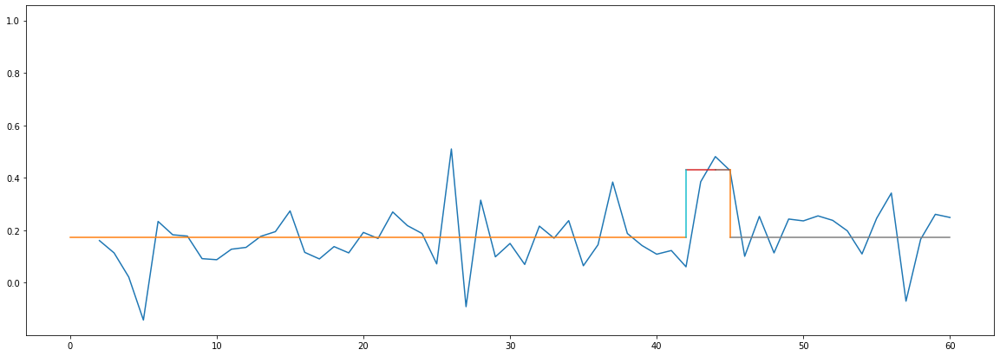

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.2557857142857143
New curren min is 0.2557857142857143
New curren min is 0.2557857142857143
New curren min is 0.2557857142857143
MEAN BEFORE:
[{'mean': 0.17471428571428574, 'start': 0, 'end': 42}, {'mean': 0.4305, 'start': 42, 'end': 44}, {'mean': 0.4305, 'start': 44, 'end': 45}, {'mean': 0.17471428571428574, 'start': 45, 'end': -1}]
MEANS AFTER
[{'mean': 0.30260714285714285, 'start': 0, 'end': 42}, {'mean': 0.30260714285714285, 'start': 42, 'end': 44}, {'mean': 0.30260714285714285, 'start': 44, 'end': 45}, {'mean': 0.30260714285714285, 'start': 45, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.30260714285714285}, {'x': 42, 'y_1': 0.30260714285714285, 'y_2': 0.30260714285714285}, {'x': 45, 'y_1': 0.30260714285714285, 'y_2': 0.30260714285714285}, {'x': 44, 'y_1': 0.302607

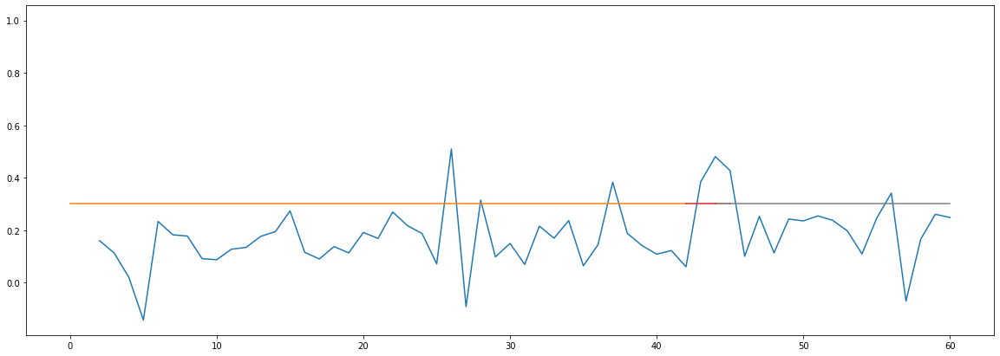

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 17                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 162, 'value': 1.1899941377172378}, {'index': 25, 'value': 0.7329736164996445}, {'index': 162, 'value': 0.9154182206027514}, {'index': 103, 'value': 0.9298792111400954}]


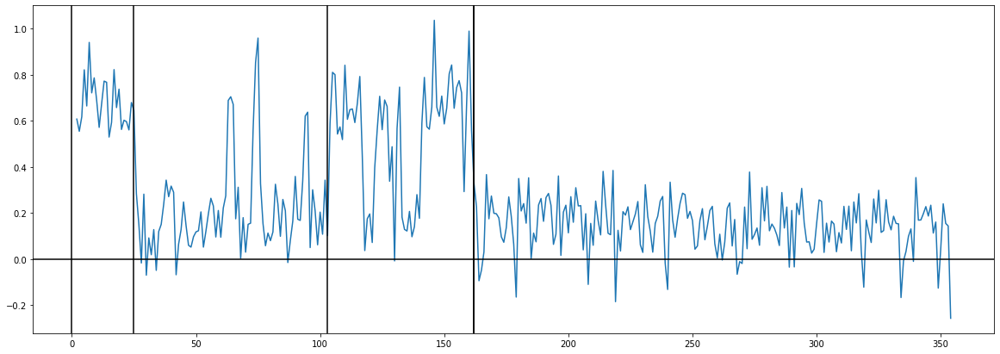

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 162, 25, 162, 103]
Transitionpoints indices without doubles: [  0  25 103 162]
Transitionpoints ordered: [0, 25, 103, 162]
START:
0
______________
END
25
______________
START:
25
______________
END
103
______________
START:
103
______________
END
162
______________
START:
162
______________
END
-1
______________
MEANS:
[{'mean': 0.67132, 'start': 0, 'end': 25}, {'mean': 0.21565384615384617, 'start': 25, 'end': 103}, {'mean': 0.533, 'start': 103, 'end': 162}, {'mean': 0.14732460732984295, 'start': 162, 'end': -1}]


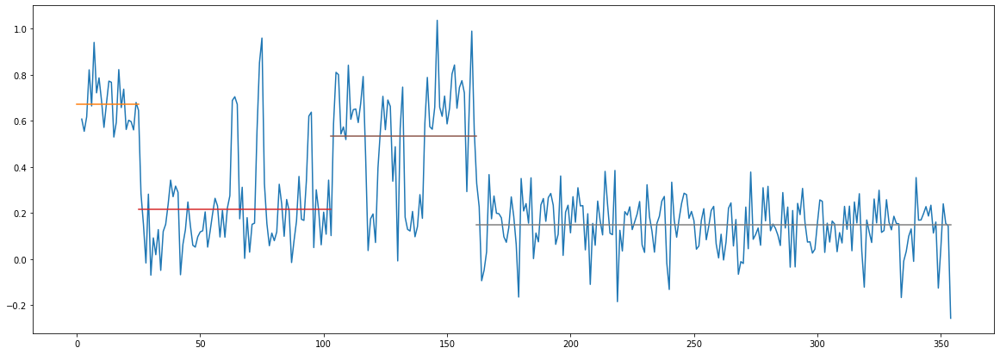

The value at 68.2% is 2.728


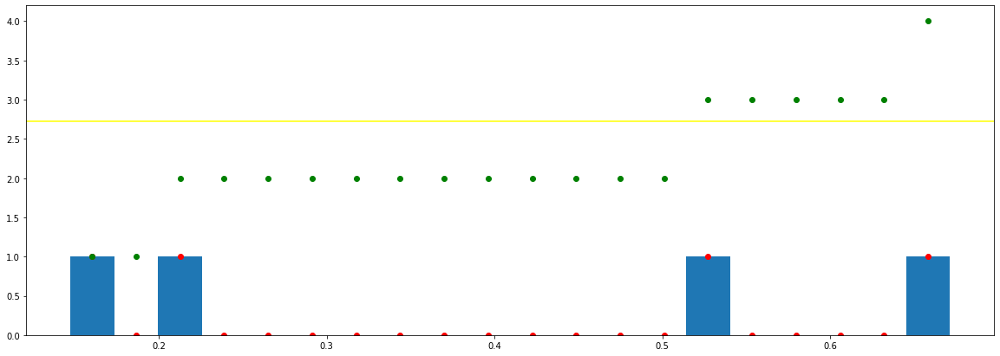

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.38567539267015705
New curren min is 0.45566615384615383
New curren min is 0.13832
New curren min is 0.523995392670157
New curren min is 0.31734615384615383
New curren min is 0.06832923882400321
MEAN BEFORE:
[{'mean': 0.67132, 'start': 0, 'end': 25}, {'mean': 0.21565384615384617, 'start': 25, 'end': 103}, {'mean': 0.533, 'start': 103, 'end': 162}, {'mean': 0.14732460732984295, 'start': 162, 'end': -1}]
MEANS AFTER
[{'mean': 0.67132, 'start': 0, 'end': 25}, {'mean': 0.18148922674184456, 'start': 25, 'end': 103}, {'mean': 0.533, 'start': 103, 'end': 162}, {'mean': 0.18148922674184456, 'start': 162, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.67132}, {'x': 162, 'y_1': 0.533, 'y_2': 0.18148922674184456}, {'x': 25, 'y_1': 0.67132, 'y_2': 0.18148922674184456}, {'x': 162, 'y_

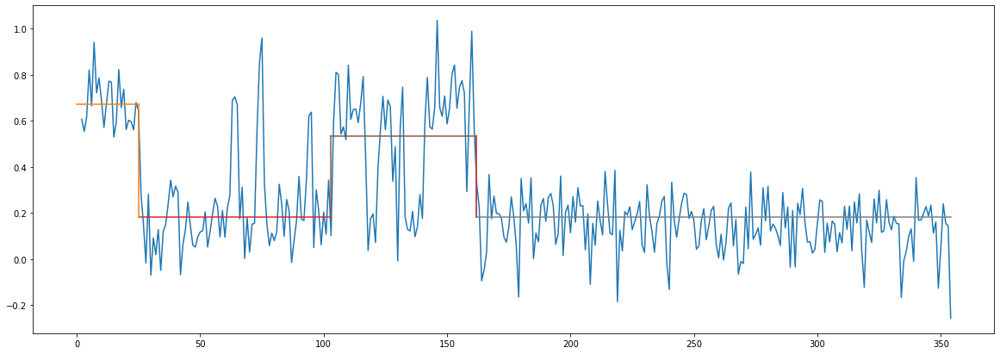

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.3515107732581555
New curren min is 0.4898307732581555
New curren min is 0.13832
New curren min is 0.4898307732581555
New curren min is 0.3515107732581555
MEAN BEFORE:
[{'mean': 0.67132, 'start': 0, 'end': 25}, {'mean': 0.18148922674184456, 'start': 25, 'end': 103}, {'mean': 0.533, 'start': 103, 'end': 162}, {'mean': 0.18148922674184456, 'start': 162, 'end': -1}]
MEANS AFTER
[{'mean': 0.60216, 'start': 0, 'end': 25}, {'mean': 0.18148922674184456, 'start': 25, 'end': 103}, {'mean': 0.60216, 'start': 103, 'end': 162}, {'mean': 0.18148922674184456, 'start': 162, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.60216}, {'x': 162, 'y_1': 0.60216, 'y_2': 0.18148922674184456}, {'x': 25, 'y_1': 0.60216, 'y_2': 0.18148922674184456}, {'x': 162, 'y_1': 0.60216, 'y_2': 0.18148922674184

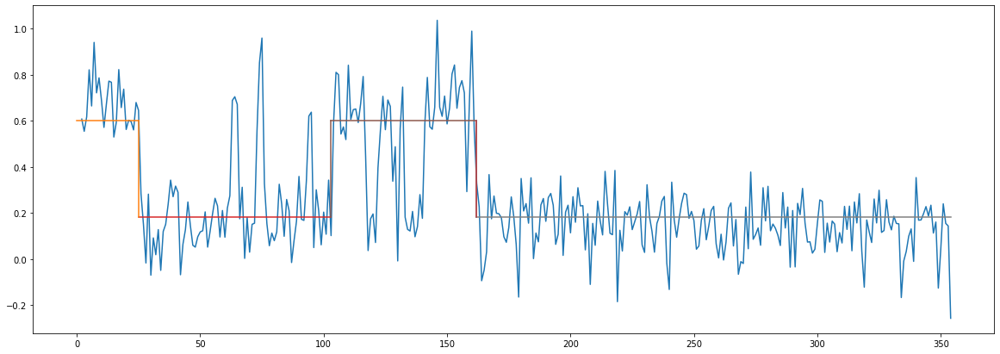

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.4206707732581555
New curren min is 0.4206707732581555
New curren min is 0.4206707732581555
New curren min is 0.4206707732581555
MEAN BEFORE:
[{'mean': 0.60216, 'start': 0, 'end': 25}, {'mean': 0.18148922674184456, 'start': 25, 'end': 103}, {'mean': 0.60216, 'start': 103, 'end': 162}, {'mean': 0.18148922674184456, 'start': 162, 'end': -1}]
MEANS AFTER
[{'mean': 0.3918246133709223, 'start': 0, 'end': 25}, {'mean': 0.3918246133709223, 'start': 25, 'end': 103}, {'mean': 0.3918246133709223, 'start': 103, 'end': 162}, {'mean': 0.3918246133709223, 'start': 162, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.3918246133709223}, {'x': 162, 'y_1': 0.3918246133709223, 'y_2': 0.3918246133709223}, {'x': 25, 'y_1': 0.3918246133709223, 'y_2': 0.3918246133709223}, {'x': 162, 'y_1': 0.391

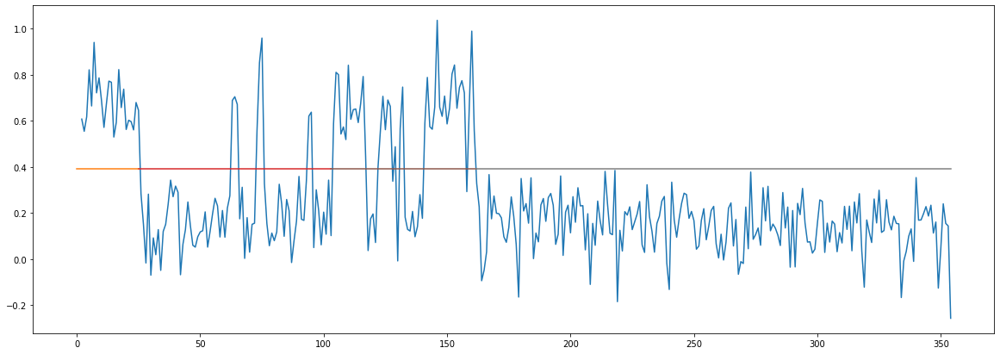

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 18                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 93, 'value': 1.8783950392266398}, {'index': 172, 'value': 0.3899930187777327}, {'index': 157, 'value': 0.4693670403394969}, {'index': 166, 'value': 0.70517049474629}]


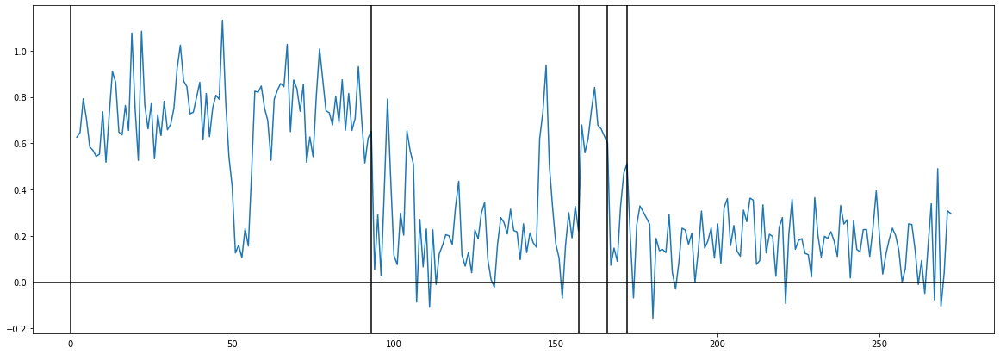

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 93, 172, 157, 166]
Transitionpoints indices without doubles: [  0  93 157 166 172]
Transitionpoints ordered: [0, 93, 157, 166, 172]
START:
0
______________
END
93
______________
START:
93
______________
END
157
______________
START:
157
______________
END
166
______________
START:
166
______________
END
172
______________
START:
172
______________
END
-1
______________
MEANS:
[{'mean': 0.7059784946236558, 'start': 0, 'end': 93}, {'mean': 0.23928124999999997, 'start': 93, 'end': 157}, {'mean': 0.6682222222222222, 'start': 157, 'end': 166}, {'mean': 0.26966666666666667, 'start': 166, 'end': 172}, {'mean': 0.17415151515151508, 'start': 172, 'end': -1}]


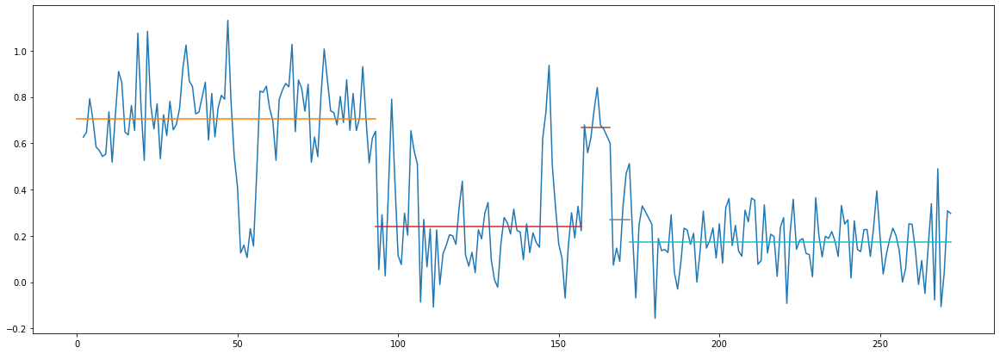

The value at 68.2% is 3.41


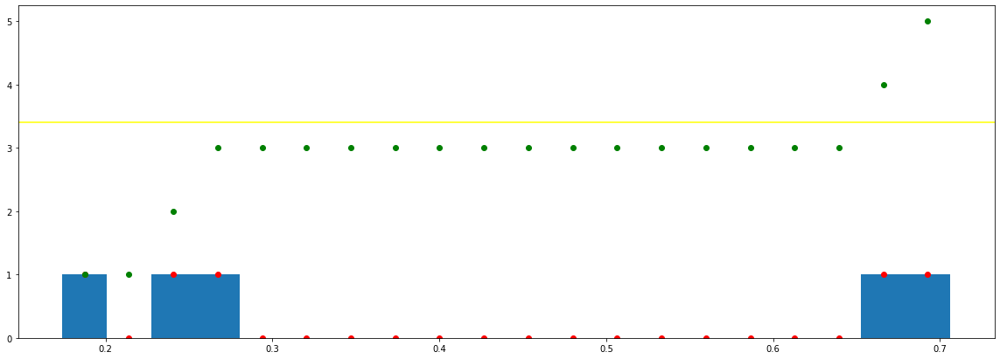

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.09551515151515158
New curren min is 0.4666972446236558
New curren min is 0.037756272401433644
New curren min is 0.43631182795698914
New curren min is 0.5318269794721407
New curren min is 0.42894097222222216
New curren min is 0.030385416666666692
New curren min is 0.06512973484848489
New curren min is 0.3985555555555555
New curren min is 0.4940707070707071
MEAN BEFORE:
[{'mean': 0.7059784946236558, 'start': 0, 'end': 93}, {'mean': 0.23928124999999997, 'start': 93, 'end': 157}, {'mean': 0.6682222222222222, 'start': 157, 'end': 166}, {'mean': 0.26966666666666667, 'start': 166, 'end': 172}, {'mean': 0.17415151515151508, 'start': 172, 'end': -1}]
MEANS AFTER
[{'mean': 0.7059784946236558, 'start': 0, 'end': 93}, {'mean': 0.2544739583333333, 'start': 93, 'end': 157}, {'mean': 0.668222222

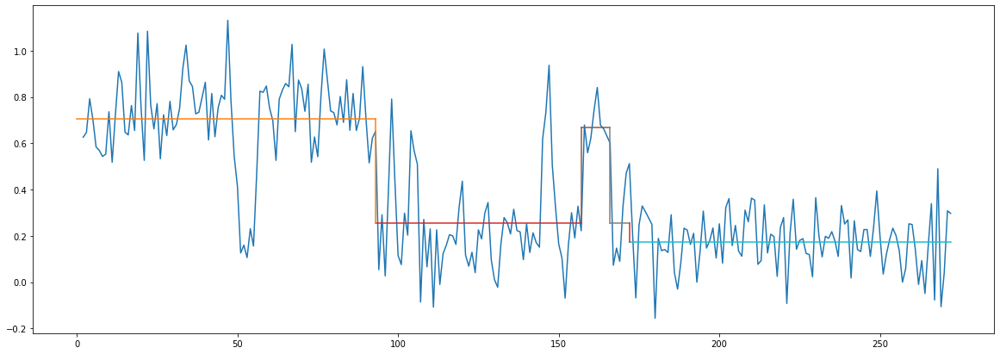

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.08032244318181822
New curren min is 0.4515045362903225
New curren min is 0.037756272401433644
New curren min is 0.4515045362903225
New curren min is 0.5318269794721407
New curren min is 0.41374826388888886
New curren min is 0.08032244318181822
New curren min is 0.41374826388888886
New curren min is 0.4940707070707071
MEAN BEFORE:
[{'mean': 0.7059784946236558, 'start': 0, 'end': 93}, {'mean': 0.2544739583333333, 'start': 93, 'end': 157}, {'mean': 0.6682222222222222, 'start': 157, 'end': 166}, {'mean': 0.2544739583333333, 'start': 166, 'end': 172}, {'mean': 0.17415151515151508, 'start': 172, 'end': -1}]
MEANS AFTER
[{'mean': 0.6871003584229389, 'start': 0, 'end': 93}, {'mean': 0.2544739583333333, 'start': 93, 'end': 157}, {'mean': 0.6871003584229389, 'start': 157, 'end': 166}, {'mea

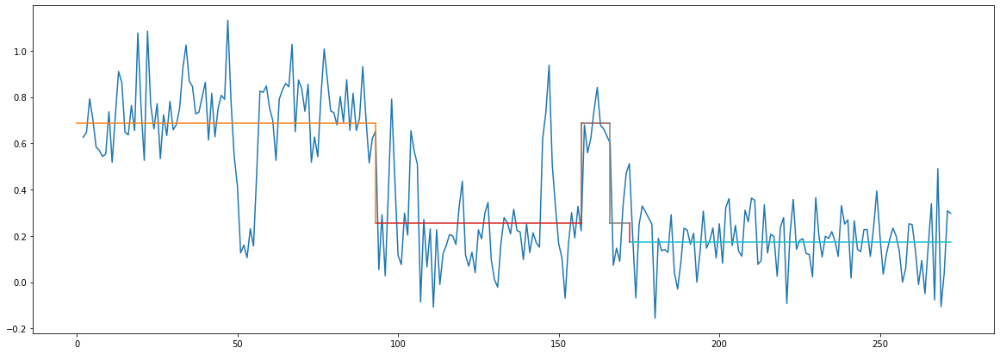

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.08032244318181822
New curren min is 0.4326264000896056
New curren min is 0.4326264000896056
New curren min is 0.5129488432714239
New curren min is 0.4326264000896056
New curren min is 0.08032244318181822
New curren min is 0.4326264000896056
New curren min is 0.5129488432714239
MEAN BEFORE:
[{'mean': 0.6871003584229389, 'start': 0, 'end': 93}, {'mean': 0.2544739583333333, 'start': 93, 'end': 157}, {'mean': 0.6871003584229389, 'start': 157, 'end': 166}, {'mean': 0.2544739583333333, 'start': 166, 'end': 172}, {'mean': 0.17415151515151508, 'start': 172, 'end': -1}]
MEANS AFTER
[{'mean': 0.6871003584229389, 'start': 0, 'end': 93}, {'mean': 0.21431273674242418, 'start': 93, 'end': 157}, {'mean': 0.6871003584229389, 'start': 157, 'end': 166}, {'mean': 0.21431273674242418, 'start': 166, '

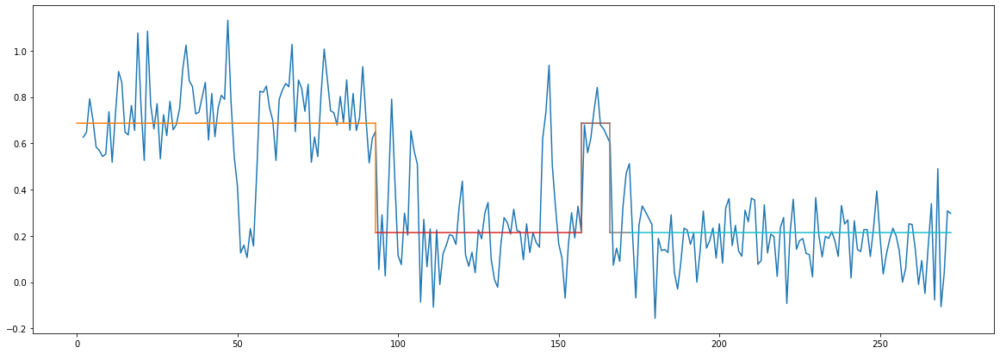

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
New curren min is 0.47278762168051475
New curren min is 0.47278762168051475
New curren min is 0.47278762168051475
New curren min is 0.47278762168051475
New curren min is 0.47278762168051475
New curren min is 0.47278762168051475
MEAN BEFORE:
[{'mean': 0.6871003584229389, 'start': 0, 'end': 93}, {'mean': 0.21431273674242418, 'start': 93, 'end': 157}, {'mean': 0.6871003584229389, 'start': 157, 'end': 166}, {'mean': 0.21431273674242418, 'start': 166, 'end': 172}, {'mean': 0.21431273674242418, 'start': 172, 'end': -1}]
MEANS AFTER
[{'mean': 0.4507065475826816, 'start': 0, 'end': 93}, {'mean': 0.4507065475826816, 'start': 93, 'end': 157}, {'mean': 0.4507065475826816, 'start': 157, 'end': 166}, {'mean': 0.4507065475826816, 'start': 166, 'end': 172}, {'mean': 0.4507065475826816, 'start': 172, 'end': -1}]
ver

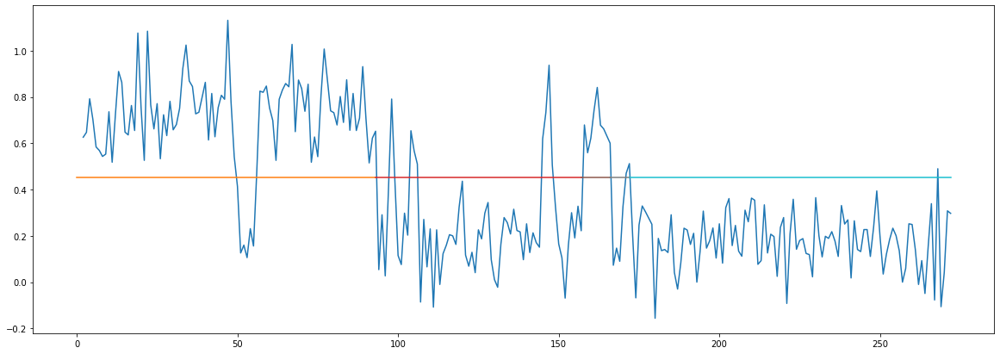

___________________________________________________________________________________
Blending Cycle Nr. 5
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 19                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 204, 'value': 0.3595634219186858}, {'index': 203, 'value': 0.3591730743126021}, {'index': 203, 'value': 0.3591730743126021}, {'index': 203, 'value': 0.3591730743126021}]


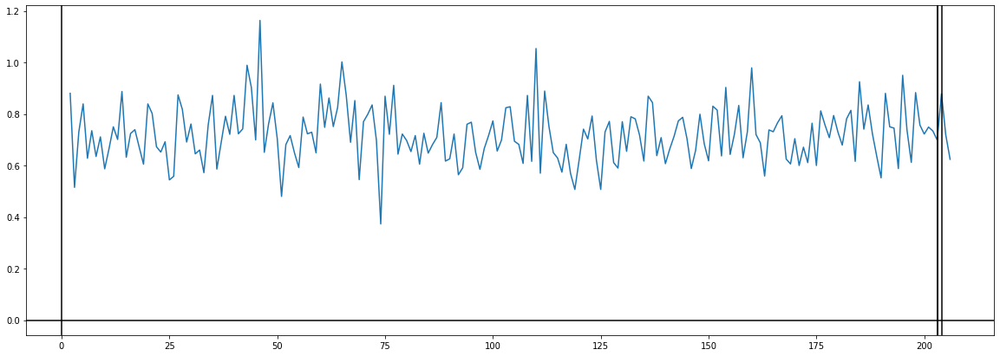

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 204, 203, 203, 203]
Transitionpoints indices without doubles: [  0 203 204]
Transitionpoints ordered: [0, 203, 204]
START:
0
______________
END
203
______________
START:
203
______________
END
204
______________
START:
204
______________
END
-1
______________
MEANS:
[{'mean': 0.7201133004926112, 'start': 0, 'end': 203}, {'mean': 0.878, 'start': 203, 'end': 204}, {'mean': 0.718, 'start': 204, 'end': -1}]


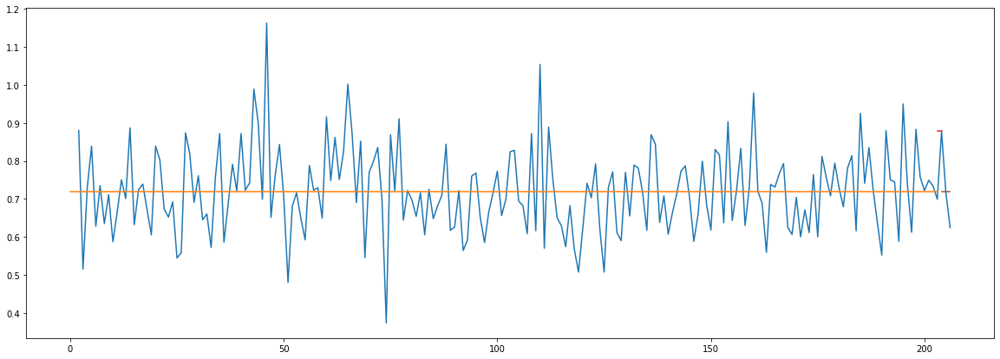

The value at 68.2% is 2.0460000000000003


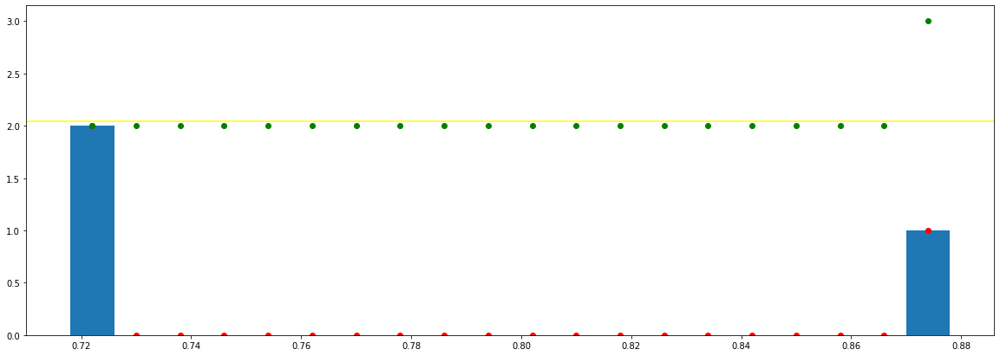

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.16000000000000003
New curren min is 0.15788669950738876
New curren min is 0.0021133004926112697
MEAN BEFORE:
[{'mean': 0.7201133004926112, 'start': 0, 'end': 203}, {'mean': 0.878, 'start': 203, 'end': 204}, {'mean': 0.718, 'start': 204, 'end': -1}]
MEANS AFTER
[{'mean': 0.7190566502463056, 'start': 0, 'end': 203}, {'mean': 0.878, 'start': 203, 'end': 204}, {'mean': 0.7190566502463056, 'start': 204, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.7190566502463056}, {'x': 204, 'y_1': 0.878, 'y_2': 0.7190566502463056}, {'x': 203, 'y_1': 0.7190566502463056, 'y_2': 0.878}, {'x': 203, 'y_1': 0.7190566502463056, 'y_2': 0.878}, {'x': 203, 'y_1': 0.7190566502463056, 'y_2': 0.878}]


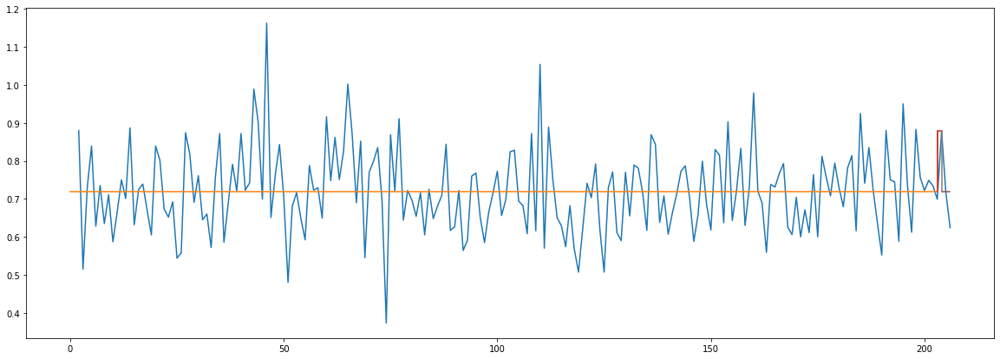

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.1589433497536944
New curren min is 0.1589433497536944
MEAN BEFORE:
[{'mean': 0.7190566502463056, 'start': 0, 'end': 203}, {'mean': 0.878, 'start': 203, 'end': 204}, {'mean': 0.7190566502463056, 'start': 204, 'end': -1}]
MEANS AFTER
[{'mean': 0.7985283251231527, 'start': 0, 'end': 203}, {'mean': 0.7985283251231527, 'start': 203, 'end': 204}, {'mean': 0.7985283251231527, 'start': 204, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.7985283251231527}, {'x': 204, 'y_1': 0.7985283251231527, 'y_2': 0.7985283251231527}, {'x': 203, 'y_1': 0.7985283251231527, 'y_2': 0.7985283251231527}, {'x': 203, 'y_1': 0.7985283251231527, 'y_2': 0.7985283251231527}, {'x': 203, 'y_1': 0.7985283251231527, 'y_2': 0.7985283251231527}]


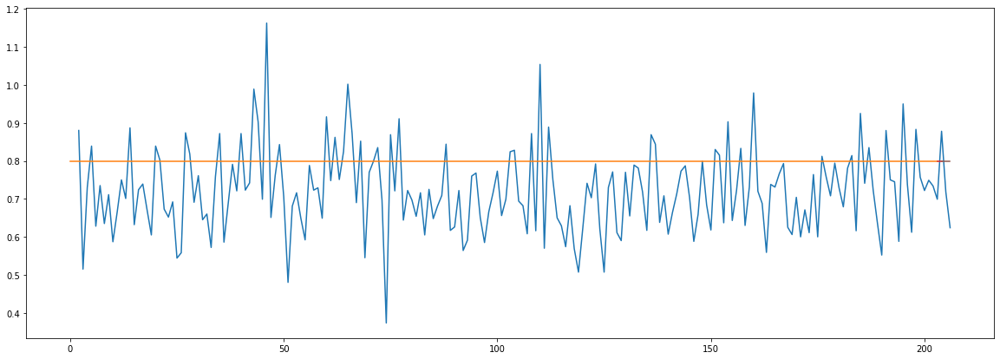

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 20                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 43, 'value': 1.4449753300043637}, {'index': 107, 'value': 0.37986412685036286}, {'index': 106, 'value': 0.37837393452165397}, {'index': 106, 'value': 0.37837393452165397}]


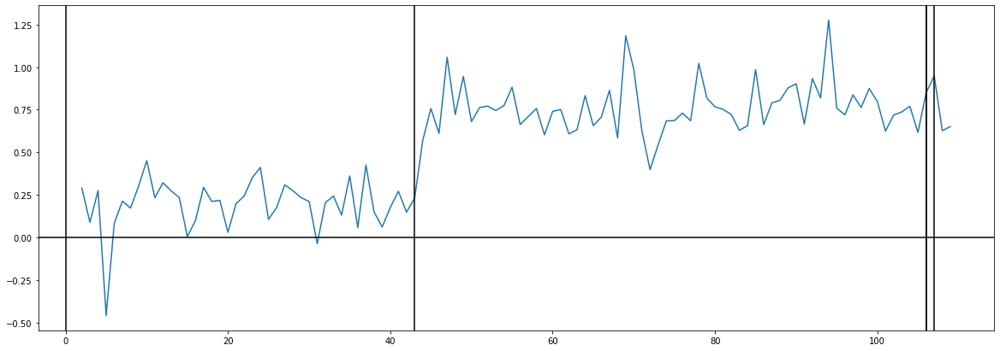

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 43, 107, 106, 106]
Transitionpoints indices without doubles: [  0  43 106 107]
Transitionpoints ordered: [0, 43, 106, 107]
START:
0
______________
END
43
______________
START:
43
______________
END
106
______________
START:
106
______________
END
107
______________
START:
107
______________
END
-1
______________
MEANS:
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.7627301587301589, 'start': 43, 'end': 106}, {'mean': 0.949, 'start': 106, 'end': 107}, {'mean': 0.627, 'start': 107, 'end': -1}]


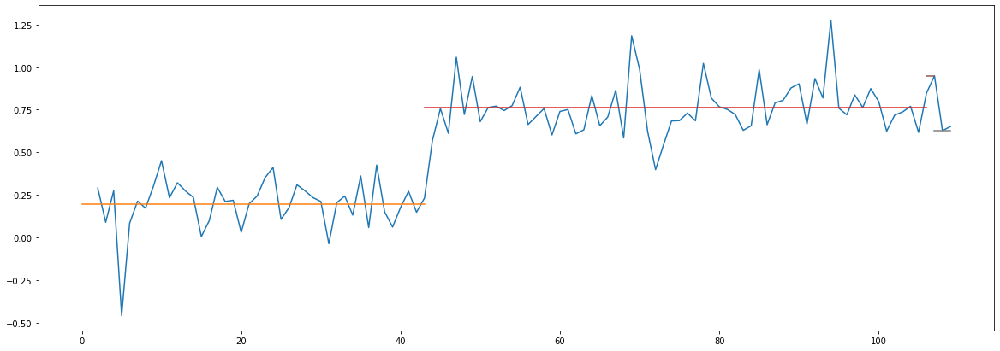

The value at 68.2% is 2.728


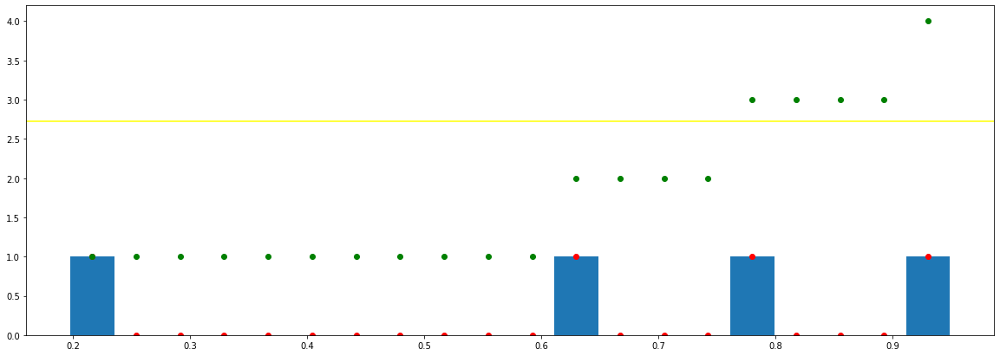

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.32199999999999995
New curren min is 0.5651720191952752
New curren min is 0.7514418604651163
New curren min is 0.4294418604651163
New curren min is 0.18626984126984103
New curren min is 0.13573015873015892
MEAN BEFORE:
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.7627301587301589, 'start': 43, 'end': 106}, {'mean': 0.949, 'start': 106, 'end': 107}, {'mean': 0.627, 'start': 107, 'end': -1}]
MEANS AFTER
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.6948650793650795, 'start': 43, 'end': 106}, {'mean': 0.949, 'start': 106, 'end': 107}, {'mean': 0.6948650793650795, 'start': 107, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.19755813953488371}, {'x': 43, 'y_1': 0.19755813953488371, 'y_2': 0.6948650793650795}, {'x': 107, 'y_1': 0.949, 'y

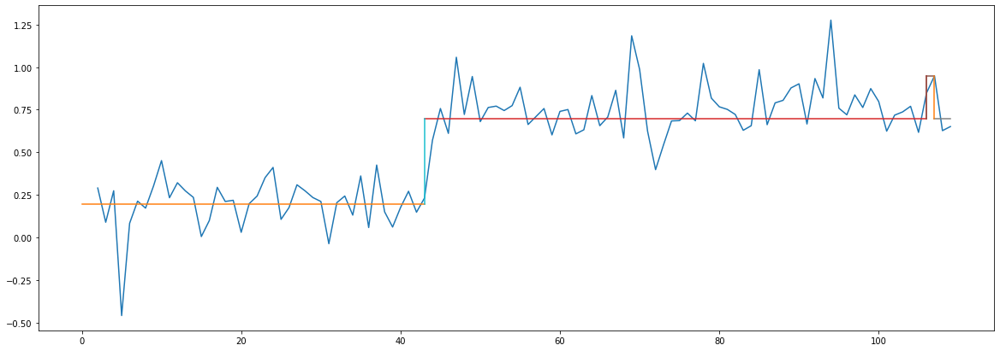

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.2541349206349205
New curren min is 0.49730693983019575
New curren min is 0.7514418604651163
New curren min is 0.49730693983019575
New curren min is 0.2541349206349205
MEAN BEFORE:
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.6948650793650795, 'start': 43, 'end': 106}, {'mean': 0.949, 'start': 106, 'end': 107}, {'mean': 0.6948650793650795, 'start': 107, 'end': -1}]
MEANS AFTER
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.8219325396825397, 'start': 43, 'end': 106}, {'mean': 0.8219325396825397, 'start': 106, 'end': 107}, {'mean': 0.8219325396825397, 'start': 107, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.19755813953488371}, {'x': 43, 'y_1': 0.19755813953488371, 'y_2': 0.8219325396825397}, {'x': 107, 'y_1': 0.8219325396825397, '

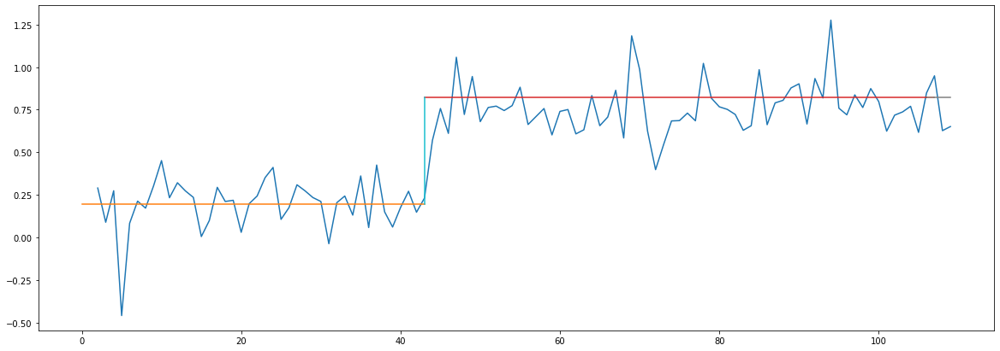

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.6243744001476559
New curren min is 0.6243744001476559
New curren min is 0.6243744001476559
MEAN BEFORE:
[{'mean': 0.19755813953488371, 'start': 0, 'end': 43}, {'mean': 0.8219325396825397, 'start': 43, 'end': 106}, {'mean': 0.8219325396825397, 'start': 106, 'end': 107}, {'mean': 0.8219325396825397, 'start': 107, 'end': -1}]
MEANS AFTER
[{'mean': 0.5097453396087117, 'start': 0, 'end': 43}, {'mean': 0.5097453396087117, 'start': 43, 'end': 106}, {'mean': 0.5097453396087117, 'start': 106, 'end': 107}, {'mean': 0.5097453396087117, 'start': 107, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.5097453396087117}, {'x': 43, 'y_1': 0.5097453396087117, 'y_2': 0.5097453396087117}, {'x': 107, 'y_1': 0.5097453396087117, 'y_2': 0.5097453396087117}, {'x': 106, 'y_1': 0.5097453396087117, '

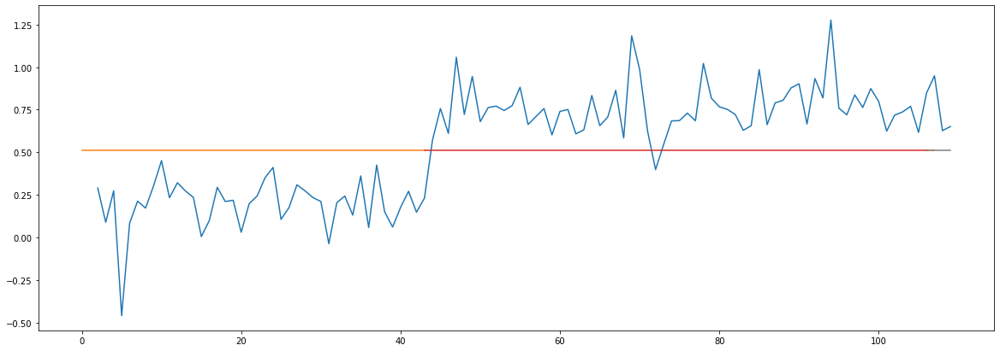

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 21                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 14, 'value': 0.09139067658761951}, {'index': 16, 'value': 0.13179704677443094}, {'index': 4, 'value': 0.1309754329758443}, {'index': 14, 'value': 0.1399070461254742}]


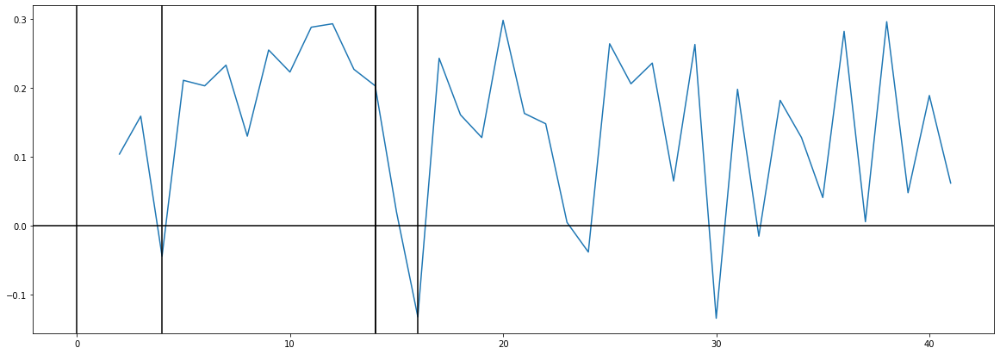

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 14, 16, 4, 14]
Transitionpoints indices without doubles: [ 0  4 14 16]
Transitionpoints ordered: [0, 4, 14, 16]
START:
0
______________
END
4
______________
START:
4
______________
END
14
______________
START:
14
______________
END
16
______________
START:
16
______________
END
-1
______________
MEANS:
[{'mean': 0.07425, 'start': 0, 'end': 4}, {'mean': 0.2266, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.14012499999999997, 'start': 16, 'end': -1}]


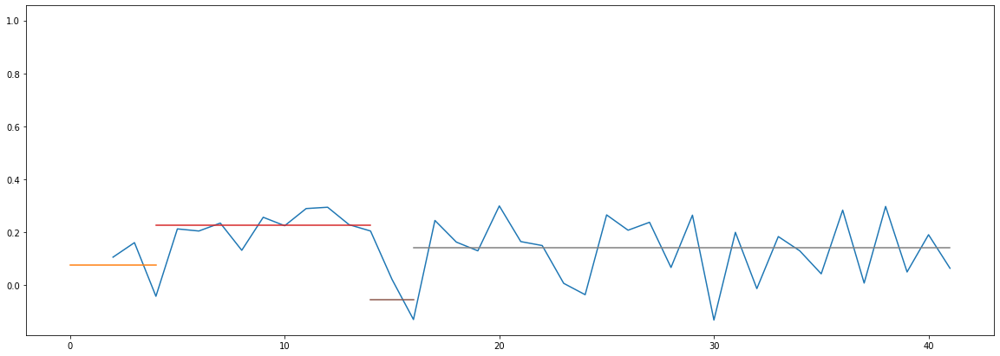

The value at 68.2% is 2.728


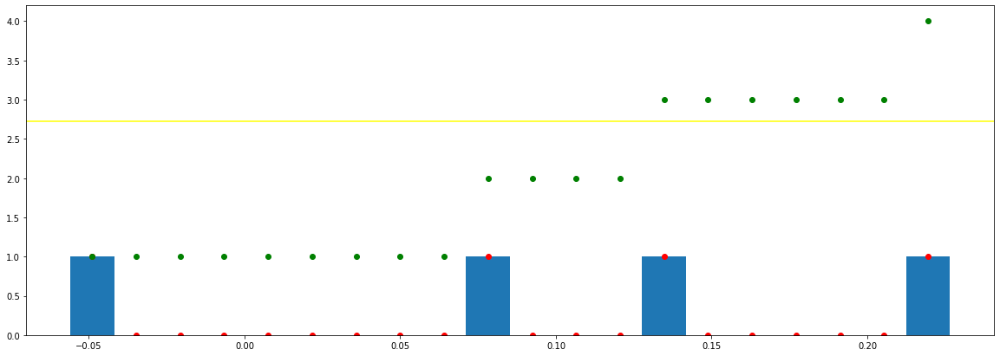

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.19612499999999997
New curren min is 0.15234999999999999
New curren min is 0.13025
New curren min is 0.06587499999999998
New curren min is 0.2826
New curren min is 0.08647500000000002
MEAN BEFORE:
[{'mean': 0.07425, 'start': 0, 'end': 4}, {'mean': 0.2266, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.14012499999999997, 'start': 16, 'end': -1}]
MEANS AFTER
[{'mean': 0.10718749999999999, 'start': 0, 'end': 4}, {'mean': 0.2266, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.10718749999999999, 'start': 16, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.10718749999999999}, {'x': 14, 'y_1': 0.2266, 'y_2': -0.056}, {'x': 16, 'y_1': -0.056, 'y_2': 0.10718749999999999}, {'x': 4, 'y_1': 0.10718749999999999, 'y_2': 0.2266}

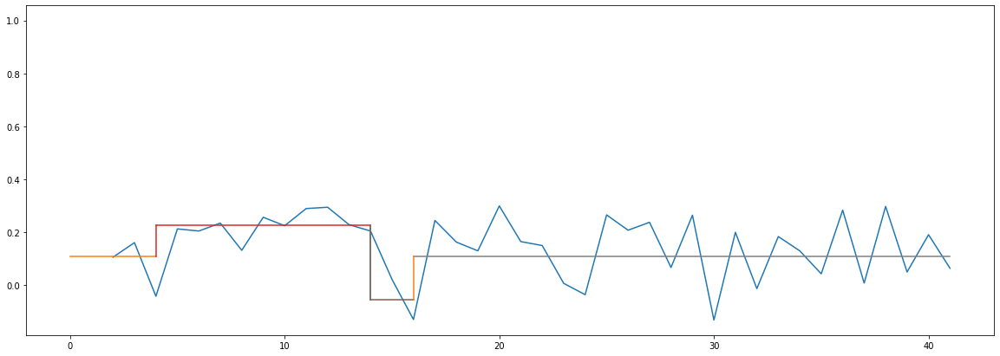

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.16318749999999999
New curren min is 0.1194125
New curren min is 0.16318749999999999
New curren min is 0.2826
New curren min is 0.1194125
MEAN BEFORE:
[{'mean': 0.10718749999999999, 'start': 0, 'end': 4}, {'mean': 0.2266, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.10718749999999999, 'start': 16, 'end': -1}]
MEANS AFTER
[{'mean': 0.16689375, 'start': 0, 'end': 4}, {'mean': 0.16689375, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.16689375, 'start': 16, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.16689375}, {'x': 14, 'y_1': 0.16689375, 'y_2': -0.056}, {'x': 16, 'y_1': -0.056, 'y_2': 0.16689375}, {'x': 4, 'y_1': 0.16689375, 'y_2': 0.16689375}, {'x': 14, 'y_1': 0.16689375, 'y_2': -0.056}]


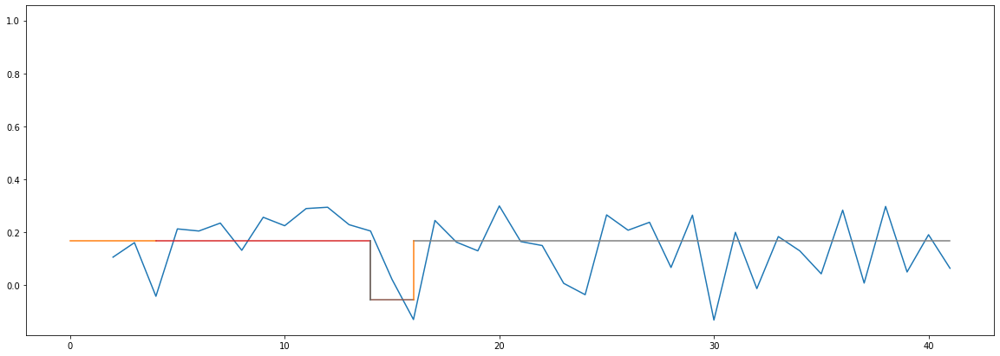

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.22289375
New curren min is 0.22289375
New curren min is 0.22289375
MEAN BEFORE:
[{'mean': 0.16689375, 'start': 0, 'end': 4}, {'mean': 0.16689375, 'start': 4, 'end': 14}, {'mean': -0.056, 'start': 14, 'end': 16}, {'mean': 0.16689375, 'start': 16, 'end': -1}]
MEANS AFTER
[{'mean': 0.05544687500000001, 'start': 0, 'end': 4}, {'mean': 0.05544687500000001, 'start': 4, 'end': 14}, {'mean': 0.05544687500000001, 'start': 14, 'end': 16}, {'mean': 0.05544687500000001, 'start': 16, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.05544687500000001}, {'x': 14, 'y_1': 0.05544687500000001, 'y_2': 0.05544687500000001}, {'x': 16, 'y_1': 0.05544687500000001, 'y_2': 0.05544687500000001}, {'x': 4, 'y_1': 0.05544687500000001, 'y_2': 0.05544687500000001}, {'x': 14, 'y_1': 0.05544687500000001, 

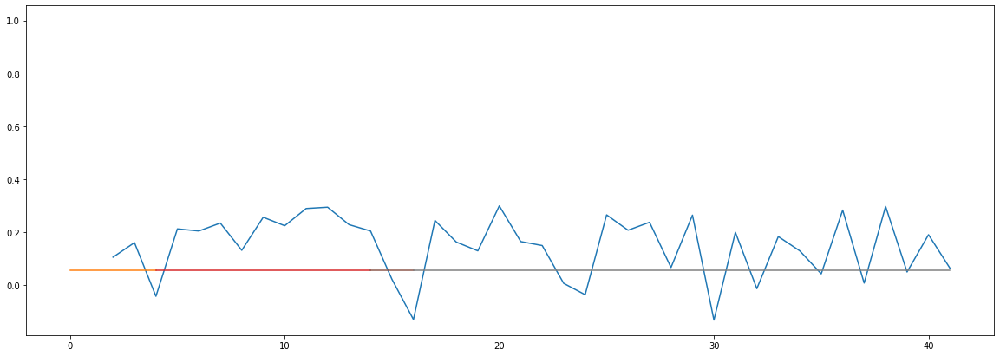

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 22                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 34, 'value': 0.1430614065782463}, {'index': 32, 'value': 0.13018886344630703}, {'index': 34, 'value': 0.13301220965116164}, {'index': 32, 'value': 0.13018886344630703}]


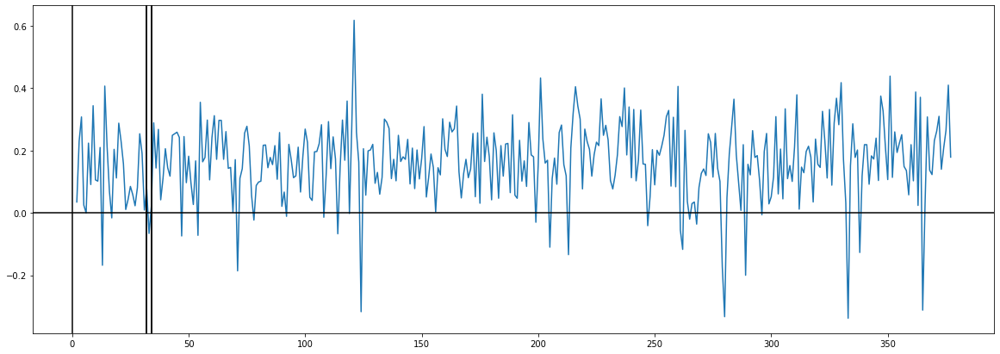

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 34, 32, 34, 32]
Transitionpoints indices without doubles: [ 0 32 34]
Transitionpoints ordered: [0, 32, 34]
START:
0
______________
END
32
______________
START:
32
______________
END
34
______________
START:
34
______________
END
-1
______________
MEANS:
[{'mean': 0.12378125000000001, 'start': 0, 'end': 32}, {'mean': -0.022000000000000002, 'start': 32, 'end': 34}, {'mean': 0.16736842105263153, 'start': 34, 'end': -1}]


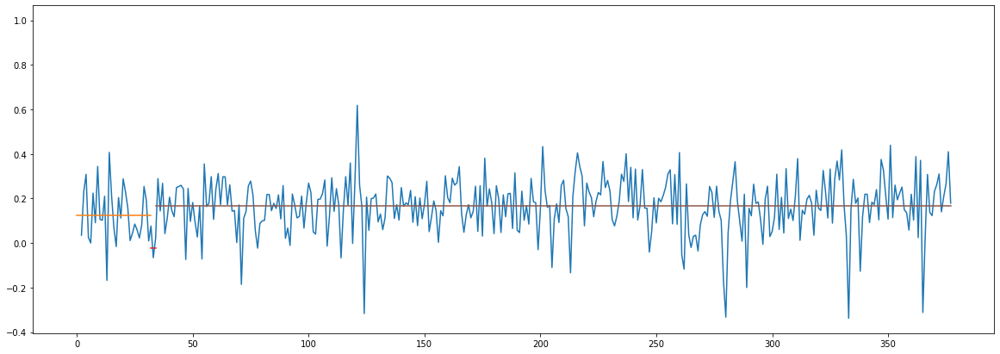

The value at 68.2% is 2.0460000000000003


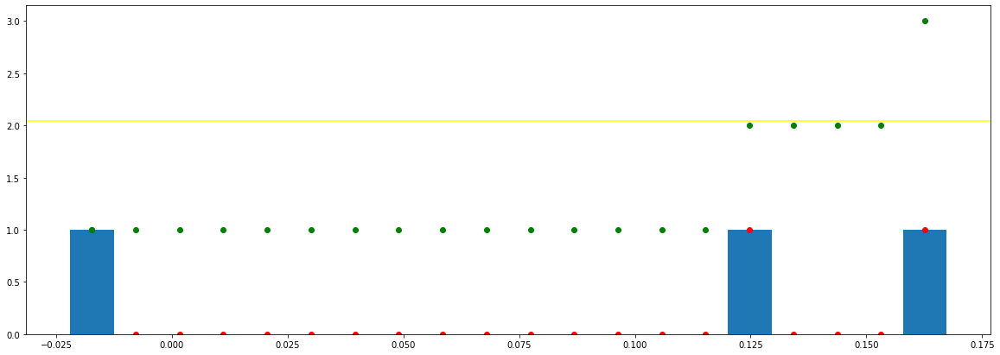

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.18936842105263152
New curren min is 0.14578125
New curren min is 0.04358717105263152
MEAN BEFORE:
[{'mean': 0.12378125000000001, 'start': 0, 'end': 32}, {'mean': -0.022000000000000002, 'start': 32, 'end': 34}, {'mean': 0.16736842105263153, 'start': 34, 'end': -1}]
MEANS AFTER
[{'mean': 0.14557483552631578, 'start': 0, 'end': 32}, {'mean': -0.022000000000000002, 'start': 32, 'end': 34}, {'mean': 0.14557483552631578, 'start': 34, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.14557483552631578}, {'x': 34, 'y_1': -0.022000000000000002, 'y_2': 0.14557483552631578}, {'x': 32, 'y_1': 0.14557483552631578, 'y_2': -0.022000000000000002}, {'x': 34, 'y_1': -0.022000000000000002, 'y_2': 0.14557483552631578}, {'x': 32, 'y_1': 0.14557483552631578, 'y_2': -0.022000000000000002}]


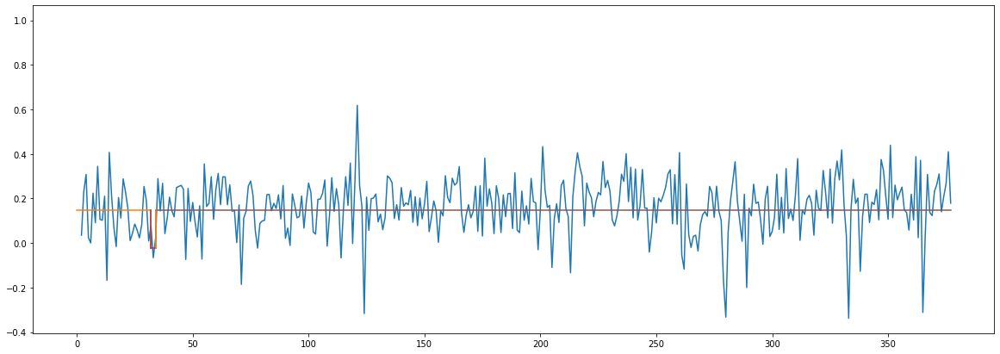

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.16757483552631577
New curren min is 0.16757483552631577
MEAN BEFORE:
[{'mean': 0.14557483552631578, 'start': 0, 'end': 32}, {'mean': -0.022000000000000002, 'start': 32, 'end': 34}, {'mean': 0.14557483552631578, 'start': 34, 'end': -1}]
MEANS AFTER
[{'mean': 0.06178741776315789, 'start': 0, 'end': 32}, {'mean': 0.06178741776315789, 'start': 32, 'end': 34}, {'mean': 0.06178741776315789, 'start': 34, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.06178741776315789}, {'x': 34, 'y_1': 0.06178741776315789, 'y_2': 0.06178741776315789}, {'x': 32, 'y_1': 0.06178741776315789, 'y_2': 0.06178741776315789}, {'x': 34, 'y_1': 0.06178741776315789, 'y_2': 0.06178741776315789}, {'x': 32, 'y_1': 0.06178741776315789, 'y_2': 0.06178741776315789}]


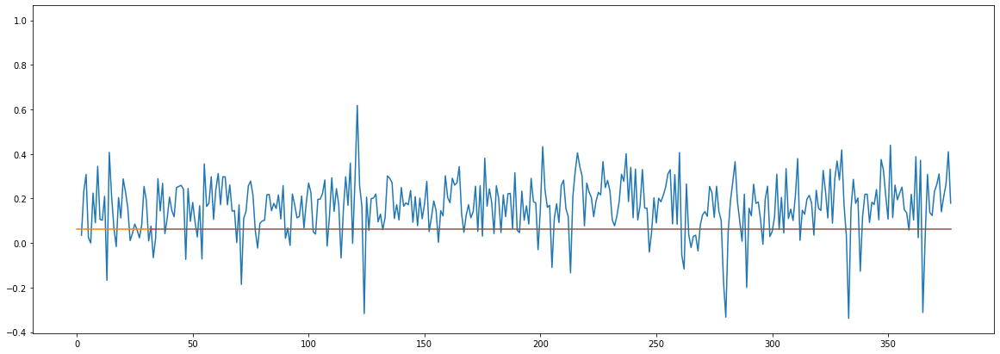

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 23                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
Value rejectedXXXXXXXXXXXXXXXXXXXXXXX
[{'index': 0, 'value': 0}, {'index': 284, 'value': 0.8581809530923851}]


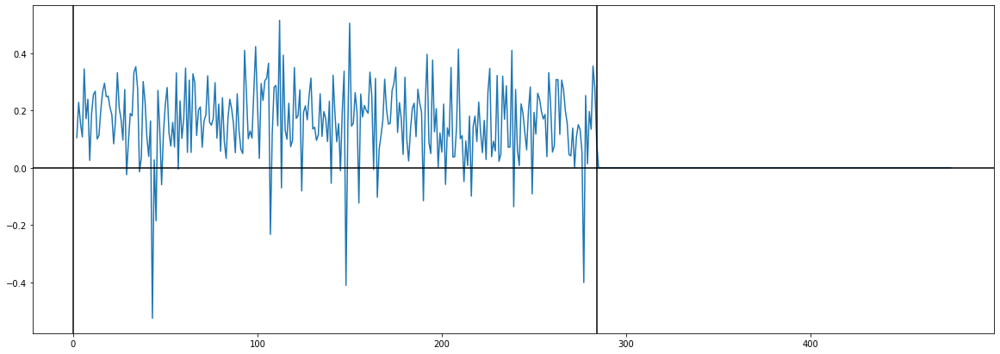

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 284]
Transitionpoints indices without doubles: [  0 284]
Transitionpoints ordered: [0, 284]
START:
0
______________
END
284
______________
START:
284
______________
END
-1
______________
MEANS:
[{'mean': 0.16061267605633786, 'start': 0, 'end': 284}, {'mean': 0.0, 'start': 284, 'end': -1}]


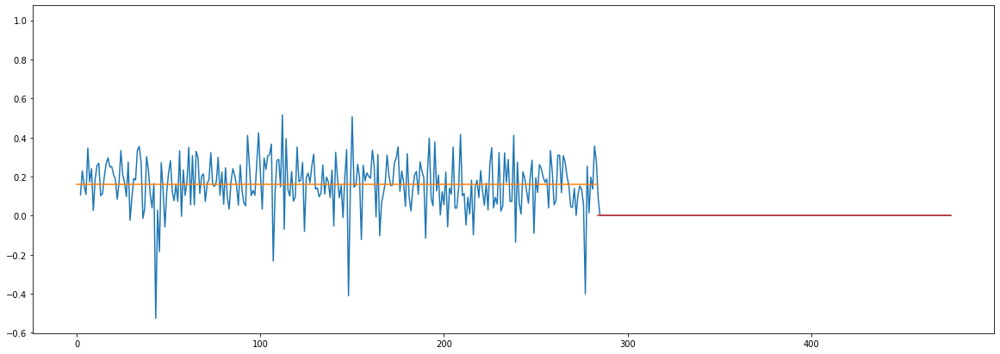

The value at 68.2% is 1.364


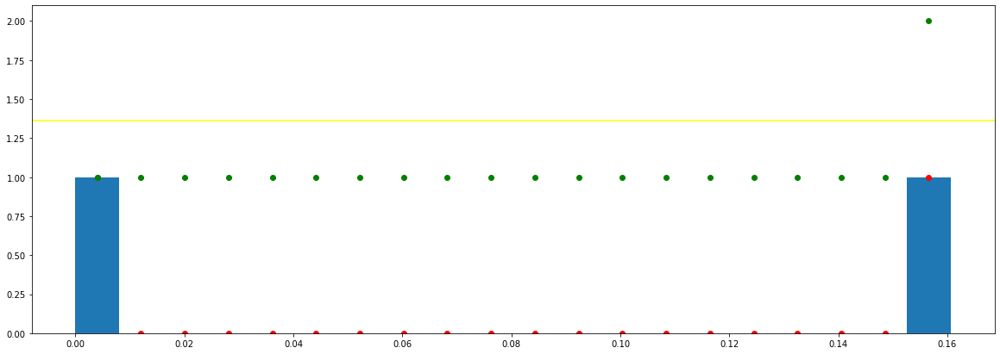

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.16061267605633786
MEAN BEFORE:
[{'mean': 0.16061267605633786, 'start': 0, 'end': 284}, {'mean': 0.0, 'start': 284, 'end': -1}]
MEANS AFTER
[{'mean': 0.08030633802816893, 'start': 0, 'end': 284}, {'mean': 0.08030633802816893, 'start': 284, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.08030633802816893}, {'x': 284, 'y_1': 0.08030633802816893, 'y_2': 0.08030633802816893}]


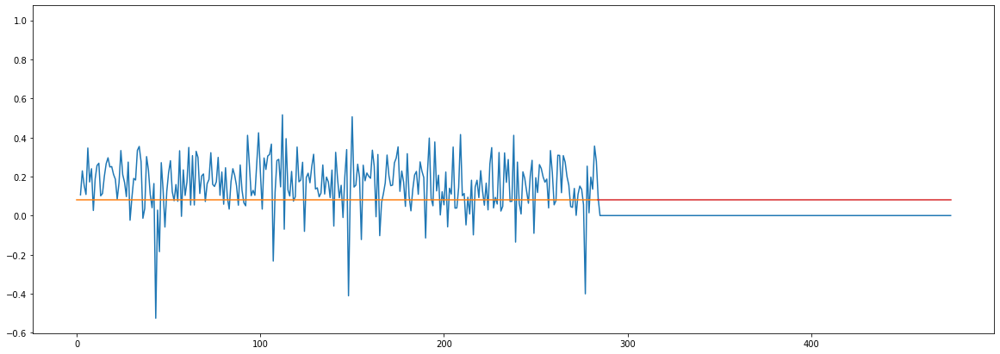

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 24                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 104, 'value': 0.5922771220028589}, {'index': 131, 'value': 0.8887497429009731}, {'index': 108, 'value': 0.31130960795345236}, {'index': 131, 'value': 0.942995001806518}]


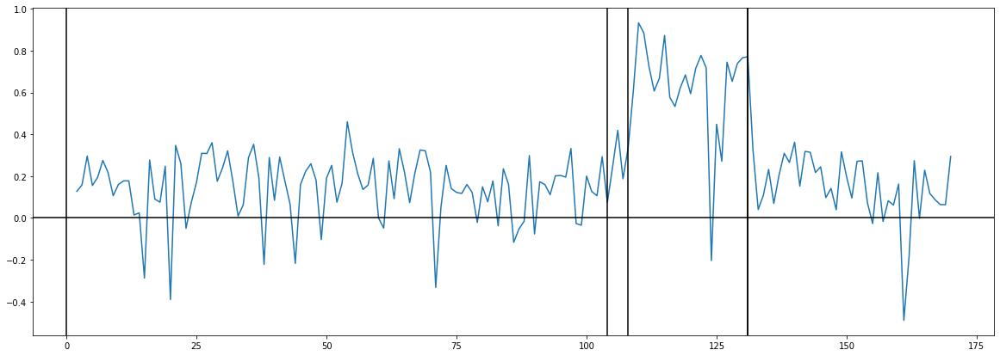

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 104, 131, 108, 131]
Transitionpoints indices without doubles: [  0 104 108 131]
Transitionpoints ordered: [0, 104, 108, 131]
START:
0
______________
END
104
______________
START:
104
______________
END
108
______________
START:
108
______________
END
131
______________
START:
131
______________
END
-1
______________
MEANS:
[{'mean': 0.14272115384615386, 'start': 0, 'end': 104}, {'mean': 0.29625, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.13921052631578942, 'start': 131, 'end': -1}]


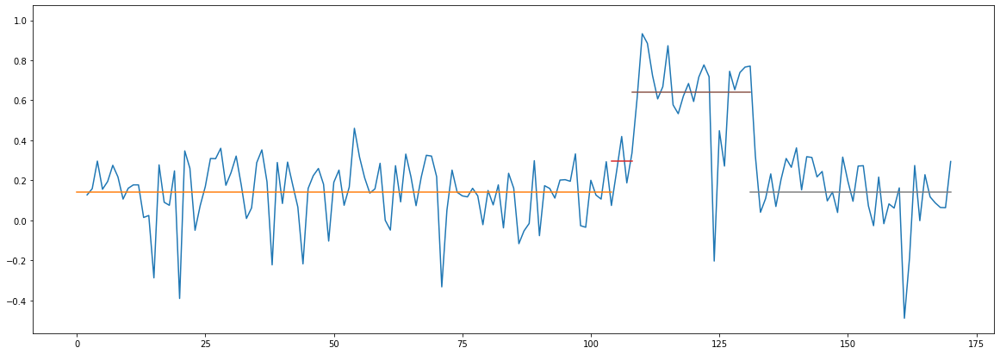

The value at 68.2% is 2.728


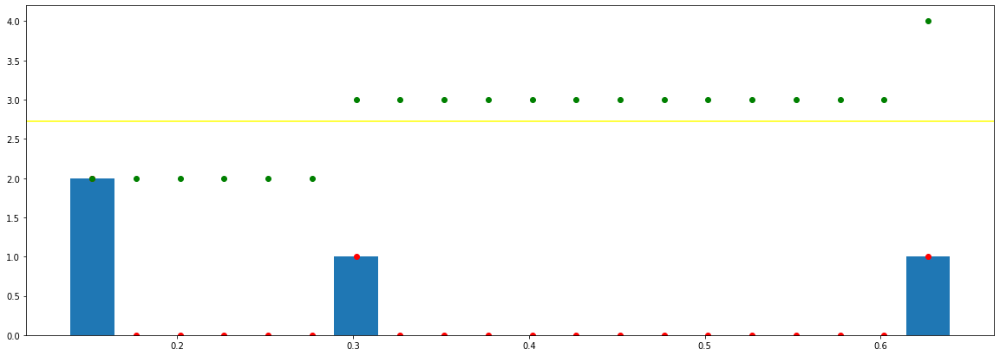

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.5003112128146453
New curren min is 0.15352884615384615
New curren min is 0.4968005852842809
New curren min is 0.003510627530364435
New curren min is 0.34327173913043474
New curren min is 0.1570394736842106
MEAN BEFORE:
[{'mean': 0.14272115384615386, 'start': 0, 'end': 104}, {'mean': 0.29625, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.13921052631578942, 'start': 131, 'end': -1}]
MEANS AFTER
[{'mean': 0.14096584008097163, 'start': 0, 'end': 104}, {'mean': 0.29625, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.14096584008097163, 'start': 131, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.14096584008097163}, {'x': 104, 'y_1': 0.14096584008097163, 'y_2': 0.29625}, {'x': 131, 'y

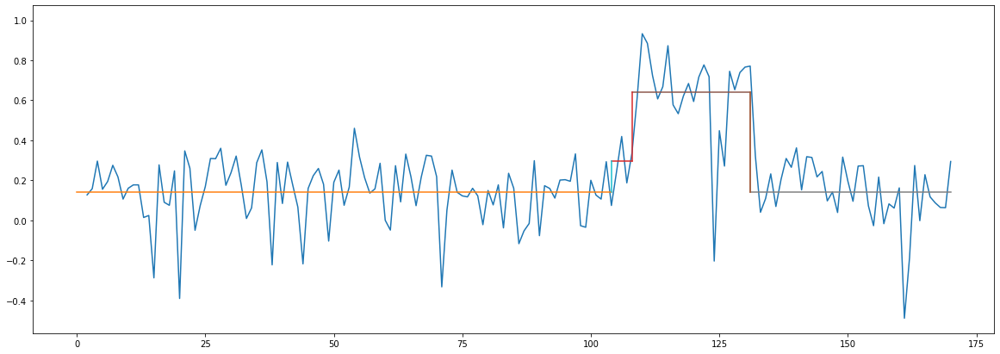

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.4985558990494631
New curren min is 0.15528415991902839
New curren min is 0.4985558990494631
New curren min is 0.34327173913043474
New curren min is 0.15528415991902839
MEAN BEFORE:
[{'mean': 0.14096584008097163, 'start': 0, 'end': 104}, {'mean': 0.29625, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.14096584008097163, 'start': 131, 'end': -1}]
MEANS AFTER
[{'mean': 0.21860792004048582, 'start': 0, 'end': 104}, {'mean': 0.21860792004048582, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.21860792004048582, 'start': 131, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.21860792004048582}, {'x': 104, 'y_1': 0.21860792004048582, 'y_2': 0.21860792004048582}, {'x': 131, 'y_1': 0.6395217

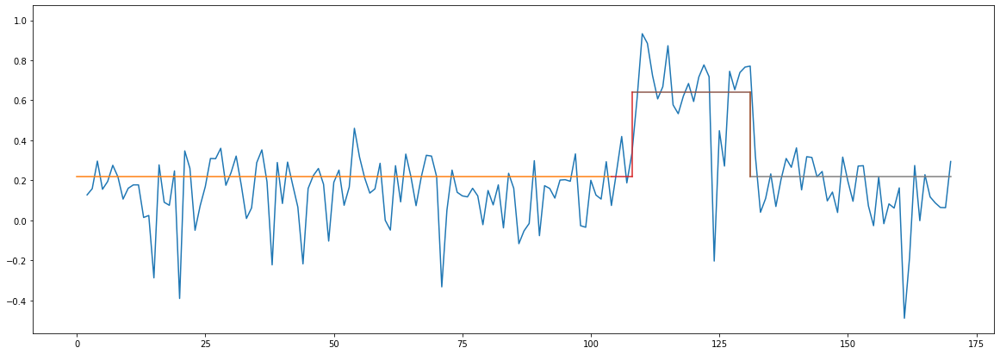

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.42091381908994896
New curren min is 0.42091381908994896
New curren min is 0.42091381908994896
MEAN BEFORE:
[{'mean': 0.21860792004048582, 'start': 0, 'end': 104}, {'mean': 0.21860792004048582, 'start': 104, 'end': 108}, {'mean': 0.6395217391304348, 'start': 108, 'end': 131}, {'mean': 0.21860792004048582, 'start': 131, 'end': -1}]
MEANS AFTER
[{'mean': 0.4290648295854603, 'start': 0, 'end': 104}, {'mean': 0.4290648295854603, 'start': 104, 'end': 108}, {'mean': 0.4290648295854603, 'start': 108, 'end': 131}, {'mean': 0.4290648295854603, 'start': 131, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.4290648295854603}, {'x': 104, 'y_1': 0.4290648295854603, 'y_2': 0.4290648295854603}, {'x': 131, 'y_1': 0.4290648295854603, 'y_2': 0.4290648295854603}, {'x': 108, 'y_1': 0.429064829

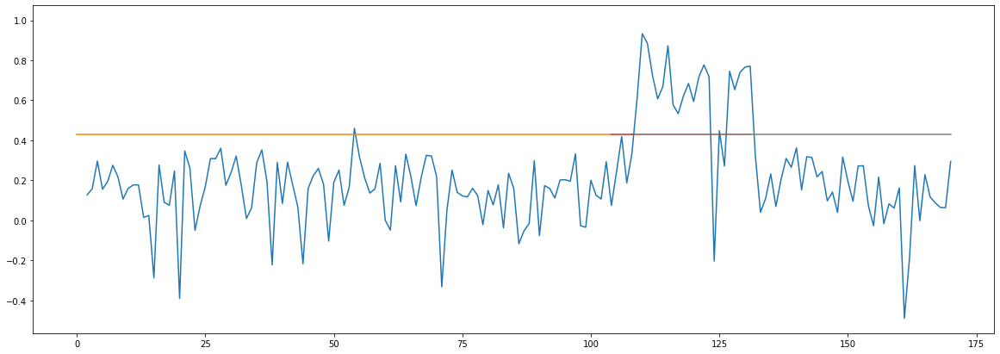

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 25                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 16, 'value': 0.10188049127556766}, {'index': 41, 'value': 0.12588905959482935}, {'index': 14, 'value': 0.10223938994899597}, {'index': 16, 'value': 0.18526812572852663}]


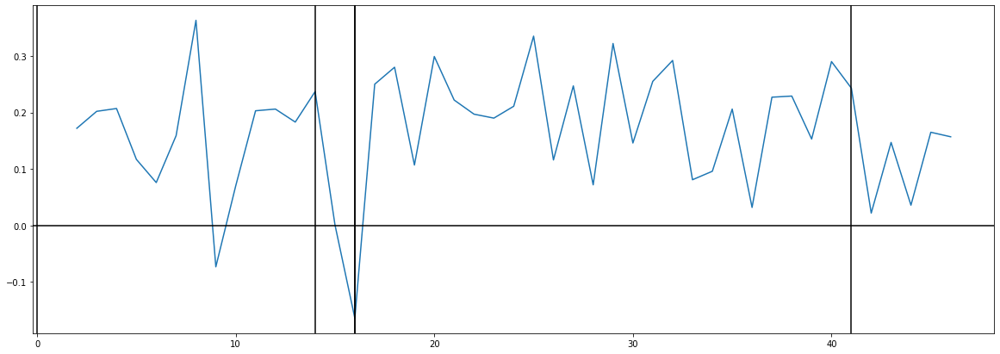

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 16, 41, 14, 16]
Transitionpoints indices without doubles: [ 0 14 16 41]
Transitionpoints ordered: [0, 14, 16, 41]
START:
0
______________
END
14
______________
START:
14
______________
END
16
______________
START:
16
______________
END
41
______________
START:
41
______________
END
-1
______________
MEANS:
[{'mean': 0.15557142857142855, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.20392, 'start': 16, 'end': 41}, {'mean': 0.0925, 'start': 41, 'end': -1}]


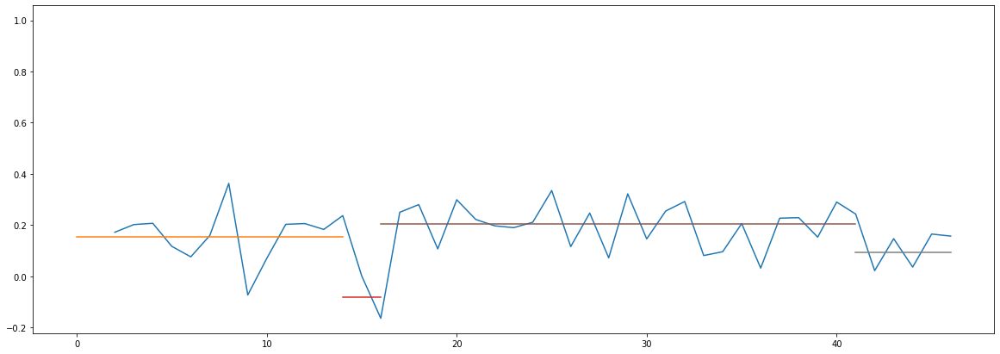

The value at 68.2% is 2.728


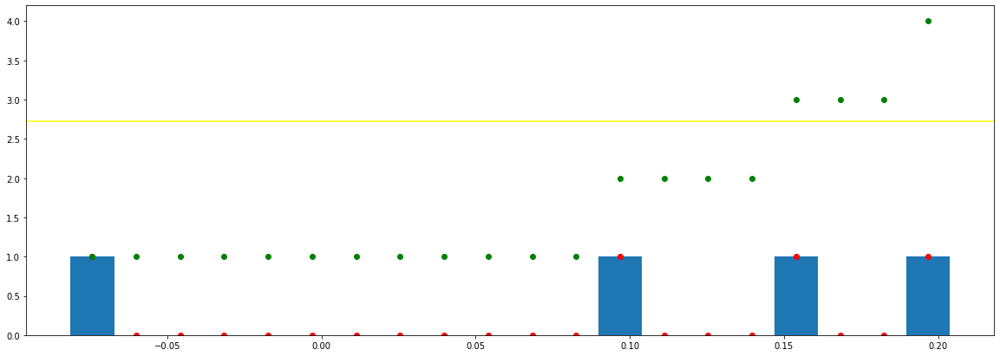

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.11141999999999999
New curren min is 0.2370714285714285
New curren min is 0.048348571428571435
New curren min is 0.06307142857142856
New curren min is 0.28541999999999995
New curren min is 0.17399999999999993
MEAN BEFORE:
[{'mean': 0.15557142857142855, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.20392, 'start': 16, 'end': 41}, {'mean': 0.0925, 'start': 41, 'end': -1}]
MEANS AFTER
[{'mean': 0.1797457142857143, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.1797457142857143, 'start': 16, 'end': 41}, {'mean': 0.0925, 'start': 41, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.1797457142857143}, {'x': 16, 'y_1': -0.08149999999999995, 'y_2': 0.1797457142857143}, {'x': 41, 'y_1': 0.179745

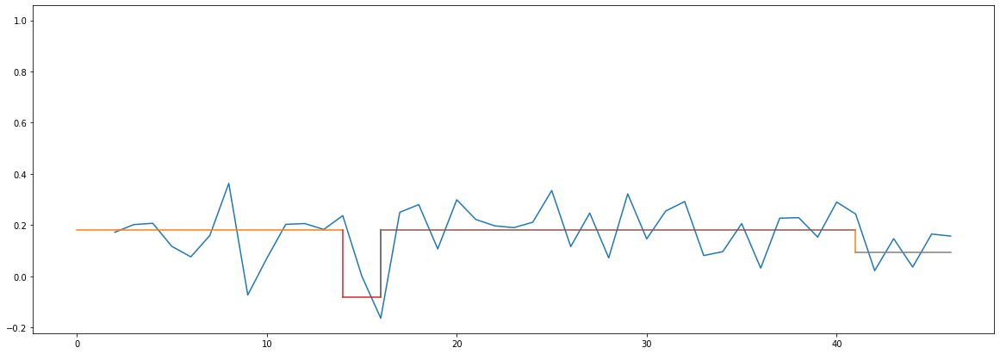

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.08724571428571429
New curren min is 0.26124571428571425
New curren min is 0.08724571428571429
New curren min is 0.26124571428571425
New curren min is 0.17399999999999993
MEAN BEFORE:
[{'mean': 0.1797457142857143, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.1797457142857143, 'start': 16, 'end': 41}, {'mean': 0.0925, 'start': 41, 'end': -1}]
MEANS AFTER
[{'mean': 0.13612285714285716, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.13612285714285716, 'start': 16, 'end': 41}, {'mean': 0.13612285714285716, 'start': 41, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.13612285714285716}, {'x': 16, 'y_1': -0.08149999999999995, 'y_2': 0.13612285714285716}, {'x': 41, 'y_1': 0.13612285714285716

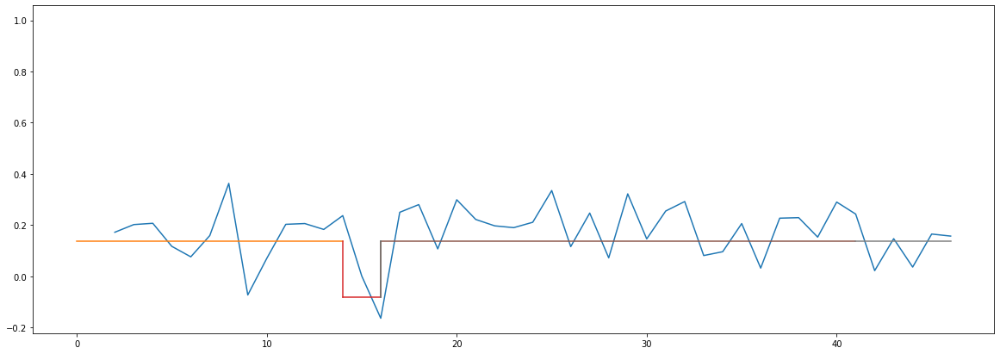

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.21762285714285712
New curren min is 0.21762285714285712
New curren min is 0.21762285714285712
MEAN BEFORE:
[{'mean': 0.13612285714285716, 'start': 0, 'end': 14}, {'mean': -0.08149999999999995, 'start': 14, 'end': 16}, {'mean': 0.13612285714285716, 'start': 16, 'end': 41}, {'mean': 0.13612285714285716, 'start': 41, 'end': -1}]
MEANS AFTER
[{'mean': 0.027311428571428605, 'start': 0, 'end': 14}, {'mean': 0.027311428571428605, 'start': 14, 'end': 16}, {'mean': 0.027311428571428605, 'start': 16, 'end': 41}, {'mean': 0.027311428571428605, 'start': 41, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.027311428571428605}, {'x': 16, 'y_1': 0.027311428571428605, 'y_2': 0.027311428571428605}, {'x': 41, 'y_1': 0.027311428571428605, 'y_2': 0.027311428571428605}, {'x': 14, 'y_1': 0.0273

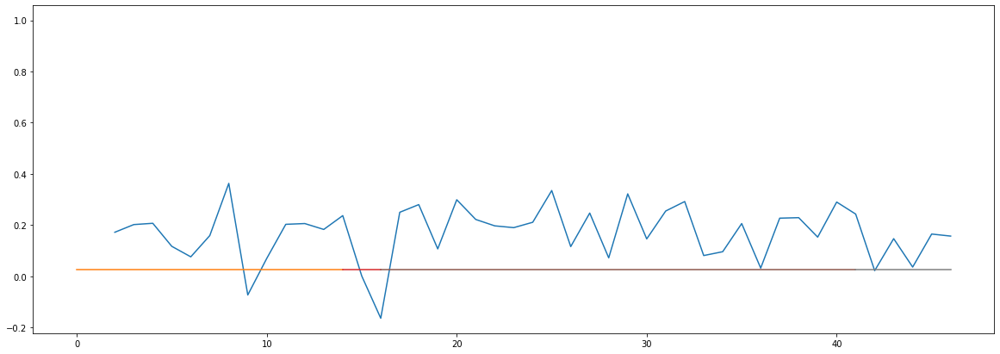

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 26                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 244, 'value': 1.5726082006152542}, {'index': 367, 'value': 0.49097901292415347}, {'index': 434, 'value': 0.7299610719857599}, {'index': 349, 'value': 0.6291202667195097}]


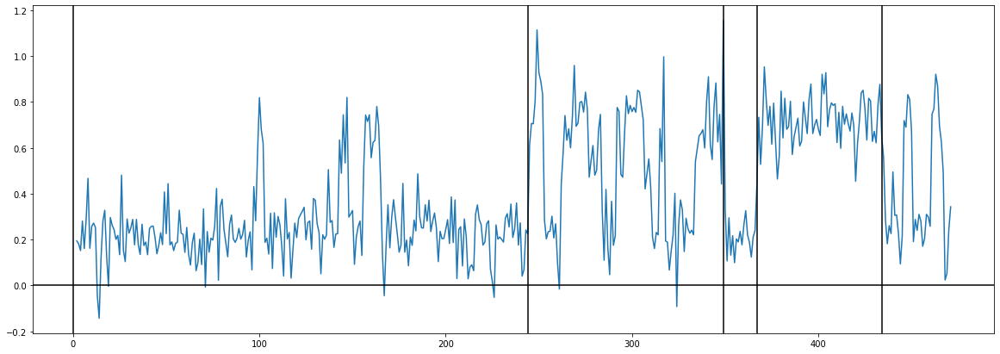

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 244, 367, 434, 349]
Transitionpoints indices without doubles: [  0 244 349 367 434]
Transitionpoints ordered: [0, 244, 349, 367, 434]
START:
0
______________
END
244
______________
START:
244
______________
END
349
______________
START:
349
______________
END
367
______________
START:
367
______________
END
434
______________
START:
434
______________
END
-1
______________
MEANS:
[{'mean': 0.2541598360655736, 'start': 0, 'end': 244}, {'mean': 0.5301619047619047, 'start': 244, 'end': 349}, {'mean': 0.22205555555555556, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'start': 367, 'end': 434}, {'mean': 0.41319444444444436, 'start': 434, 'end': -1}]


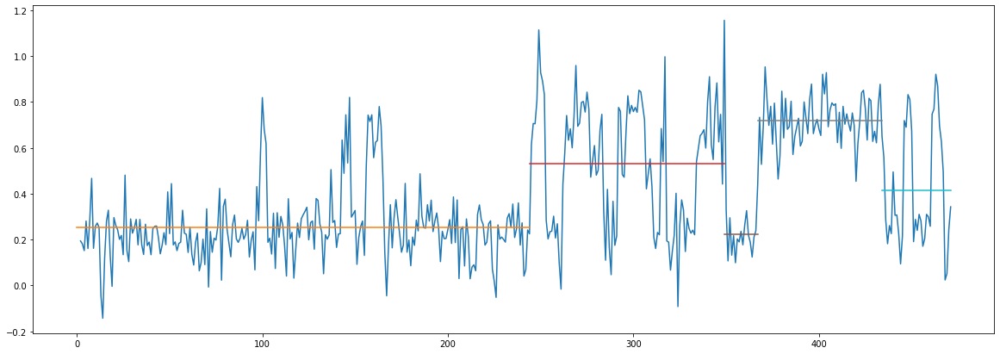

The value at 68.2% is 3.41


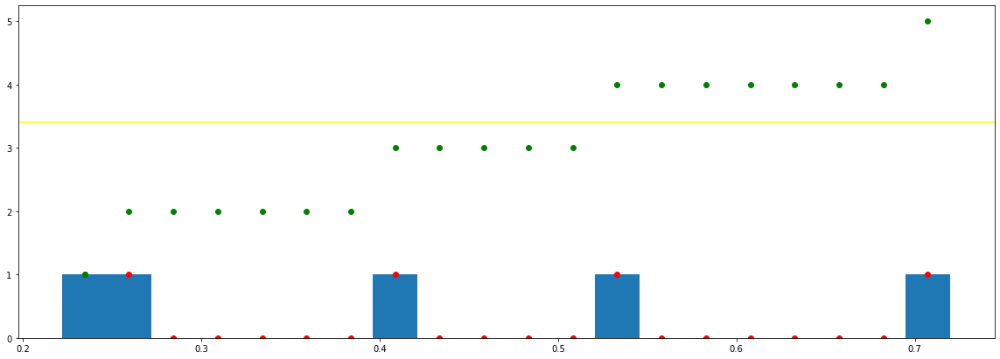

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.3065518242122722
New curren min is 0.27600206869633115
New curren min is 0.03210428051001801
New curren min is 0.46558643259114296
New curren min is 0.1590346083788708
New curren min is 0.30810634920634916
New curren min is 0.1895843638948118
New curren min is 0.11696746031746036
New curren min is 0.497690713101161
New curren min is 0.1911388888888888
MEAN BEFORE:
[{'mean': 0.2541598360655736, 'start': 0, 'end': 244}, {'mean': 0.5301619047619047, 'start': 244, 'end': 349}, {'mean': 0.22205555555555556, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'start': 367, 'end': 434}, {'mean': 0.41319444444444436, 'start': 434, 'end': -1}]
MEANS AFTER
[{'mean': 0.23810769581056457, 'start': 0, 'end': 244}, {'mean': 0.5301619047619047, 'start': 244, 'end': 349}, {'mean': 0.238107695

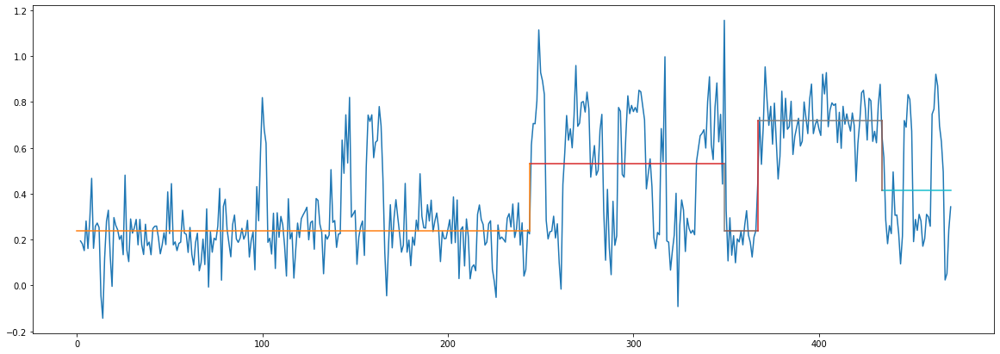

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.3065518242122722
New curren min is 0.29205420895134016
New curren min is 0.48163857284615197
New curren min is 0.1750867486338798
New curren min is 0.29205420895134016
New curren min is 0.1895843638948118
New curren min is 0.11696746031746036
New curren min is 0.48163857284615197
New curren min is 0.1750867486338798
MEAN BEFORE:
[{'mean': 0.23810769581056457, 'start': 0, 'end': 244}, {'mean': 0.5301619047619047, 'start': 244, 'end': 349}, {'mean': 0.23810769581056457, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'start': 367, 'end': 434}, {'mean': 0.41319444444444436, 'start': 434, 'end': -1}]
MEANS AFTER
[{'mean': 0.23810769581056457, 'start': 0, 'end': 244}, {'mean': 0.4716781746031745, 'start': 244, 'end': 349}, {'mean': 0.23810769581056457, 'start': 349, 'end': 367}

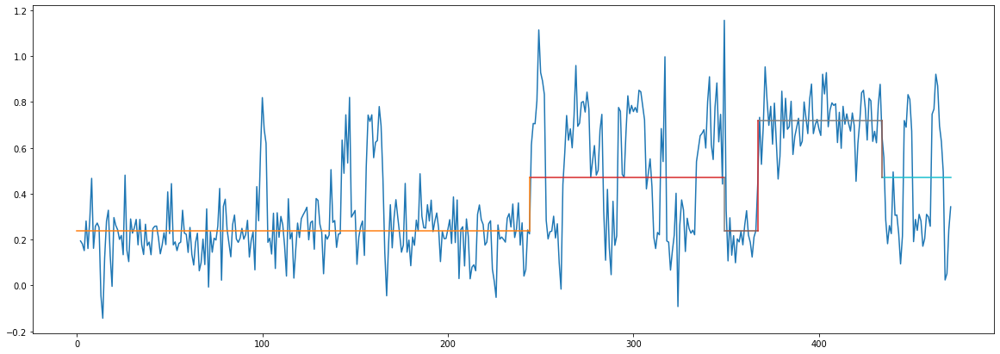

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.24806809405354202
New curren min is 0.23357047879260995
New curren min is 0.48163857284615197
New curren min is 0.23357047879260995
New curren min is 0.23357047879260995
New curren min is 0.24806809405354202
New curren min is 0.48163857284615197
New curren min is 0.23357047879260995
MEAN BEFORE:
[{'mean': 0.23810769581056457, 'start': 0, 'end': 244}, {'mean': 0.4716781746031745, 'start': 244, 'end': 349}, {'mean': 0.23810769581056457, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'start': 367, 'end': 434}, {'mean': 0.4716781746031745, 'start': 434, 'end': -1}]
MEANS AFTER
[{'mean': 0.35489293520686954, 'start': 0, 'end': 244}, {'mean': 0.35489293520686954, 'start': 244, 'end': 349}, {'mean': 0.35489293520686954, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'st

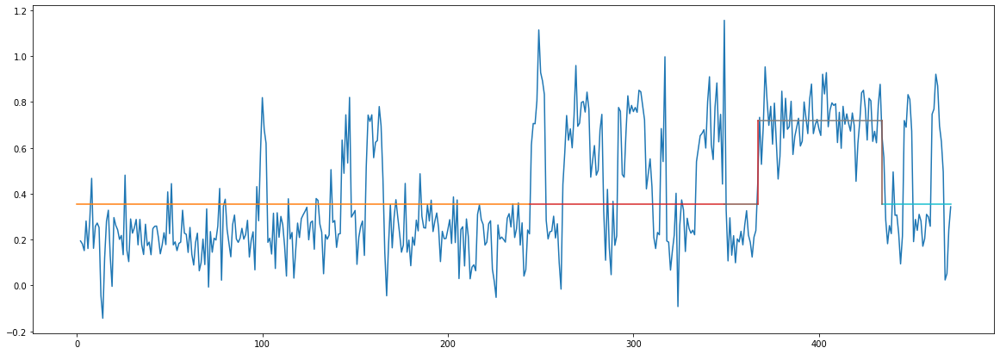

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
New curren min is 0.364853333449847
New curren min is 0.364853333449847
New curren min is 0.364853333449847
New curren min is 0.364853333449847
MEAN BEFORE:
[{'mean': 0.35489293520686954, 'start': 0, 'end': 244}, {'mean': 0.35489293520686954, 'start': 244, 'end': 349}, {'mean': 0.35489293520686954, 'start': 349, 'end': 367}, {'mean': 0.7197462686567165, 'start': 367, 'end': 434}, {'mean': 0.35489293520686954, 'start': 434, 'end': -1}]
MEANS AFTER
[{'mean': 0.5373196019317931, 'start': 0, 'end': 244}, {'mean': 0.5373196019317931, 'start': 244, 'end': 349}, {'mean': 0.5373196019317931, 'start': 349, 'end': 367}, {'mean': 0.5373196019317931, 'start': 367, 'end': 434}, {'mean': 0.5373196019317931, 'start': 434, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.5373196019317931}, {'x': 244, 'y_1': 

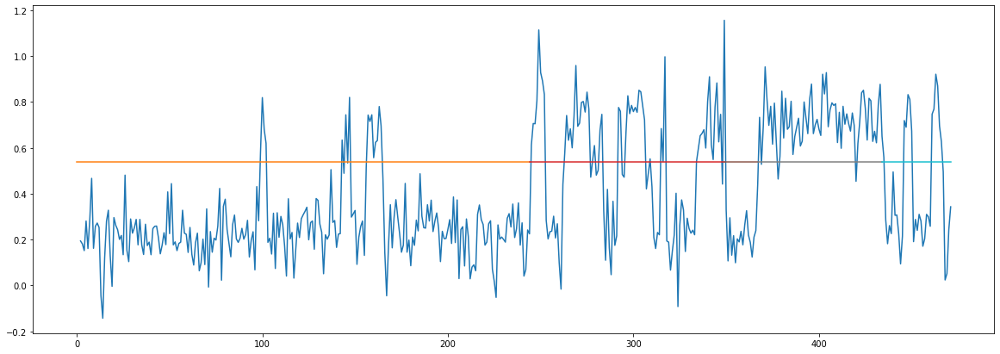

___________________________________________________________________________________
Blending Cycle Nr. 5
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 27                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 141, 'value': 0.12110744804511647}, {'index': 143, 'value': 0.13574255657923445}, {'index': 142, 'value': 0.11737972567696689}, {'index': 143, 'value': 0.11773327906756012}]


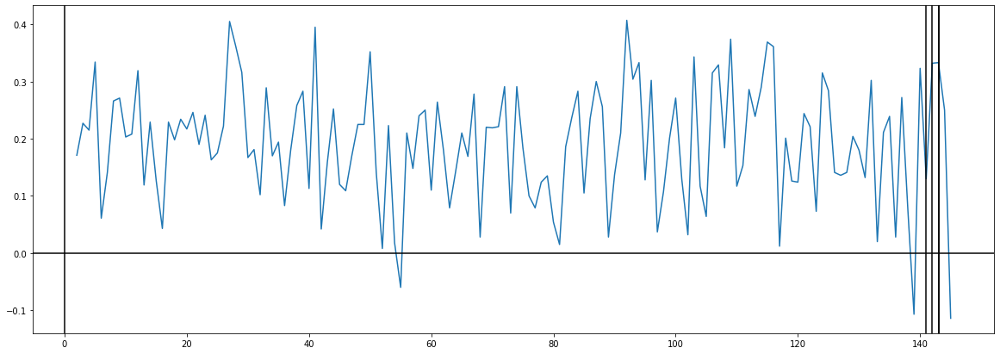

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 141, 143, 142, 143]
Transitionpoints indices without doubles: [  0 141 142 143]
Transitionpoints ordered: [0, 141, 142, 143]
START:
0
______________
END
141
______________
START:
141
______________
END
142
______________
START:
142
______________
END
143
______________
START:
143
______________
END
-1
______________
MEANS:
[{'mean': 0.191177304964539, 'start': 0, 'end': 141}, {'mean': 0.332, 'start': 141, 'end': 142}, {'mean': 0.3329999999999999, 'start': 142, 'end': 143}, {'mean': 0.25, 'start': 143, 'end': -1}]


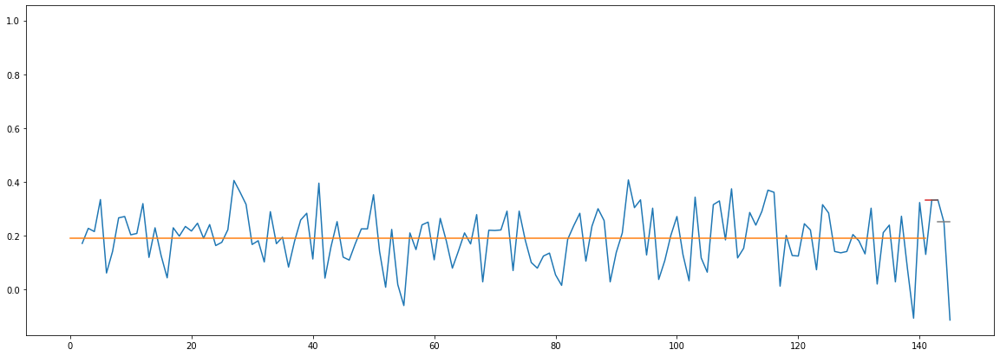

The value at 68.2% is 2.728


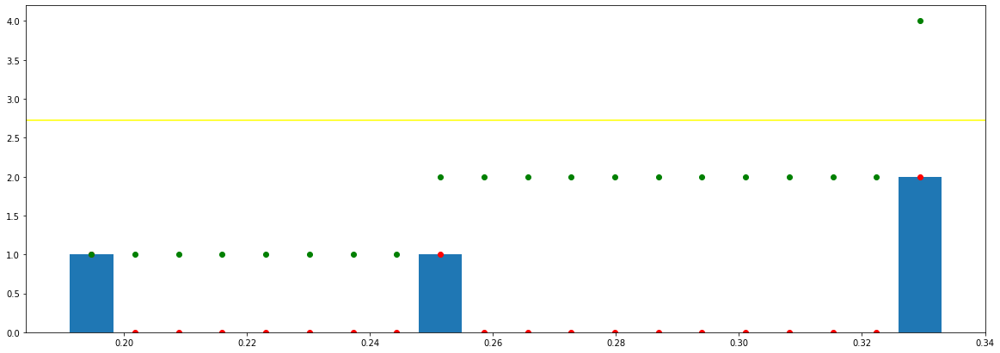

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.08299999999999991
New curren min is 0.14082269503546102
New curren min is 0.1418226950354609
New curren min is 0.058822695035461
New curren min is 0.0009999999999998899
New curren min is 0.08200000000000002
MEAN BEFORE:
[{'mean': 0.191177304964539, 'start': 0, 'end': 141}, {'mean': 0.332, 'start': 141, 'end': 142}, {'mean': 0.3329999999999999, 'start': 142, 'end': 143}, {'mean': 0.25, 'start': 143, 'end': -1}]
MEANS AFTER
[{'mean': 0.191177304964539, 'start': 0, 'end': 141}, {'mean': 0.33249999999999996, 'start': 141, 'end': 142}, {'mean': 0.33249999999999996, 'start': 142, 'end': 143}, {'mean': 0.25, 'start': 143, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.191177304964539}, {'x': 141, 'y_1': 0.191177304964539, 'y_2': 0.33249999999999996}, {'x': 143, 'y_1': 0.3324999

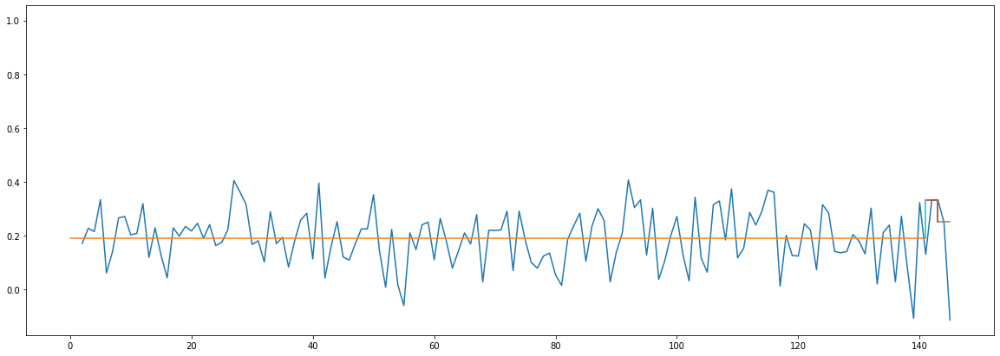

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.08249999999999996
New curren min is 0.14132269503546097
New curren min is 0.14132269503546097
New curren min is 0.058822695035461
New curren min is 0.08249999999999996
MEAN BEFORE:
[{'mean': 0.191177304964539, 'start': 0, 'end': 141}, {'mean': 0.33249999999999996, 'start': 141, 'end': 142}, {'mean': 0.33249999999999996, 'start': 142, 'end': 143}, {'mean': 0.25, 'start': 143, 'end': -1}]
MEANS AFTER
[{'mean': 0.2205886524822695, 'start': 0, 'end': 141}, {'mean': 0.33249999999999996, 'start': 141, 'end': 142}, {'mean': 0.33249999999999996, 'start': 142, 'end': 143}, {'mean': 0.2205886524822695, 'start': 143, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.2205886524822695}, {'x': 141, 'y_1': 0.2205886524822695, 'y_2': 0.33249999999999996}, {'x': 143, 'y_1': 0.33249999999999

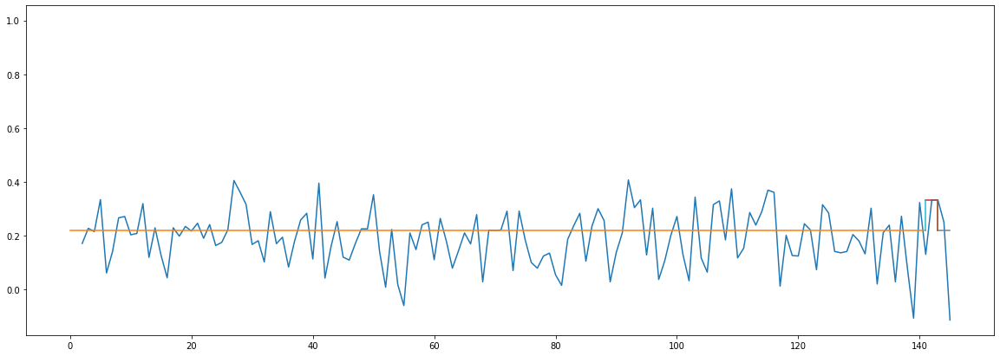

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.11191134751773046
New curren min is 0.11191134751773046
New curren min is 0.11191134751773046
New curren min is 0.11191134751773046
MEAN BEFORE:
[{'mean': 0.2205886524822695, 'start': 0, 'end': 141}, {'mean': 0.33249999999999996, 'start': 141, 'end': 142}, {'mean': 0.33249999999999996, 'start': 142, 'end': 143}, {'mean': 0.2205886524822695, 'start': 143, 'end': -1}]
MEANS AFTER
[{'mean': 0.27654432624113473, 'start': 0, 'end': 141}, {'mean': 0.27654432624113473, 'start': 141, 'end': 142}, {'mean': 0.27654432624113473, 'start': 142, 'end': 143}, {'mean': 0.27654432624113473, 'start': 143, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.27654432624113473}, {'x': 141, 'y_1': 0.27654432624113473, 'y_2': 0.27654432624113473}, {'x': 143, 'y_1': 0.27654432624113473, 'y_2': 0.276

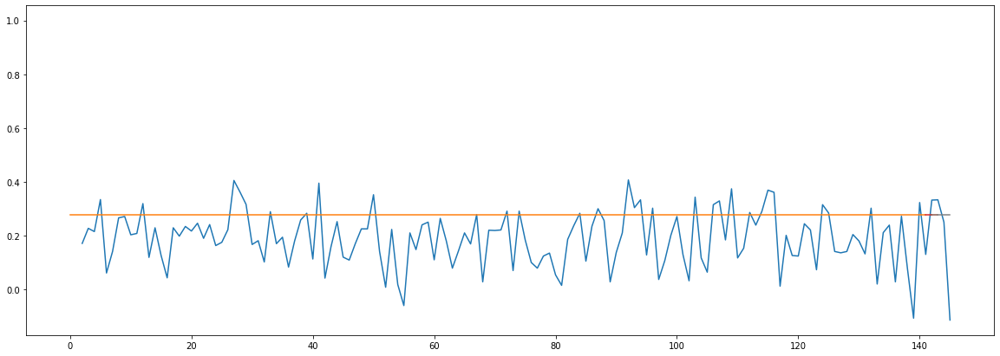

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 28                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 45, 'value': 0.11200528175265696}, {'index': 73, 'value': 0.18142410842730924}, {'index': 41, 'value': 0.12923288572723093}, {'index': 43, 'value': 0.15265683998318183}]


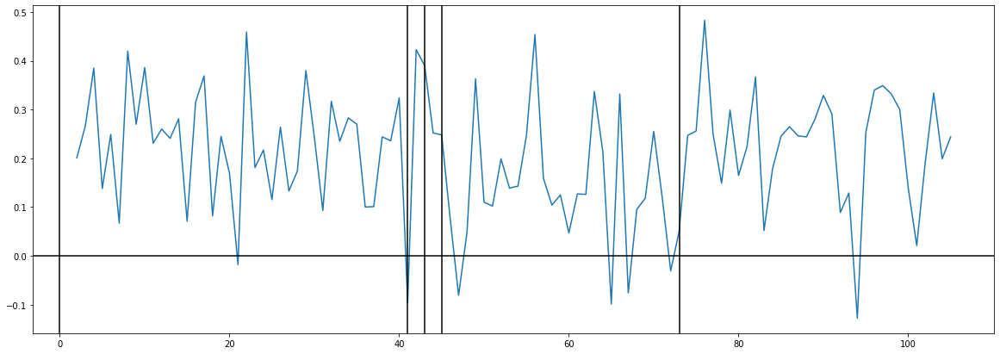

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 45, 73, 41, 43]
Transitionpoints indices without doubles: [ 0 41 43 45 73]
Transitionpoints ordered: [0, 41, 43, 45, 73]
START:
0
______________
END
41
______________
START:
41
______________
END
43
______________
START:
43
______________
END
45
______________
START:
45
______________
END
73
______________
START:
73
______________
END
-1
______________
MEANS:
[{'mean': 0.21960975609756098, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.25, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 73}, {'mean': 0.22958064516129031, 'start': 73, 'end': -1}]


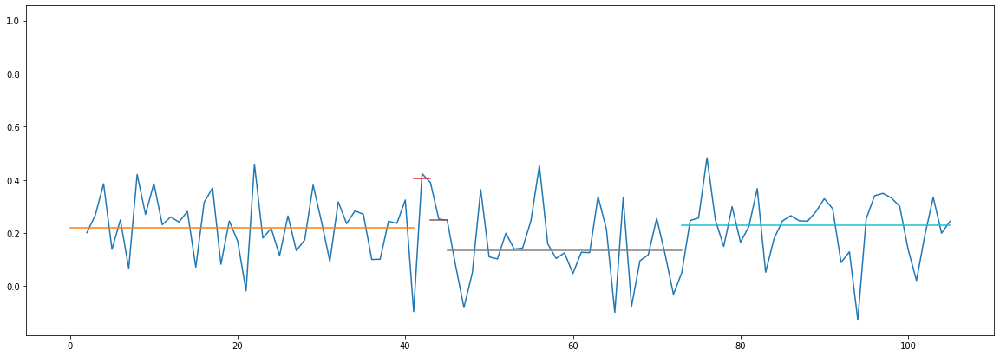

The value at 68.2% is 3.41


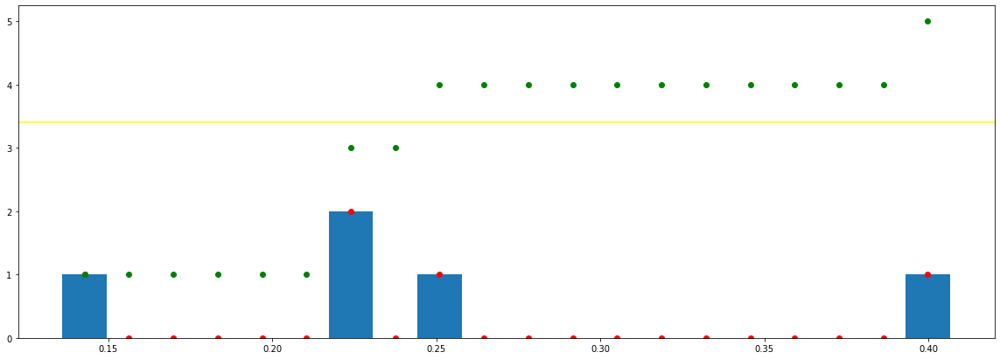

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.0935806451612903
New curren min is 0.186890243902439
New curren min is 0.030390243902439024
New curren min is 0.08360975609756097
New curren min is 0.009970889063729338
New curren min is 0.15649999999999997
New curren min is 0.27049999999999996
New curren min is 0.17691935483870966
New curren min is 0.11399999999999999
New curren min is 0.020419354838709686
MEAN BEFORE:
[{'mean': 0.21960975609756098, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.25, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 73}, {'mean': 0.22958064516129031, 'start': 73, 'end': -1}]
MEANS AFTER
[{'mean': 0.22459520062942565, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.25, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 

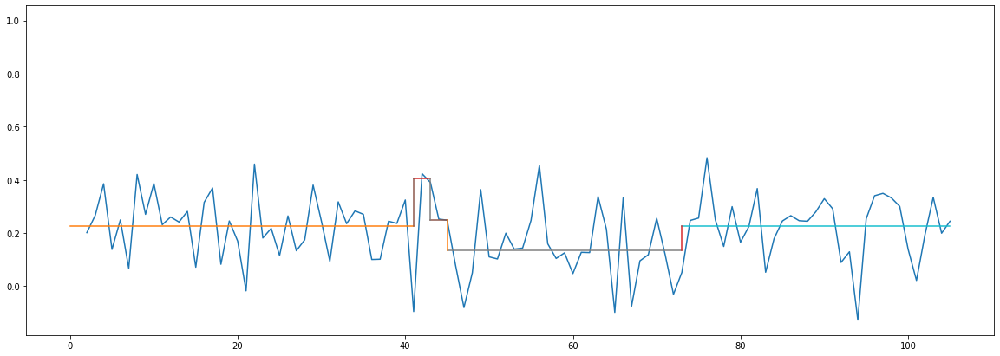

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.08859520062942564
New curren min is 0.18190479937057433
New curren min is 0.025404799370574355
New curren min is 0.08859520062942564
New curren min is 0.15649999999999997
New curren min is 0.27049999999999996
New curren min is 0.18190479937057433
New curren min is 0.11399999999999999
New curren min is 0.025404799370574355
MEAN BEFORE:
[{'mean': 0.22459520062942565, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.25, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 73}, {'mean': 0.22459520062942565, 'start': 73, 'end': -1}]
MEANS AFTER
[{'mean': 0.2372976003147128, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.2372976003147128, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 73}, {'mean': 0.2372976

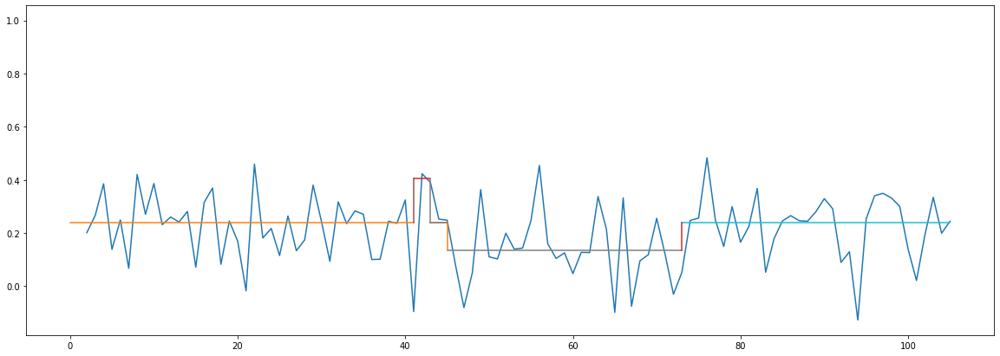

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.1012976003147128
New curren min is 0.16920239968528716
New curren min is 0.1012976003147128
New curren min is 0.16920239968528716
New curren min is 0.27049999999999996
New curren min is 0.16920239968528716
New curren min is 0.1012976003147128
MEAN BEFORE:
[{'mean': 0.2372976003147128, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.2372976003147128, 'start': 43, 'end': 45}, {'mean': 0.136, 'start': 45, 'end': 73}, {'mean': 0.2372976003147128, 'start': 73, 'end': -1}]
MEANS AFTER
[{'mean': 0.1866488001573564, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.1866488001573564, 'start': 43, 'end': 45}, {'mean': 0.1866488001573564, 'start': 45, 'end': 73}, {'mean': 0.1866488001573564, 'start': 73, 'end': -1}]
vertical_lines:
[{'x

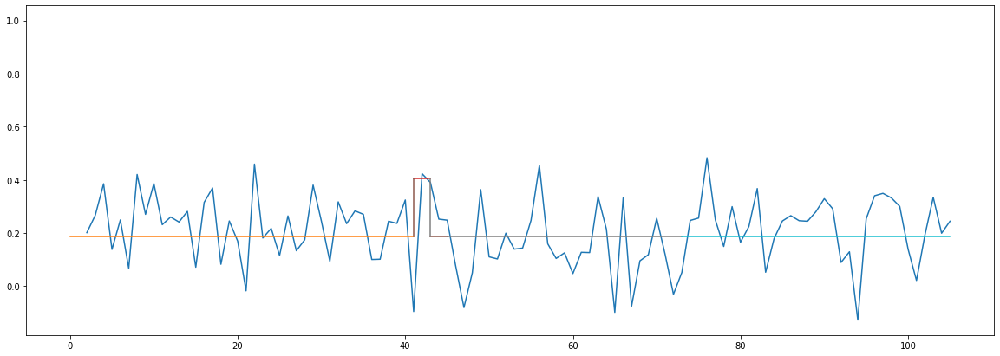

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
New curren min is 0.21985119984264356
New curren min is 0.21985119984264356
New curren min is 0.21985119984264356
New curren min is 0.21985119984264356
MEAN BEFORE:
[{'mean': 0.1866488001573564, 'start': 0, 'end': 41}, {'mean': 0.4065, 'start': 41, 'end': 43}, {'mean': 0.1866488001573564, 'start': 43, 'end': 45}, {'mean': 0.1866488001573564, 'start': 45, 'end': 73}, {'mean': 0.1866488001573564, 'start': 73, 'end': -1}]
MEANS AFTER
[{'mean': 0.2965744000786782, 'start': 0, 'end': 41}, {'mean': 0.2965744000786782, 'start': 41, 'end': 43}, {'mean': 0.2965744000786782, 'start': 43, 'end': 45}, {'mean': 0.2965744000786782, 'start': 45, 'end': 73}, {'mean': 0.2965744000786782, 'start': 73, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.2965744000786782}, {'x': 45, 'y_1': 0.2965744000786782, 'y_2'

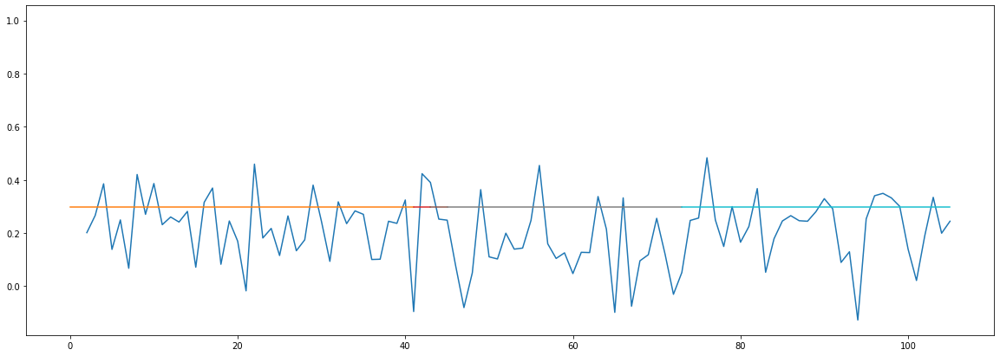

___________________________________________________________________________________
Blending Cycle Nr. 5
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
             CURRENT ID: 29                 
_______________________________________________
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
_______________________________________________
___________________________________________________
FIND TRANSITION POINTS
___________________________________________________
[{'index': 0, 'value': 0}, {'index': 3, 'value': 0.16940120669314462}, {'index': 13, 'value': 0.10462351606315823}, {'index': 10, 'value': 0.1700666570999231}, {'index': 12, 'value': 0.174460833505682}]


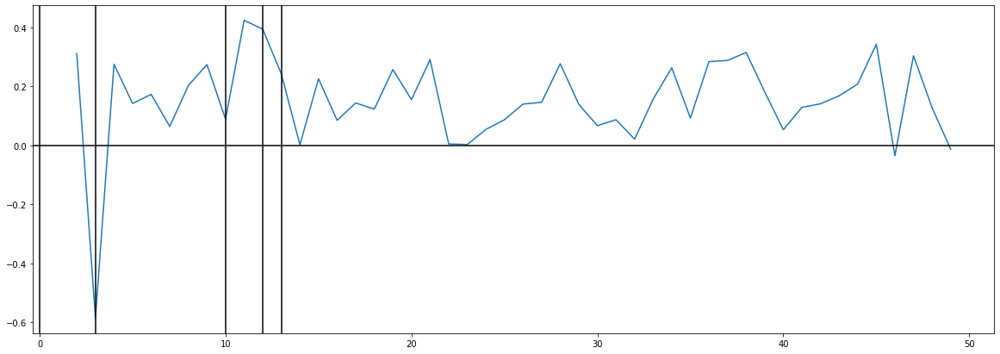

___________________________________________________
FIND LEVELS
___________________________________________________
Transitionpoints indices: [0, 3, 13, 10, 12]
Transitionpoints indices without doubles: [ 0  3 10 12 13]
Transitionpoints ordered: [0, 3, 10, 12, 13]
START:
0
______________
END
3
______________
START:
3
______________
END
10
______________
START:
10
______________
END
12
______________
START:
12
______________
END
13
______________
START:
13
______________
END
-1
______________
MEANS:
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.17428571428571432, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 10, 'end': 12}, {'mean': 0.242, 'start': 12, 'end': 13}, {'mean': 0.15225714285714284, 'start': 13, 'end': -1}]


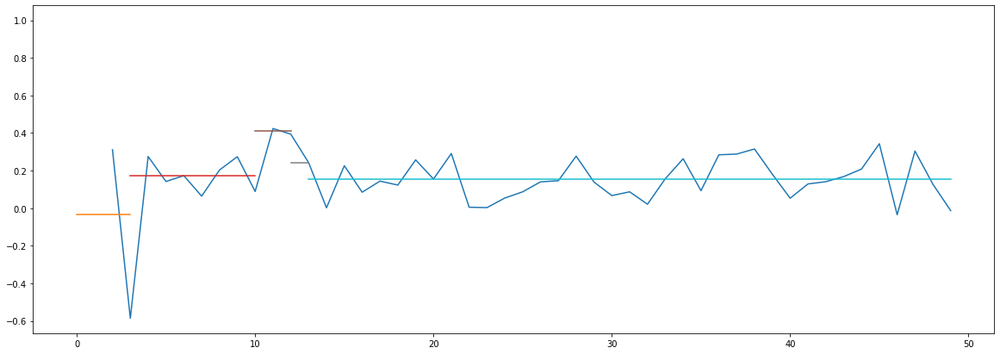

The value at 68.2% is 3.41


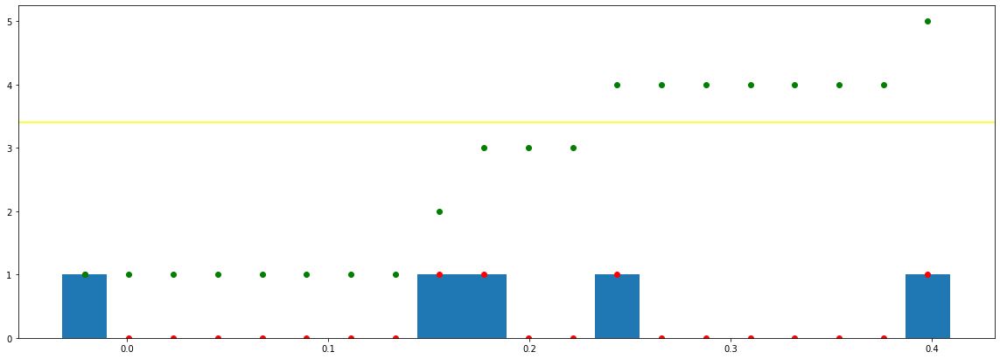

___________________________________________________________________________________
Blending Cycle Nr. 1
___________________________________________________________________________________
New curren min is 0.08974285714285715
New curren min is 0.20628571428571432
New curren min is 0.4409999999999999
New curren min is 0.27399999999999997
New curren min is 0.18425714285714284
New curren min is 0.2347142857142856
New curren min is 0.06771428571428567
New curren min is 0.02202857142857148
New curren min is 0.16699999999999993
New curren min is 0.25674285714285705
MEAN BEFORE:
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.17428571428571432, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 10, 'end': 12}, {'mean': 0.242, 'start': 12, 'end': 13}, {'mean': 0.15225714285714284, 'start': 13, 'end': -1}]
MEANS AFTER
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.16327142857142857, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 

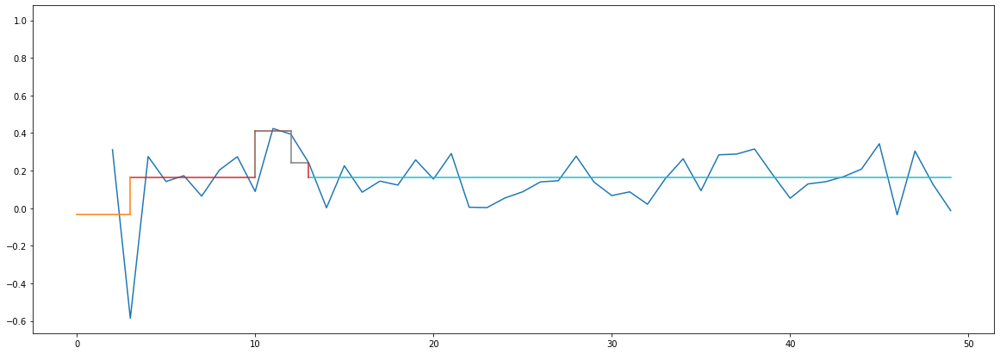

___________________________________________________________________________________
Blending Cycle Nr. 2
___________________________________________________________________________________
New curren min is 0.07872857142857143
New curren min is 0.19527142857142857
New curren min is 0.4409999999999999
New curren min is 0.27399999999999997
New curren min is 0.19527142857142857
New curren min is 0.24572857142857135
New curren min is 0.07872857142857143
New curren min is 0.16699999999999993
New curren min is 0.24572857142857135
MEAN BEFORE:
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.16327142857142857, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 10, 'end': 12}, {'mean': 0.242, 'start': 12, 'end': 13}, {'mean': 0.16327142857142857, 'start': 13, 'end': -1}]
MEANS AFTER
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.20263571428571428, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 10, 'end': 12}, {'mean': 0.2026357142

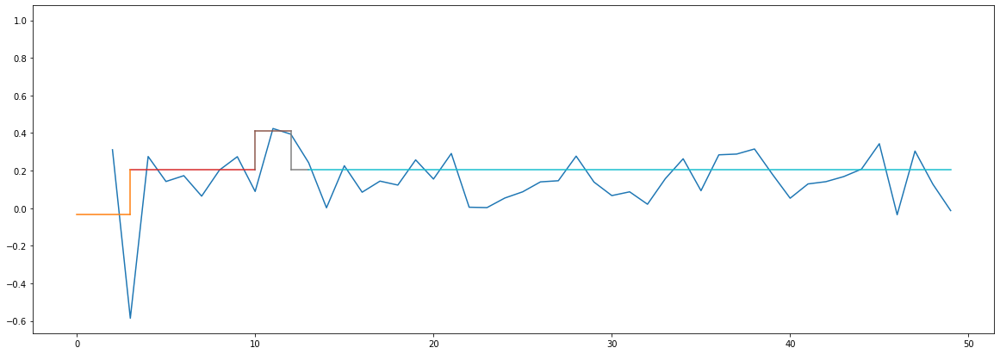

___________________________________________________________________________________
Blending Cycle Nr. 3
___________________________________________________________________________________
New curren min is 0.23463571428571428
New curren min is 0.4409999999999999
New curren min is 0.23463571428571428
New curren min is 0.23463571428571428
New curren min is 0.20636428571428564
New curren min is 0.20636428571428564
New curren min is 0.20636428571428564
MEAN BEFORE:
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.20263571428571428, 'start': 3, 'end': 10}, {'mean': 0.4089999999999999, 'start': 10, 'end': 12}, {'mean': 0.20263571428571428, 'start': 12, 'end': 13}, {'mean': 0.20263571428571428, 'start': 13, 'end': -1}]
MEANS AFTER
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.3058178571428571, 'start': 3, 'end': 10}, {'mean': 0.3058178571428571, 'start': 10, 'end': 12}, {'mean': 0.3058178571428571, 'start': 12, 'end': 13}, {'mean': 0.3058178571428571, '

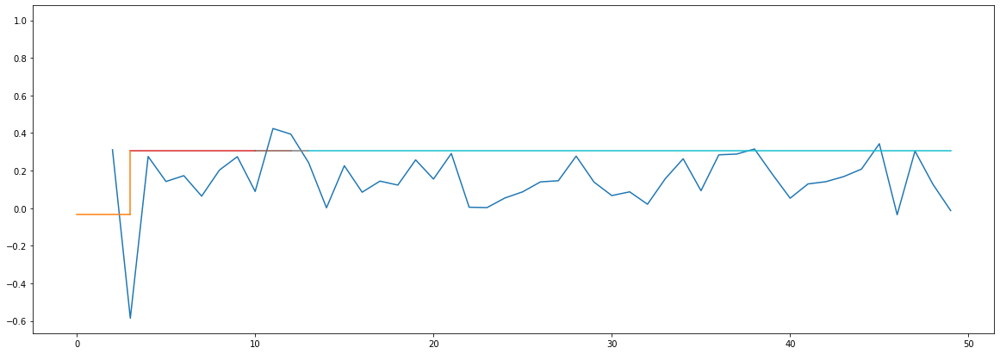

___________________________________________________________________________________
Blending Cycle Nr. 4
___________________________________________________________________________________
New curren min is 0.33781785714285706
New curren min is 0.33781785714285706
New curren min is 0.33781785714285706
New curren min is 0.33781785714285706
MEAN BEFORE:
[{'mean': -0.031999999999999994, 'start': 0, 'end': 3}, {'mean': 0.3058178571428571, 'start': 3, 'end': 10}, {'mean': 0.3058178571428571, 'start': 10, 'end': 12}, {'mean': 0.3058178571428571, 'start': 12, 'end': 13}, {'mean': 0.3058178571428571, 'start': 13, 'end': -1}]
MEANS AFTER
[{'mean': 0.13690892857142856, 'start': 0, 'end': 3}, {'mean': 0.13690892857142856, 'start': 3, 'end': 10}, {'mean': 0.13690892857142856, 'start': 10, 'end': 12}, {'mean': 0.13690892857142856, 'start': 12, 'end': 13}, {'mean': 0.13690892857142856, 'start': 13, 'end': -1}]
vertical_lines:
[{'x': 0, 'y_1': 0, 'y_2': 0.13690892857142856}, {'x': 3, 'y_1': 0.1369089

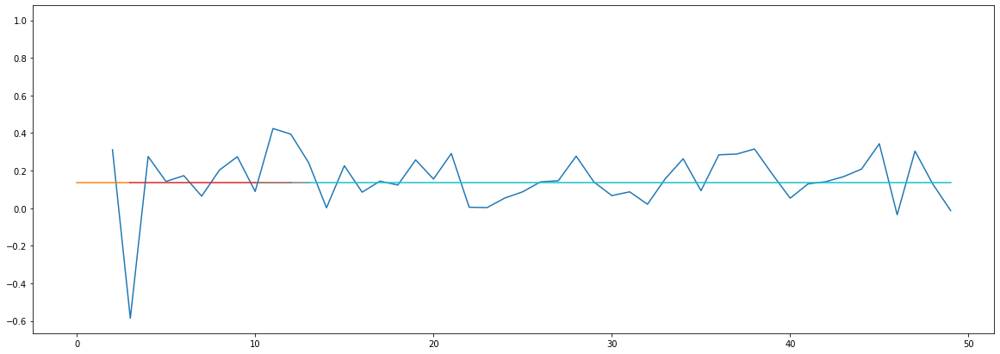

___________________________________________________________________________________
Blending Cycle Nr. 5
___________________________________________________________________________________
THERE IS ONLY ONE MEAN VALUE LEFT


In [12]:
# T-Test

#Probeliste:

#liste_y = [1,4,2,4,2,3,4,2,1,4,2,2,2,4,3,3,2,1,3,4,3,2,1,2,3,4,2,3,3,1,2,3,3,4,3,3,2,1,2,3,2,7,8,8,8,7,6,7,8,9,8,7,7,6,7,8,8,9,8,7,7,7,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,1,2,3,8,7,8,7,7,6,9,7,1,2,3,1,2,1,2,3,2,1,2,]
#liste_y = [1,2,4,5,3,1,4,1,2,4,4,6,5,1,2,1,2,3,4,5,6,4,4,1,2,2,3,4,1,2,7,9,9,7,6,7,8,1,2,4,5,2,1,2,4,1,5,6,7,5,4,5,6,3,2,5,6,3,3,4,5,2,2,3,3,2]


#transition_search_loops = 2
transition_search_loops = 4

transition_treshold = 0.2

sigma = 2

blending_cycles = 6

max_diff = 1
#max_diff = 10

#----------------------------------------------------------

ID_set = set()

for row in range(len(data_section_global_and_local)):
    ID_set.add(int(data_section_global_and_local.iloc[row]["ID"]))

print(ID_set)

#das alles gern in function file verstecken, + ID set brauch ich ja öfter, vl von früher merken!

for ID in ID_set:

    print("_______________________________________________")
    print("XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX")
    print("_______________________________________________")
    print(f'             CURRENT ID: {ID}                 ')
    print("_______________________________________________")
    print("XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX")
    print("_______________________________________________")

    value_list = []

    for row in range(len(data_section_global_and_local)):

        if data_section_global_and_local.iloc[row]["ID"] != ID:
            continue
        else:
            value = data_section_global_and_local.iloc[row]["FRET efficiency"]
            value_list.append(value)

    transition_points = smFRET.find_transition_points(value_list, sigma, transition_search_loops, transition_treshold)

    test = smFRET.find_levels(value_list, transition_points, blending_cycles, max_diff)
